In [15]:
#load package
.libPaths(c("/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3/envs/r4.1.2/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3_2/envs/Rsplot/lib/R/library"))
library(data.table)
library(qs)
library(GenomicRanges)
library(GenomicFeatures)
library(rtracklayer)
library(dplyr)
library(ggbio)
library(reshape2)
library(ggsci)
library(viridis)
library(ggpubr)
library(ggh4x)
library(ggtranscript)
library(khroma)
library(bambu)
library(Seurat)
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}

In [2]:
#dir.create("data/cross_region")
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")
fsraw.cor = qread("data/reads_full_anotation/main_data_read_total_annotation_fil_delete_multiread_25_10_09.qs")

In [4]:
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")

In [ ]:
head(fsraw.cor)

In [9]:
theme_presentation<- function(base_size = 16, base_family = "") {
    # Starts with theme_grey and then modify some parts
    theme_bw(base_size = base_size, base_family = base_family) %+replace%
      theme(
        strip.background = element_blank(),
        strip.text.x = element_text(size=16,colour="white"),
        strip.text.y = element_text(size=16,colour="white"),
        axis.text.x = element_blank(),
        axis.text.y = element_blank(),
        axis.ticks =  element_blank(), 
        axis.title.x= element_blank(),
        axis.title.y= element_blank(),
        panel.background = element_rect(fill="black"), 
        panel.border =element_blank(),  
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank(), 
        panel.margin = unit(1.0, "lines"), 
        plot.background = element_rect(fill="black"), 
        plot.title =element_text(size=16,colour="white"), 
        # plot.margin = unit(c(1,  1, 1, 1), "lines"),
        legend.background=element_rect(fill='black'),
        legend.title=element_text(size=12,colour="white"),
        legend.text=element_text(size=12,colour="white"),
        legend.key = element_rect( fill = 'black'),
        # legend.key.size = unit(c(0, 0), "lines"),
        axis.line.x = element_blank(),
        axis.line.y = element_blank()
      )
  }
  

In [4]:
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")
fsraw.cor.sub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus","Cortex"),]
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$cell_id) & fsraw.cor.sub$cell_id != "",]
unique(fsraw.cor.sub$class)

[1] "GLU"       "GABA"      "NonNeuron" "Glu"

In [5]:
qsave(fsraw.cor.sub,file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_11_17.qs")
# fsraw.cor.sub = qread(file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_10_22.qs")
# unique(fsraw.cor.sub$class)

### Annotation cross region

#### Build Cross region spatial matrix

In [2]:
refcell = fread("/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44_dedup_with_cellan_for_assign_23_03_23.txt")
head(refcell)

CBZ,origin_name,cell_label,cell_type_id
<chr>,<chr>,<int>,<dbl>
CB:Z:10204_26115,background,0,0
CB:Z:10205_26115,background,0,0
CB:Z:10206_26116,background,0,0
CB:Z:10199_26117,background,0,0
CB:Z:10201_26117,background,0,0
CB:Z:10203_26117,background,0,0


In [4]:
refcell = refcell[refcell$origin_name != "background",]
refcell$layer = MySplit(refcell$origin_name,"-",3)
refcell$region = MySplit(refcell$origin_name,"-",2)

groupan = data.frame("abv" = c("cb","cortex","HC","mb","p","str","v"),
                       "ano" = c("Cerebellum","Cortex","Hippocampus","Midbrain",
                                 "Pons","Striatum","Ventricle"))
refcell$subcortical = refcell$layer
refcell[refcell$subcortical %in% paste0("l",1:6),]$subcortical = "cortex"
refcell = refcell[refcell$subcortical != "c",]
refcell$subcortical = groupan[match(refcell$subcortical,groupan$abv),]$ano
qsave(refcell,file = "/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44_dedup_with_cellan_for_assign_cross_region_25_09_09.qs")

In [2]:
refcell = qread(file = "/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44_dedup_with_cellan_for_assign_cross_region_25_09_09.qs")
ngscount = fread("/cluster/home/xiliyuan/T44_info/total_gene_T44_macaque_f001_2D_macaque1-20230306.txt")
fsraw = qread("data/reads_full_anotation/main_data_read_total_annotation_24_09_04.qs")

In [63]:
refcell = qread(file = "/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44_dedup_with_cellan_for_assign_cross_region_25_09_09.qs")
subregi = "Hippocampus"
refcell.hub = refcell[refcell$subcortical == subregi,]
length(unique(refcell.hub$cell_label))
refcell.hub$x = as.numeric(MySplit(refcell.hub$CBZ,":|_",3))
refcell.hub$y = as.numeric(MySplit(refcell.hub$CBZ,":|_",4))
head(refcell.hub)
nrow(refcell.hub)
refcell.hub = refcell.hub[refcell.hub$cell_label != 0,]
write.csv(refcell.hub,file = "data/cross_region/Macaque_hippo/cellan_Hippo.csv",quote = F, row.names = F)

[1] 19757

CBZ,origin_name,cell_label,cell_type_id,layer,region,subcortical,x,y
<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>
CB:Z:17334_73135,L-preS-HC,0,0,HC,preS,Hippocampus,17334,73135
CB:Z:17332_73136,L-preS-HC,0,0,HC,preS,Hippocampus,17332,73136
CB:Z:17333_73136,L-preS-HC,0,0,HC,preS,Hippocampus,17333,73136
CB:Z:17334_73136,L-preS-HC,0,0,HC,preS,Hippocampus,17334,73136
CB:Z:17330_73137,L-preS-HC,0,0,HC,preS,Hippocampus,17330,73137
CB:Z:17337_73137,L-preS-HC,0,0,HC,preS,Hippocampus,17337,73137


[1] 14064263

In [3]:
#make region matrix
# subregi = "Cerebellum"
# outfile = "data/cross_region/total_genecount_df_cerebellum.csv"
subregi = "Hippocampus"
outfile = "data/cross_region/total_genecount_df_hippocampus.csv"

refcell.hub = refcell[refcell$subcortical == subregi,]
length(unique(refcell.hub$cell_label))
refcell.hub$x = as.numeric(MySplit(refcell.hub$CBZ,":|_",3))
refcell.hub$y = as.numeric(MySplit(refcell.hub$CBZ,":|_",4))
head(refcell.hub)
nrow(refcell.hub)
refcell.hub = refcell.hub[refcell.hub$cell_label != 0,]
nrow(refcell.hub)
ngscount.cb = ngscount[ngscount$cell_label %in% refcell.hub$cell_label,]

fsraw.cb = fsraw[fsraw$subcortical == subregi,]
fsraw.cb = fsraw.cb %>% group_by(gene_id,x,y) %>% summarise(count = length(unique(readid)))
fsraw.cb = merge(fsraw.cb,refcell.hub[,c("x","y","cell_label")],by = c("x","y"))
nrow(fsraw.cb)

head(fsraw.cb)
head(ngscount.cb)
ngscount.cb = ngscount.cb[,c("x","y","gene","umi_count","cell_label")]
colnames(ngscount.cb) = c("x","y","gene_id","count","cell_label")
#cellsp = unique(ngscount.cb[,c("x","y","cell_label")])
genedf = rbind(fsraw.cb,ngscount.cb)
genedf = genedf %>% group_by(gene_id,cell_label) %>% summarise(count = sum(count),
                                                               x = mean(unique(x)),
                                                               y = mean(unique(y)))
#genedf
#qsave(genedf,file = "data/cross_region/total_genecount_df_cerebellum.qs")
write.csv(genedf,file = outfile,row.names = F, quote = F)

[1] 19757

CBZ,origin_name,cell_label,cell_type_id,layer,region,subcortical,x,y
<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>
CB:Z:17334_73135,L-preS-HC,0,0,HC,preS,Hippocampus,17334,73135
CB:Z:17332_73136,L-preS-HC,0,0,HC,preS,Hippocampus,17332,73136
CB:Z:17333_73136,L-preS-HC,0,0,HC,preS,Hippocampus,17333,73136
CB:Z:17334_73136,L-preS-HC,0,0,HC,preS,Hippocampus,17334,73136
CB:Z:17330_73137,L-preS-HC,0,0,HC,preS,Hippocampus,17330,73137
CB:Z:17337_73137,L-preS-HC,0,0,HC,preS,Hippocampus,17337,73137


[1] 14064263

[1] 4327825

`summarise()` has grouped output by 'gene_id', 'x'. You can override using the
`.groups` argument.


[1] 1141031

,x,y,gene_id,count,cell_label
,<dbl>,<dbl>,<chr>,<int>,<int>
1,16892,74450,ACOT2,1,548929
2,16896,74397,LOC107128653,1,205404
3,16898,74443,LOC107128653,1,548929
4,16899,74453,ETFB,1,548929
5,16900,74449,LOC107128653,1,548929
6,16900,74449,LOC107128652,1,548929


gene,x,y,umi_count,cell_label,gene_area,rx,ry
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
FAM96B,17347,73144,4,172520,1455,50221,59832
THRAP3,17348,73144,1,172520,1455,50220,59832
HPCAL1,17345,73145,1,172520,1455,50223,59833
ND4,17345,73145,3,172520,1455,50223,59833
EVL,17351,73145,2,172520,1455,50217,59833
MAP7,17353,73145,1,172520,1455,50215,59833


`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


In [6]:
refcell.hub = read.csv("data/cross_region/cellan_cerebellum.csv")
head(refcell.hub)

,CBZ,origin_name,cell_label,cell_type_id,layer,region,subcortical,x,y
,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<dbl>
1,CB:Z:5930_84712,L-cb-cb,303632,0,cb,cb,Cerebellum,5930,84712
2,CB:Z:5938_84713,L-cb-cb,303632,0,cb,cb,Cerebellum,5938,84713
3,CB:Z:5940_84713,L-cb-cb,303632,0,cb,cb,Cerebellum,5940,84713
4,CB:Z:5944_84713,L-cb-cb,303632,0,cb,cb,Cerebellum,5944,84713
5,CB:Z:5931_84714,L-cb-cb,303632,0,cb,cb,Cerebellum,5931,84714
6,CB:Z:5943_84714,L-cb-cb,303632,0,cb,cb,Cerebellum,5943,84714


In [5]:
#build cerebellum expression matrix
ngscount = fread("/cluster/home/xiliyuan/T44_info/total_gene_T44_macaque_f001_2D_macaque1-20230306.txt")
head(ngscount)

gene,x,y,umi_count,cell_label,gene_area,rx,ry
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
SPARCL1,10204,26115,2,0,0,56131,12632
DNAH7,10204,26115,1,0,0,56131,12632
ANAPC15,10204,26115,1,0,0,56131,12632
MOB4,10205,26115,1,0,0,56130,12632
OPCML,10205,26115,1,0,0,56130,12632
NGEF,10206,26116,2,0,0,56129,12633


In [13]:
ngscount.cb = ngscount[ngscount$cell_label %in% refcell.hub$cell_label,]
nrow(ngscount.cb)

[1] 16651200

In [9]:
# ngscount.cb = ngscount.cb %>% group_by(cell_label,gene) %>% 
#                 summarise(umi_count = sum(umi_count),x = mean(unique(x)),y = mean(unique(y)))
# nrow(ngscount.cb)
# qsave(ngscount.cb,file = "data/cross_region/ngs_genecount_df_cerebellum.qs")

`summarise()` has grouped output by 'cell_label'. You can override using the
`.groups` argument.


[1] 14316972

In [8]:
#build cb long reads matrix
fsraw = qread("data/reads_full_anotation/main_data_read_total_annotation_24_09_04.qs")
head(fsraw)

readid,origin_name,cell_id,cell_type_id,subclass,class,transcript_id,gene_id,x,y,layer,region,lobe,subcortical,readcount
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>
00000033-e8ce-4144-8ded-93a772582329-14;st_ed:A:10616-11399;AD:A:adapterJ-adapterK;AP:A:Correct_739-763:+,L-lv-v,NA,NA,,,XM_005540610.2,NUCKS1,19690,62662,v,lv,NA,Ventricle,9933
00000033-e8ce-4144-8ded-93a772582329-3;st_ed:A:1542-1993;AD:A:adapterD-adapterE;AP:A:Correct_413-432:+,L-cb-cb,NA,NA,,,XM_005581643.2,MLLT3,7970,88627,cb,cb,NA,Cerebellum,1966
00000033-e8ce-4144-8ded-93a772582329-3;st_ed:A:1542-1993;AD:A:adapterD-adapterE;AP:A:Correct_413-432:+,L-cb-cb,NA,NA,,,XM_005581643.2,MLLT3,7970,88627,cb,cb,NA,Cerebellum,1966
00000033-e8ce-4144-8ded-93a772582329-3;st_ed:A:1542-1993;AD:A:adapterD-adapterE;AP:A:Correct_413-432:+,L-cb-cb,NA,NA,,,XM_005581643.2,MLLT3,7970,88627,cb,cb,NA,Cerebellum,1966
00000036-9da5-46f6-80c5-a6a0bee7474f-2;st_ed:A:646-1552;AD:A:adapterC-adapterD;AP:A:Correct_863-887:+,L-TEpv-l4,NA,NA,,,GPX4-WeiLab-1,GPX4,37772,84660,l4,TEpv,temporal,Cortex,6884
0000009e-f52a-4eb5-97dd-4ad22c3acd50-4;st_ed:A:1918-2609;AD:A:adapterL-adapterN;AP:A:Jump|AD:A:no-split|ts-te:103-320,L-1|2-l5,996777,77,L4/5,GLU,XM_005582166.2,STXBP1,14185,29617,l5,1|2,somatosensory,Cortex,56275


In [10]:
fsraw.cb = fsraw[fsraw$subcortical == "Cerebellum",]
fsraw.cb = fsraw.cb %>% group_by(gene_id,x,y) %>% summarise(count = length(unique(readid)))
fsraw.cb = merge(fsraw.cb,refcell.hub[,c("x","y","cell_label")],by = c("x","y"))
nrow(fsraw.cb)
qsave(fsraw.cb,file = "data/cross_region/nano_genecount_df_cerebellum.qs")

`summarise()` has grouped output by 'gene_id', 'x'. You can override using the
`.groups` argument.


[1] 2216632

In [14]:
head(fsraw.cb)
head(ngscount.cb)
ngscount.cb = ngscount.cb[,c("x","y","gene","umi_count","cell_label")]
colnames(ngscount.cb) = c("x","y","gene_id","count","cell_label")
#cellsp = unique(ngscount.cb[,c("x","y","cell_label")])
genedf = rbind(fsraw.cb,ngscount.cb)
genedf = genedf %>% group_by(gene_id,cell_label) %>% summarise(count = sum(count),
                                                               x = mean(unique(x)),
                                                               y = mean(unique(y)))
genedf
qsave(genedf,file = "data/cross_region/total_genecount_df_cerebellum.qs")

,x,y,gene_id,count,cell_label
,<dbl>,<dbl>,<chr>,<int>,<int>
1,15320,87919,MAP1B,1,535959
2,15321,87906,TSPAN18,1,535959
3,15328,87888,APP,2,50263
4,15329,87906,ROMO1,1,50263
5,15330,87899,PRPF31,1,50263
6,15330,87918,LUM,1,541552


gene,x,y,umi_count,cell_label,gene_area,rx,ry
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CAST,5943,84683,1,303632,0,61923,71069
AHNAK,5940,84686,1,303632,0,61926,71072
CAMK2D,5937,84687,1,303632,0,61929,71073
C12orf29,5936,84688,1,303632,0,61930,71074
MTPN,5949,84688,1,303632,0,61917,71074
DOHH,5943,84689,1,303632,0,61923,71075


`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


gene_id,cell_label,count,x,y
<chr>,<int>,<int>,<dbl>,<dbl>
A1BG,894692,1,25511,98307
A2M,267,1,24315,95780
A2M,417,1,27045,98171
A2M,561,1,26018,95568
A2M,1088,1,6855,92743
A2M,1156,1,28251,92863
A2M,1466,1,25001,94480
A2M,1986,1,25937,93709
A2M,3122,1,27603,91721


In [15]:
#build cortex bin level data matrix
ra = 20
ngscount$xid = as.integer(ngscount$x/(ra*2)) * ra * 2 + ra
ngscount$yid = as.integer(ngscount$y/(ra*2)) * ra * 2 + ra
ngscount$blockid = paste0(ngscount$xid,"_",ngscount$yid)
ngscount.st = ngscount %>% group_by(blockid,gene) %>% summarise(count = sum(umi_count))
head(ngscount.st)
qsave(ngscount.st,file = "data/fullscope_qc/ngs_t44_bin20_stat.qs")

`summarise()` has grouped output by 'blockid'. You can override using the
`.groups` argument.


blockid,gene,count
<chr>,<chr>,<int>
10020_100020,ABI3,1
10020_100020,ACTR3B,1
10020_100020,ARFRP1,1
10020_100020,ATP2B2,1
10020_100020,ATP6V1F,4
10020_100020,CALM2,1


In [17]:
head(ngscount)
ngscount.st = ngscount %>% group_by(cell_label) %>% summarise(umicount = sum(umi_count),
                                                            genecount = length(unique(gene)))
nrow(ngscount.st)

gene,x,y,umi_count,cell_label,gene_area,rx,ry,xid,yid,blockid
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>
SPARCL1,10204,26115,2,0,0,56131,12632,10220,26100,10220_26100
DNAH7,10204,26115,1,0,0,56131,12632,10220,26100,10220_26100
ANAPC15,10204,26115,1,0,0,56131,12632,10220,26100,10220_26100
MOB4,10205,26115,1,0,0,56130,12632,10220,26100,10220_26100
OPCML,10205,26115,1,0,0,56130,12632,10220,26100,10220_26100
NGEF,10206,26116,2,0,0,56129,12633,10220,26100,10220_26100


[1] 1038514

In [19]:
ngscount.st = ngscount.st[ngscount.st$cell_label != 0,]
summary(ngscount.st$umicount)
qsave(ngscount.st,file = "data/fullscope_qc/stereo_t44_data_count_stat.qs")

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    1.0   184.0   325.0   426.3   553.0 13493.0 

In [21]:
write.csv(genedf,file = "data/cross_region/total_genecount_df_cerebellum.csv",row.names = F, quote = F)

#### Build sp mx for T47

In [1]:
import pandas as pd
ngscount = pd.read_parquet('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T47/total_gene_T47_macaque_f001_2D_macaque179-20231109.parquet', engine='pyarrow')
ngscount

,gene,x,y,umi_count,gene_area,cell_label,cell_area,rx,ry
0,NOC2L,36340,46706,1,739,80844,453,87456,121925
1,NOC2L,36195,97028,1,1030,0,0,87074,71605
2,NOC2L,36137,93130,1,722,0,0,87173,75502
3,NOC2L,13933,60470,1,0,0,0,109718,107927
4,NOC2L,18113,59801,1,0,276725,657,105545,108640
...,...,...,...,...,...,...,...,...,...
595317075,COX3,37080,68576,1,677,418891,1156,86487,100064
595317076,COX3,28348,38616,1,886,0,0,95533,129931
595317077,COX3,48822,48140,1,862,0,0,74960,120622
595317078,COX3,12697,97733,1,0,0,0,110564,70654


In [ ]:
ngscount_sub = ngscount[ngscount[''] != "",]

In [2]:
library(qs)
ngscount = qread("/cluster/home/liuhengxin/P1_brain_nanopore/ref/T47/total_gene_T47_macaque_f001_2D_macaque179-20231109_dedup_withan.qs")
head(ngscount)

qs 0.25.5



,cell_label,gene_area,x,y,rx,ry,origin_name,cell_type,subclass,class,cell_type_color
,<dbl>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,0,0,19482,60503,104169,107953,background,NA,NA,NA,NA
2,0,0,33643,91310,89686,77296,background,NA,NA,NA,NA
3,0,0,24604,99441,98639,69070,background,NA,NA,NA,NA
4,0,0,20888,59487,102774,108983,background,NA,NA,NA,NA
5,0,0,27344,101666,95876,66874,background,NA,NA,NA,NA
6,0,0,29418,96919,93852,71643,background,NA,NA,NA,NA


In [5]:
#unique(ngscount$origin_name)
unique(ngscount[ngscount$origin_name == "'L-LM-HyTh'",]$cell_label)

[1] NA NA NA NA NA NA NA NA NA NA

In [9]:
head(ngscount)
nrow(ngscount)
ngscount = ngscount[!is.na(ngscount$x),]
nrow(ngscount)

,cell_label,gene_area,x,y,rx,ry,origin_name,cell_type,subclass,class,cell_type_color
,<dbl>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,0,0,19482,60503,104169,107953,background,NA,NA,NA,NA
2,0,0,33643,91310,89686,77296,background,NA,NA,NA,NA
3,0,0,24604,99441,98639,69070,background,NA,NA,NA,NA
4,0,0,20888,59487,102774,108983,background,NA,NA,NA,NA
5,0,0,27344,101666,95876,66874,background,NA,NA,NA,NA
6,0,0,29418,96919,93852,71643,background,NA,NA,NA,NA


[1] 425602191

[1] 425601371

In [11]:
ngscountfil = ngscount[ngscount$origin_name == "L-LM-HyTh",]
nrow(ngscountfil)
ngscountfil

[1] 252490

,cell_label,gene_area,x,y,rx,ry,origin_name,cell_type,subclass,class,cell_type_color
,<dbl>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
98552627,0,1232,13515,55986,110183,112407,L-LM-HyTh,NA,NA,NA,NA
98556375,0,1232,13413,55963,110285,112429,L-LM-HyTh,NA,NA,NA,NA
98563949,0,1232,13661,56261,110034,112133,L-LM-HyTh,NA,NA,NA,NA
98566337,0,1232,13668,56238,110027,112156,L-LM-HyTh,NA,NA,NA,NA
98569679,0,1232,14378,56184,109318,112218,L-LM-HyTh,NA,NA,NA,NA
98569745,0,1232,14269,56694,109421,111707,L-LM-HyTh,NA,NA,NA,NA
98570280,0,1232,14036,56234,109659,112164,L-LM-HyTh,NA,NA,NA,NA
98571595,0,1232,14180,56845,109509,111555,L-LM-HyTh,NA,NA,NA,NA
98573678,0,1232,13916,56046,109781,112351,L-LM-HyTh,NA,NA,NA,NA


#### Build ref scRNA

In [19]:
# 加载必要的包
library(Matrix)
library(Seurat)
library(readr)

Warning message:
"package 'Matrix' was built under R version 4.3.3"

Attaching package: 'Matrix'


The following object is masked from 'package:S4Vectors':

    expand




In [20]:

# 设置工作目录（请根据你的实际路径修改）
#setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")

# 读取 MTX 文件，跳过注释行和维度行
sparse_matrix <- readMM('data/cross_region/Macaque_hippo/fm_hippo_207785.mtx')

# 确保矩阵的维度（可选，用于验证）
if (any(dim(sparse_matrix) != c(207785, 19888))) {
  warning(paste("矩阵维度与预期不符。预期: 207785 x 19888, 实际:", 
                 dim(sparse_matrix)[1], "x", dim(sparse_matrix)[2]))
}



In [23]:
dim(sparse_matrix)
sparse_matrix = t(sparse_matrix)
dim(sparse_matrix)

[1] 207785  19888

[1]  19888 207785

In [32]:
# 读取细胞条形码信息
# 假设 CSV 文件的第一列是条形码，且文件包含表头
barcodes <- read.csv('data/cross_region/Macaque_hippo/fm_hippo_207785_barcode.csv')
# 提取条形码作为行名（假设条形码在第一列）
barcode_names <- barcodes[[1]]
# 读取基因信息
features <- read.csv('data/cross_region/Macaque_hippo/fm_hippo_207785_gene.csv')
feature_names <- features[[1]]


In [25]:

# 为稀疏矩阵设置行名和列名
rownames(sparse_matrix) <- feature_names
colnames(sparse_matrix) <- barcode_names

# 创建 Seurat 对象
seurat_obj <- CreateSeuratObject(counts = sparse_matrix, 
                                 project = "Macaque_Hippo_SC")

# 检查创建的 Seurat 对象
print(seurat_obj)

Warning message:
"Data is of class dgTMatrix. Coercing to dgCMatrix."


An object of class Seurat 
19888 features across 207785 samples within 1 assay 
Active assay: RNA (19888 features, 0 variable features)
 1 layer present: counts


In [26]:
#seurat_obj = qread("data/cross_region/Macaque_hippo/fm_hippo_srt.qs")
# The [[ operator can add columns to object metadata. This is a great place to stash QC stats
seurat_obj[["percent.mt"]] <- PercentageFeatureSet(seurat_obj, pattern = "^MT-")
# Visualize QC metrics as a violin plot
VlnPlot(seurat_obj, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)
# FeatureScatter is typically used to visualize feature-feature relationships, but can be used
# for anything calculated by the object, i.e. columns in object metadata, PC scores etc.

plot1 <- FeatureScatter(seurat_obj, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(seurat_obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2
seurat_obj <- subset(seurat_obj, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 5)
seurat_obj

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



Normalizing layer: counts

Normalizing layer: counts

Finding variable features for layer counts

When using repel, set xnudge and ynudge to 0 for optimal results

Centering and scaling data matrix

PC_ 1 
Positive:  ENSMFAG00000037514, SRGN, VMO1, C1QA, CFD, C1QB, C1QC, RGS1, A2M, AIF1 
	   CD83, SLC1A3, FCER1G, CD48, C3, ENSMFAG00000038912, ENSMFAG00000044835, ENSMFAG00000000159, ARPC1B, P2RY13 
	   GLUL, IFI16, LYZ, ARHGDIB, FGL2, CD74, PLAC8, PLEK, CD52, NUPR1 
Negative:  ATP1B1, NCDN, CHGB, CALY, ENC1, SNAP25, NPTX1, CAMK2A, PPFIA2, MAP1B 
	   ELMOD1, C1QTNF4, SNCB, THY1, NAPB, C1QL3, SEZ6L2, SYNPR, UCHL1, NRGN 
	   SCN2A, DNM1, TAGLN3, AK5, CAMKV, RTN1, SYT1, TMEM59L, NRN1, NEFL 
PC_ 2 
Positive:  VMO1, C1QC, C1QA, C1QB, SRGN, CFD, RGS1, TMSB10, A2M, FCER1G 
	   CD83, AIF1, CD48, C3, ENSMFAG00000044835, ENSMFAG00000000159, ARPC1B, P2RY13, CD74, PLEK 
	   FGL2, YWHAH, PLAC8, LYZ, IFI16, ENSMFAG00000037514, ARHGDIB, CD14, CD52, LCP1 
Negative:  SPARCL1, NTRK2, SLC1A2, PTGDS, S100B,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 207785
Number of edges: 5328172

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9361
Number of communities: 25
Elapsed time: 109 seconds


14:03:48 UMAP embedding parameters a = 0.9922 b = 1.112

14:03:48 Read 207785 rows and found 10 numeric columns

14:03:48 Using Annoy for neighbor search, n_neighbors = 30

14:03:48 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:04:15 Writing NN index file to temp file /tmp/RtmpFWaBRs/filed6af3ce43803

14:04:15 Searching Annoy index using 1 thread, search_k = 3000

14:06:20 Annoy recall = 100%

14:06:22 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:06:34 Initializing from normalized Laplacian + noise (using RSpectra)

14:10:26 Commencing optimization for 200 epochs, with 8748310 positive edges

14:10:26 Using rng type: pcg

14:15:45 Optimization finished

Rasterizing points since number of points exceeds 100,000.
To dis

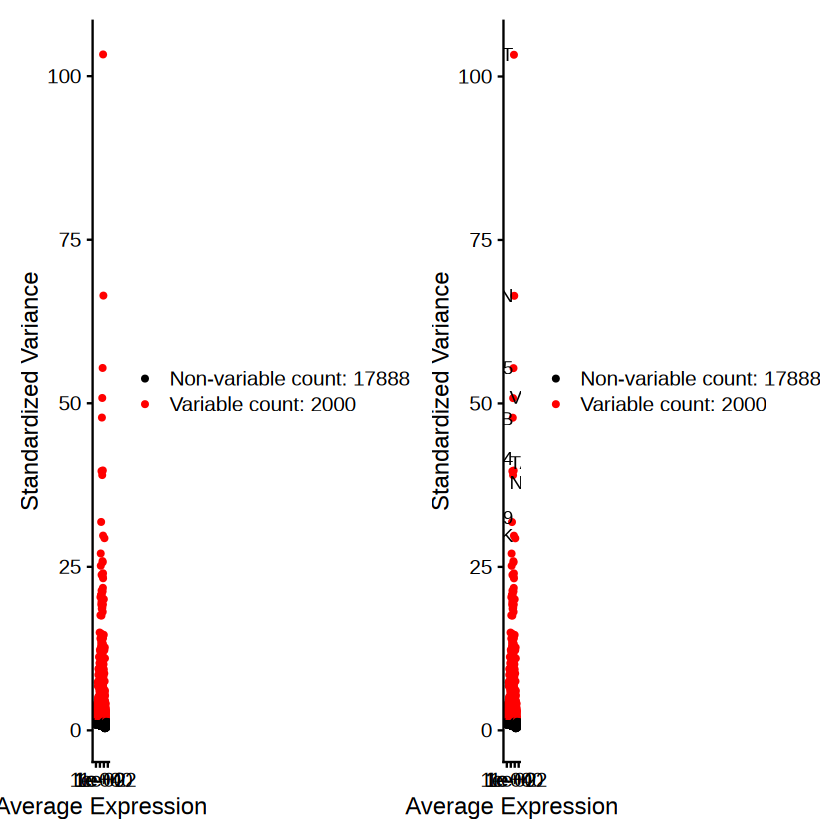

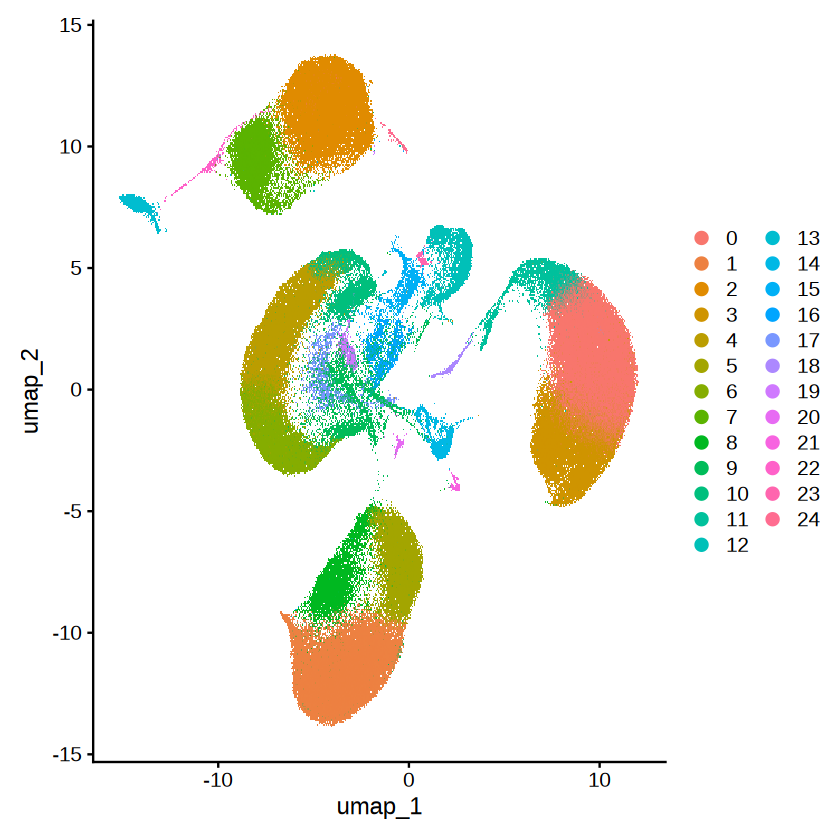

In [27]:
seurat_obj <- NormalizeData(seurat_obj, normalization.method = "LogNormalize", scale.factor = 10000)
seurat_obj <- NormalizeData(seurat_obj)
seurat_obj <- FindVariableFeatures(seurat_obj, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(seurat_obj), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(seurat_obj)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 + plot2
all.genes <- rownames(seurat_obj)
seurat_obj <- ScaleData(seurat_obj, features = all.genes)
seurat_obj <- RunPCA(seurat_obj, features = VariableFeatures(object = seurat_obj))
seurat_obj <- FindNeighbors(seurat_obj, dims = 1:10)
seurat_obj <- FindClusters(seurat_obj, resolution = 0.5)
seurat_obj <- RunUMAP(seurat_obj, dims = 1:10)
# note that you can set `label = TRUE` or use the LabelClusters function to help label
# individual clusters
DimPlot(seurat_obj, reduction = "umap")

In [28]:
qsave(seurat_obj,file = "data/cross_region/Macaque_hippo/fm_hippo_srt.qs")

In [35]:
intersect(colnames(seurat_obj)[1:10],barcodes$X[1:10])

[1] "TCTCCGACAACATCGT-8"  "GAACACTGTCGTTATG-6"  "TCAGGTAGTCCCAAAT-22"
 [4] "TTTACCAGTCAAATCC-14" "TTACGTTAGTATGCAA-21" "TGTCCTGGTGGAGAAA-17"
 [7] "ACGTCCTCACAGCATT-16" "AAGTACCCACCAGCCA-12" "ATCACAGAGAAGTCCG-22"
[10] "AGTGCCGGTAGCGTAG-24"

In [39]:
head(barcodes)
barcodes = barcodes[barcodes$X %in% colnames(seurat_obj),]
labels = barcodes$label_20
names(labels) = barcodes$X
samples = barcodes$sample
names(samples) = barcodes$X
sexs = barcodes$sex
names(sexs) = barcodes$X
ages = barcodes$age
names(ages) = barcodes$X
seurat_obj$label = labels
seurat_obj$sample = samples
seurat_obj$sex = sexs
seurat_obj$age = ages


,X,age,sex,sample,label_20
,<chr>,<chr>,<chr>,<chr>,<chr>
1,TCTCCGACAACATCGT-8,Y5,M,0614_H3,GC_1
2,GAACACTGTCGTTATG-6,Y5,M,0614_H1,Astro_3
3,TCAGGTAGTCCCAAAT-22,Y5,M,1211_H4-1,OPC_1
4,TTTACCAGTCAAATCC-14,Y13,M,0801_H1-1,PVM
5,TTACGTTAGTATGCAA-21,Y5,M,1211_H3-2,Microglia_1
6,TGTCCTGGTGGAGAAA-17,Y13,M,0812_H4-1,Microglia_1


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



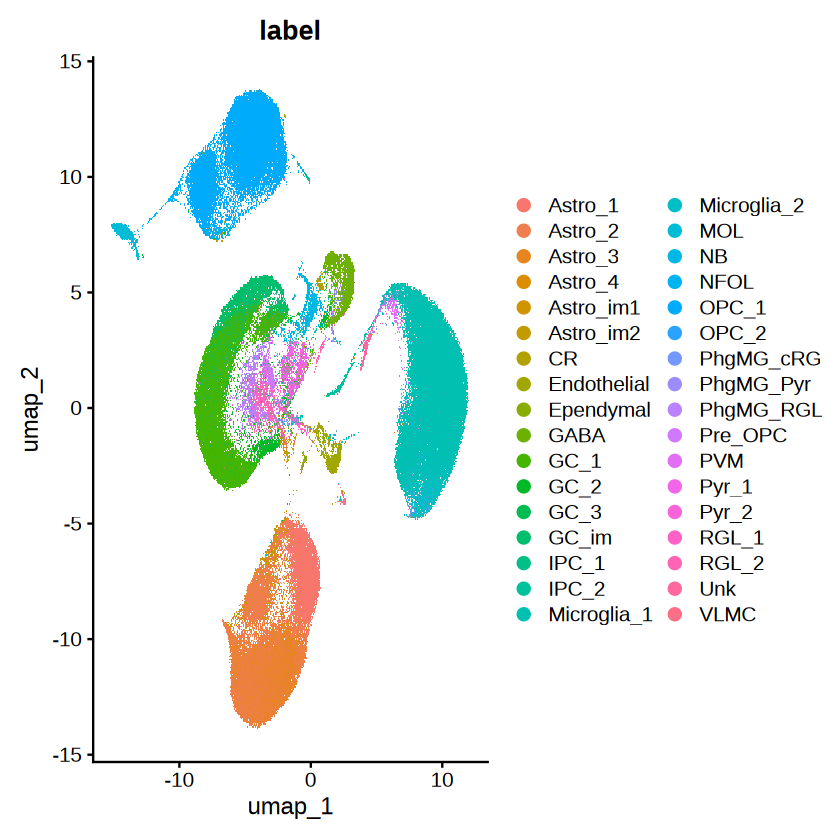

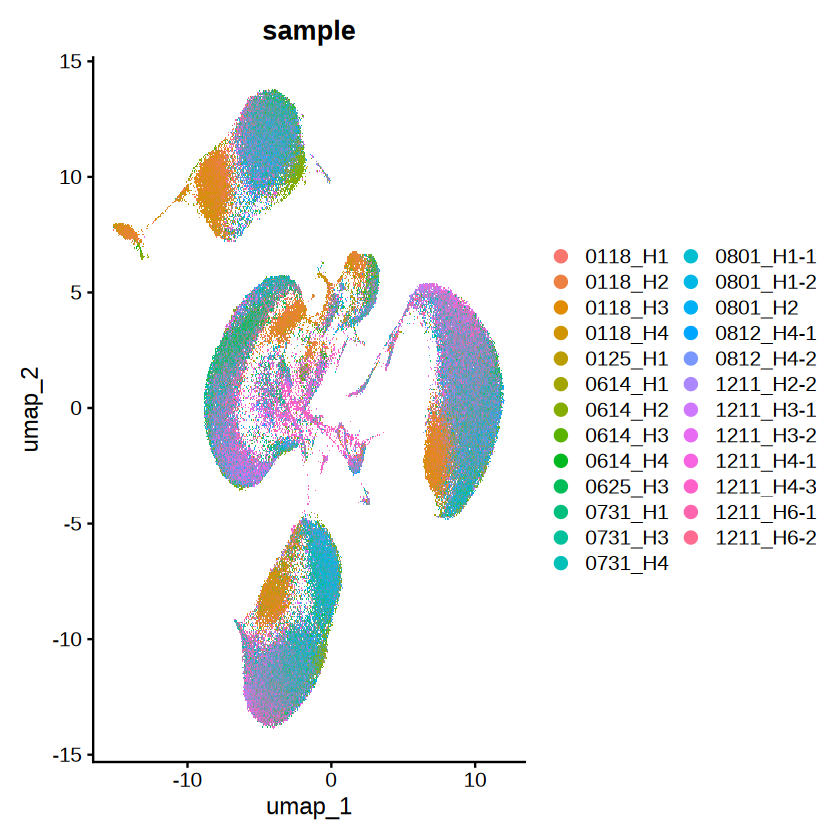

In [41]:
#qsave(seurat_obj,file = "data/cross_region/Macaque_hippo/fm_hippo_srt.qs")
DimPlot(seurat_obj, reduction = "umap", group.by = "label")
DimPlot(seurat_obj, reduction = "umap", group.by = "sample")

In [ ]:
# 首先将 Seurat 对象保存为 h5Seurat 格式
library(SeuratDisk)
SaveH5Seurat(seurat_obj, filename = "data/cross_region/Macaque_hippo/fm_hippo_srt.h5seurat", overwrite = TRUE)
# 然后将 h5Seurat 转换为 h5ad


Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Creating h5Seurat file for version 3.1.5.9900



In [44]:
Convert("data/cross_region/Macaque_hippo/fm_hippo_srt.h5seurat", dest = "h5ad", overwrite = TRUE)

Validating h5Seurat file

Adding data from RNA as X



ERROR: Error in assay.group$obj_copy_to(dst_loc = dfile, dst_name = "X", src_name = x.data): HDF5-API Errors:
    error #000: H5O.c in H5Ocopy(): line 545: unable to synchronously copy object
        class: HDF5
        major: Object header
        minor: Unable to copy object

    error #001: H5O.c in H5O__copy_api_common(): line 454: unable to copy object
        class: HDF5
        major: Object header
        minor: Unable to copy object

    error #002: H5VLcallback.c in H5VL_object_copy(): line 5889: object copy failed
        class: HDF5
        major: Virtual Object Layer
        minor: Unable to copy object

    error #003: H5VLcallback.c in H5VL__object_copy(): line 5850: object copy failed
        class: HDF5
        major: Virtual Object Layer
        minor: Unable to copy object

    error #004: H5VLnative_object.c in H5VL__native_object_copy(): line 156: unable to copy object
        class: HDF5
        major: Object header
        minor: Unable to copy object

    error #005: H5Ocopy.c in H5O__copy(): line 155: source object not found
        class: HDF5
      


In [50]:
# 假设能成功加载 h5seurat 文件或使用原始 Seurat 对象
# 导出表达矩阵 (例如 counts 或 data)
class(seurat_obj[["RNA"]])
seuratcount = GetAssayData(seurat_obj,slot = "count",assay = "RNA")
#seuratcount
library(Matrix)
#dir.create("data/cross_region/Macaque_hippo/seurat")
writeMM(seuratcount, file = "data/cross_region/Macaque_hippo/seurat/counts.mtx")
# 导出基因名和细胞名
write.table(rownames(seurat_obj), file = "data/cross_region/Macaque_hippo/seurat/genes.tsv", sep = "\t", quote = FALSE, col.names = FALSE, row.names = FALSE)
write.table(colnames(seurat_obj), file = "data/cross_region/Macaque_hippo/seurat/barcodes.tsv", sep = "\t", quote = FALSE, col.names = FALSE, row.names = FALSE)
# 导出细胞元数据
write.csv(seurat_obj@meta.data, file = "data/cross_region/Macaque_hippo/seurat/metadata.csv")
# 导出降维信息（如 PCA, UMAP 坐标）
write.csv(Embeddings(seurat_obj, reduction = "pca"), file = "data/cross_region/Macaque_hippo/seurat/pca_embeddings.csv")
write.csv(Embeddings(seurat_obj, reduction = "umap"), file = "data/cross_region/Macaque_hippo/seurat/umap_embeddings.csv")


NULL

#### Annotation cross region single cell

In [362]:
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_22.qs")
head(fsraw.cor)

readid,origin_name,cell_id,cell_type_id,subclass,class,transcript_id,gene_id,x,y,layer,region,lobe,subcortical
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
9eda4dea-9dc0-434f-871e-9448b11daf53-12;st_ed:A:6349-7977;AD:A:adapterC.rc-adapterM;AP:A:RC-Wrong_21-45:-,L-1|2-l1,NA,NA,,,XM_005543577.2,RPS8,10000,26457,l1,1|2,somatosensory,Cortex
8e9fe2ef-d7b3-459a-94a2-f2638c24f2e0-3;st_ed:A:709-1447;AD:A:adapterE-adapterF;AP:A:Correct_695-719:+,L-1|2-l1,NA,NA,,,XM_005594282.1,CXHXorf57,10000,26495,l1,1|2,somatosensory,Cortex
cddeed9c-26d3-4e0f-abb2-709ef8d310c6-4;st_ed:A:803-1394;AD:A:adapterB-adapterC;AP:A:Correct_548-572:+,L-1|2-l2,NA,NA,,,NM_001285041.1,CALM2,10000,26590,l2,1|2,somatosensory,Cortex
03977eea-b45b-42ad-b59d-953ddeb99a39-3;st_ed:A:91-914;AD:A:adapterP.rc-adapterN.rc;AP:A:Jump|AD:A:no-split_21-47:-,L-1|2-l2,NA,NA,,,XM_015437862.1,WBP2,10000,26612,l2,1|2,somatosensory,Cortex
19839030-fc62-41df-9c6f-170ec6b9fb74-15;st_ed:A:6994-7454;AD:A:adapterO-adapterP;AP:A:Correct_417-441:+,L-1|2-l2,NA,NA,,,XM_015437862.1,WBP2,10000,26612,l2,1|2,somatosensory,Cortex
5b2f6398-a7f9-409e-84d3-b492e5bd2168-4;st_ed:A:1607-2156;AD:A:adapterM.rc-adapterL.rc;AP:A:Correct_21-45:-,L-1|2-l2,NA,NA,,,XM_005548045.2,NDUFB4,10000,26652,l2,1|2,somatosensory,Cortex


In [363]:
#head(read.ontd)
read.ontd = qread("data/reads_full_anotation/read_total_annotation_ontdirect_subcortical_25_10_28.qs")
intersect(colnames(read.ontd),colnames(fsraw.cor))

[1] "readid"        "origin_name"   "cell_id"       "cell_type_id" 
 [5] "subclass"      "class"         "gene_id"       "layer"        
 [9] "region"        "subcortical"   "transcript_id" "lobe"

In [366]:
# add subcortical data
read.ontd$x = as.numeric(MySplit(read.ontd$CBZ,":|_",3))
read.ontd$y = as.numeric(MySplit(read.ontd$CBZ,":|_",4))

In [367]:
read.ontd$cid = paste0(read.ontd$x,"_",read.ontd$y)
cellan$cid = paste0(cellan$x,"_",cellan$y)
cellmatch = match(read.ontd$cid,cellan$cid)
read.ontd$cell_id = cellan[cellmatch,]$cell_label
read.ontd$subclass = cellan[cellmatch,]$subclass
read.ontd$class = cellan[cellmatch,]$class

In [368]:
cmid = intersect(colnames(read.ontd),colnames(fsraw.cor))
fsraw.cor = rbind(fsraw.cor[,cmid],read.ontd[,cmid])
qsave(fsraw.cor,"data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")

In [359]:
#head(read.ontd)
#read.ontd[read.ontd$readid == "5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436",]
#fsraw.cor[fsraw.cor$readid == "5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436",]

CBZ,readid,transcript_id,gene_id,x,y,cell_label,gene_area,rx,ry,⋯,cell_type,subclass,class,cell_type_color,layer,region,subcortical,transcript_name,lobe,cid
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>
CB:Z:15320_87919,5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436,NA,NA,15320,87919,535959,1419,52634,74549,⋯,,NA,NA,,cb,cb,Cerebellum,NA,NA,15320_87919
CB:Z:15320_87919,5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436,NA,NA,15320,87919,535959,1419,52634,74549,⋯,,NA,NA,,cb,cb,Cerebellum,NA,NA,15320_87919
CB:Z:15320_87919,5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436,NA,NA,15320,87919,535959,1419,52634,74549,⋯,,NA,NA,,cb,cb,Cerebellum,NA,NA,15320_87919


In [335]:
anodf.cb = read.csv("ref/cross_region/macaque_T44_anno.csv")
anodf.cb$subclass = anodf.cb$celltype_new
anodf.cb$class = anodf.cb$celltype_new
anodf.cb[anodf.cb$celltype_new == "Astrocyte",]$subclass = "ASC"
anodf.cb[anodf.cb$celltype_new == "Microglia",]$subclass = "MG"
anodf.cb[anodf.cb$celltype_new == "ODC",]$subclass = "OLG"
anodf.cb[anodf.cb$celltype_new %in% c("MLI1","MLI2"),]$subclass = "MLI"
anodf.cb[anodf.cb$celltype_new %in% c("Granule","UBC"),]$class = "GLU"
anodf.cb[anodf.cb$celltype_new %in% c("Purkinje","Golgi","MLI1","MLI2","PLI"),]$class = "GABA"
anodf.cb[anodf.cb$celltype_new %in% c("Astrocyte","Bergmann","ODC","OPC","Microglia",
                                    "Endothelial_stalk","Fibroblast","Choroid"),]$class = "NonNeuron"
table(anodf.cb$subclass)
table(anodf.cb$class)
write.csv(anodf.cb,file = "ref/cross_region/macaque_T44_myanno.csv",row.names = F, quote = F)


              ASC          Bergmann           Choroid Endothelial_stalk 
             2730              2753              1923              3631 
       Fibroblast             Golgi           Granule                MG 
             1924              1265             32109               714 
              MLI               OLG               OPC               PLI 
             4056               991              1662               400 
         Purkinje               UBC 
             1092              1934 


     GABA       GLU NonNeuron 
     6813     34043     16328 

In [336]:
cell.cb = read.csv("data/cross_region/cellan_cerebellum.csv")
length(unique(cell.cb$cell_label))
cell.cb = merge(cell.cb,anodf.cb[,c("cell_label","subclass","class")],by = "cell_label",all.x = "TRUE")
length(unique(cell.cb[!is.na(cell.cb$subclass),]$cell_label))

[1] 54353

[1] 38839

`summarise()` has grouped output by 'cell_label', 'subclass'. You can override
using the `.groups` argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


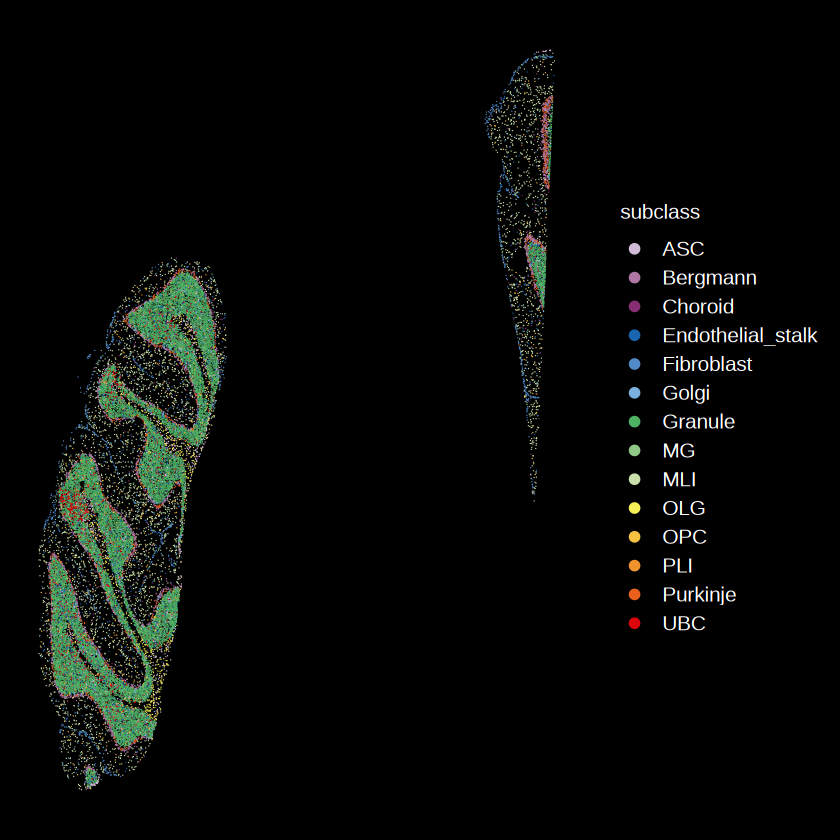

In [40]:
#unique(cell.cb$celltype_new)
cellanuq.cb = cell.cb %>% group_by(cell_label,subclass,class) %>% summarise(x = mean(x),y = mean(y))
#head(cellanuq)
pan1 = ggplot(cellanuq.cb[!is.na(cellanuq.cb$subclass),], aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.1, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  #facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan1

In [334]:
anodf.hp = read.csv("ref/cross_region/T44.hippo.csv")
#table(anodf.hp$cellType)
anodf.hp$subclass = anodf.hp$cellType
anodf.hp$class = anodf.hp$cellType
anodf.hp[anodf.hp$cellType == "astrocyte",]$subclass = "ASC"
anodf.hp[anodf.hp$cellType %in% c("GABA CCK-1","GABA CCK-2","GABA CCK-3","GABA CCK-4"),]$subclass = "CCK"
anodf.hp[anodf.hp$cellType %in% c("GABA LAMP5-1","GABA LAMP5-2","GABA LAMP5-3","GABA LAMP5-4"),]$subclass = "LAMP5"
anodf.hp[anodf.hp$cellType %in% c("GABA PVALB-1","GABA PVALB-2","GABA PVALB-3"),]$subclass = "PVALB"
anodf.hp[anodf.hp$cellType %in% c("GABA SST-1","GABA SST-2"),]$subclass = "SST"
anodf.hp[anodf.hp$cellType %in% c("GABA VIP-1"),]$subclass = "VIP"
anodf.hp[anodf.hp$cellType %in% c("Glu CA1-1","Glu CA1-2","Glu CA2/3-1",
                                  "Glu CA3/4-1","Glu  CA3/4-2","Glu CA3/4-2"),]$subclass = "Pyr"
anodf.hp[anodf.hp$cellType %in% c("Glu DG-1","Glu DG-2","Glu DG-3","Glu DG-4"),]$subclass = "Granule"
anodf.hp[anodf.hp$cellType %in% c("Glu pSUB-deep-1","Glu pSUB-deep-2","Glu pSUB-deep-3","Glu pSUB-int-1",
                                  "Glu pSUB-int-2","Glu pSUB-int-3","Glu pSUB-int-4","Glu pSUB-int-5",
                                  "Glu pSUB-int-6","Glu pSUB-int-7","Glu SUB-1"),]$subclass = "pSUB"
anodf.hp[anodf.hp$cellType %in% c("microglia"),]$subclass = "MG"
anodf.hp[anodf.hp$cellType %in% c("olig"),]$subclass = "OLG"
anodf.hp$class = MySplit(anodf.hp$cellType," ",1)
anodf.hp[anodf.hp$cellType %in% c("astrocyte","microglia","olig","OPC","VLMC"),]$class = "NonNeuron"
anodf.hp[anodf.hp$class == "Glu",]$class = "GLU"
table(anodf.hp$subclass)
table(anodf.hp$class)

write.csv(anodf.hp,file = "ref/cross_region/macaque_T44_myanno_hippo.csv",row.names = F, quote = F)


    ASC     CCK Granule   LAMP5      MG     OLG     OPC    pSUB   PVALB     Pyr 
   4045     306    1873     129     514    2370     160    3421     489    1602 
    SST     VIP    VLMC 
    136      63     197 


     GABA       Glu NonNeuron 
     1123      6896      7286 

In [337]:
cell.hp = read.csv("data/cross_region/Macaque_hippo/cellan_Hippo.csv")
length(unique(cell.hp$cell_label))
cell.hp = merge(cell.hp,anodf.hp[,c("cellID","subclass","class")],by.x = "cell_label",by.y = "cellID",all.x = "TRUE")
#length(unique(cell.hp[!is.na(cell.hp$cellType),]$cell_label))

[1] 19756

`summarise()` has grouped output by 'cell_label'. You can override using the
`.groups` argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


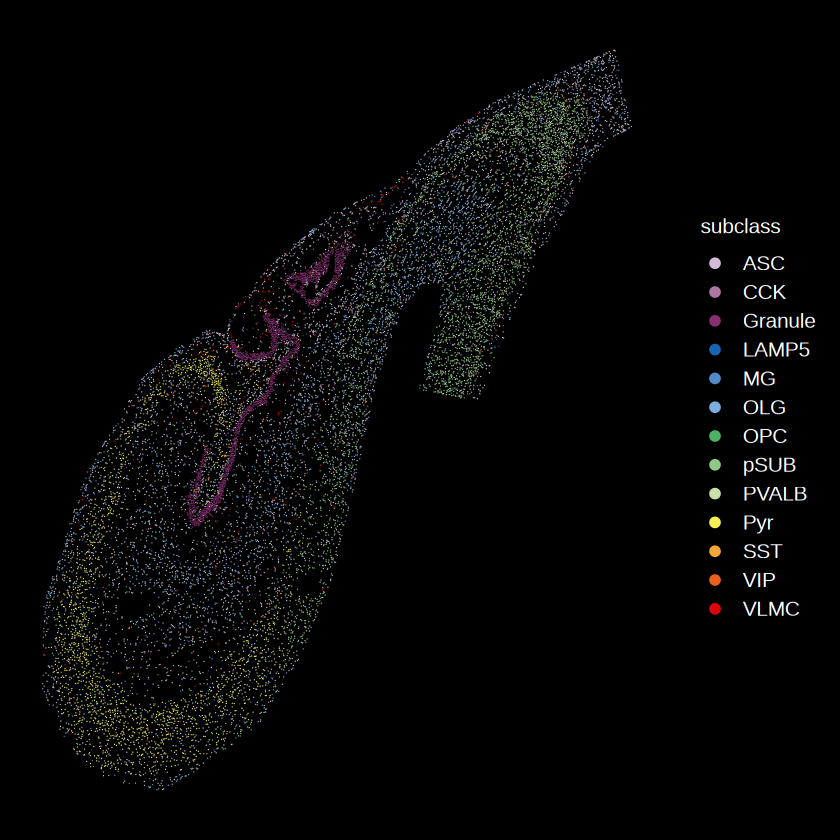

In [43]:
#unique(cell.cb$celltype_new)
cellanuq.hp = cell.hp %>% group_by(cell_label,subclass) %>% summarise(x = mean(x),y = mean(y))
#head(cellanuq)
pan2 = ggplot(cellanuq.hp[!is.na(cellanuq.hp$subclass),], aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.1, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  #facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan2

In [338]:
cellan = rbind(cell.cb,cell.hp)
head(cellan)
qsave(cellan,file = "data/cross_region/cell_cross_region_transfered_annotation_25_10_24.qs")

,cell_label,CBZ,origin_name,cell_type_id,layer,region,subcortical,x,y,subclass,class
,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>
1,5,CB:Z:26955_95855,L-cb-cb,0,cb,cb,Cerebellum,26955,95855,Granule,GLU
2,5,CB:Z:26956_95848,L-cb-cb,0,cb,cb,Cerebellum,26956,95848,Granule,GLU
3,5,CB:Z:26954_95848,L-cb-cb,0,cb,cb,Cerebellum,26954,95848,Granule,GLU
4,5,CB:Z:26951_95847,L-cb-cb,0,cb,cb,Cerebellum,26951,95847,Granule,GLU
5,5,CB:Z:26967_95850,L-cb-cb,0,cb,cb,Cerebellum,26967,95850,Granule,GLU
6,5,CB:Z:26964_95854,L-cb-cb,0,cb,cb,Cerebellum,26964,95854,Granule,GLU


In [511]:
#cellan.cortex
#cellan.ct = read.csv("/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_cell_annotation_T44_macaque_f001_2D_20220928_type20221110-macaque1-contour2.csv")
#cellan.ctp = read.csv("/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/cell_type_type20230220-macaque1-contour2_v1.csv")
#cellan.ct = merge(cellan.ct,cellan.ctp,by = "cell_type_id")
cellan.ct$subcortical = "Cortex"
colnames(cellan.ct)[3] = "cell_label"
cellant = rbind(cellan[,c("cell_label","subclass","class","subcortical")],cellan.ct[,c("cell_label","subclass","class","subcortical")])
head(cellant)
write.csv(cellant,file = "/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_cell_annotation_withcross_25_10_28.csv",row.names = F,quote = F)

,cell_label,subclass,class,subcortical
,<dbl>,<chr>,<chr>,<chr>
1,5,Granule,GLU,Cerebellum
2,5,Granule,GLU,Cerebellum
3,5,Granule,GLU,Cerebellum
4,5,Granule,GLU,Cerebellum
5,5,Granule,GLU,Cerebellum
6,5,Granule,GLU,Cerebellum


In [47]:
#cellan$celltype = cellan$celltype_pred
cellan = cellan[!is.na(cellan$subclass),]
cellanuq = cellan %>% group_by(cell_label,subcortical,subclass,class) %>% summarise(x = mean(x),y = mean(y))
head(cellanuq) 

`summarise()` has grouped output by 'cell_label', 'subcortical', 'subclass'.
You can override using the `.groups` argument.


cell_label,subcortical,subclass,class,x,y
<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
5,Cerebellum,Granule,GLU,26961.11,95849.80
13,Cerebellum,Granule,GLU,30078.90,97249.31
23,Hippocampus,OLG,NonNeuron,27019.98,80759.03
34,Cerebellum,Granule,GLU,28035.90,100615.49
39,Cerebellum,ASC,NonNeuron,24315.22,97323.89
45,Cerebellum,MLI,GABA,29144.95,95807.54


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/cross_region_cellan_spatial_25_10_24.pdf



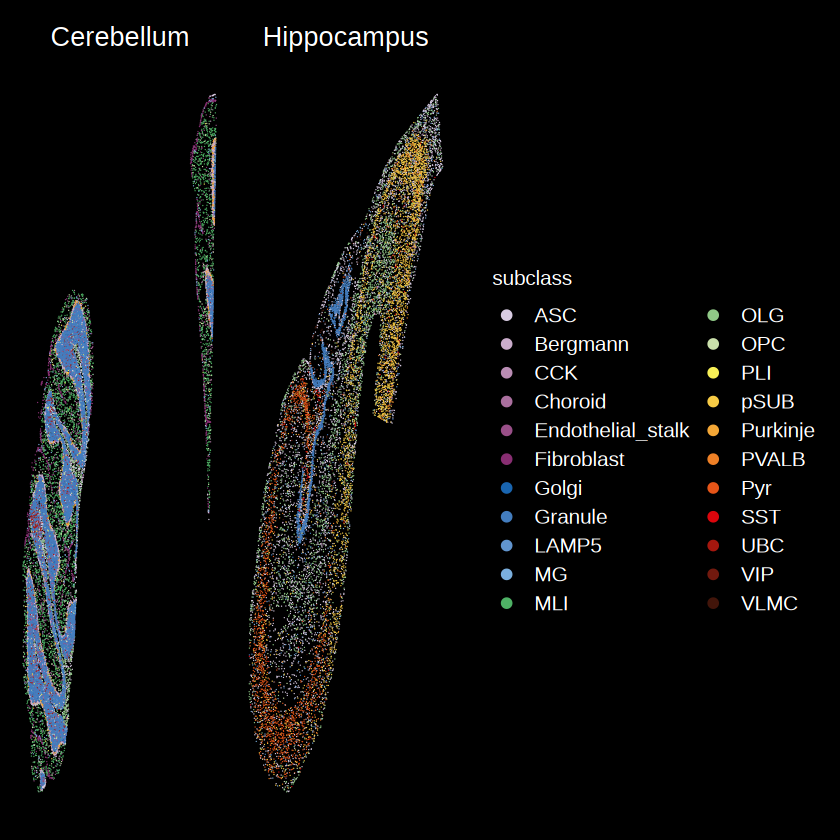

In [49]:
pan = ggplot(cellanuq, aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.1, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan
ggexport(pan,filename = "result/figure_revision/cross_region_cellan_spatial_25_10_24.pdf",width = 9,height = 3.5)


`summarise()` has grouped output by 'subcortical'. You can override using the
`.groups` argument.
file saved to result/figure_revision/cross_region_cellan_composition_25_10_24.pdf



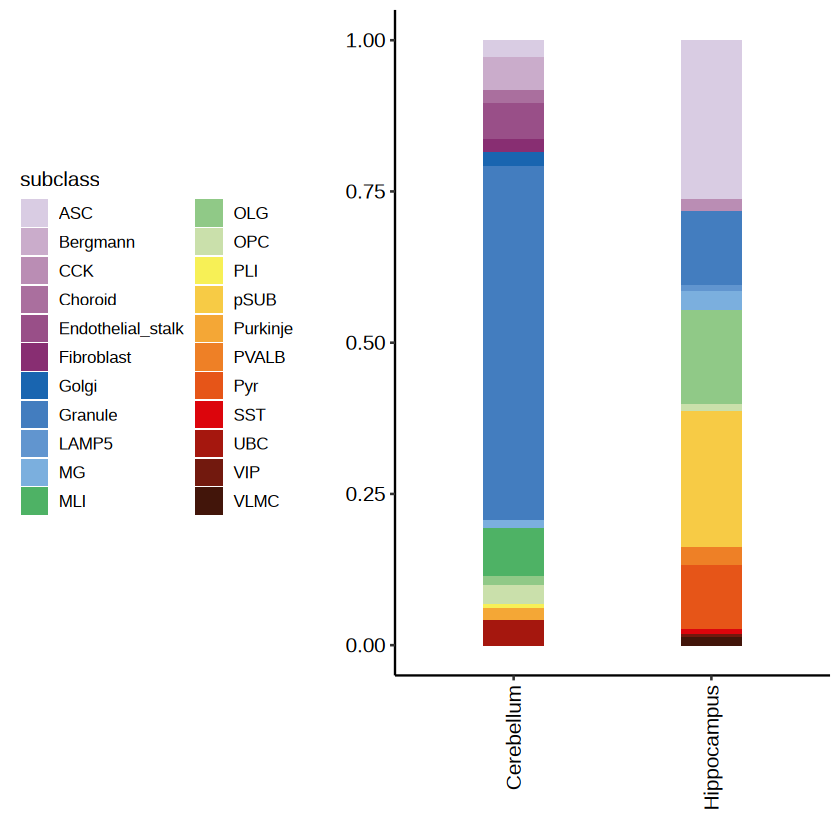

In [57]:
cellanuq.st = cellanuq %>% group_by(subcortical,subclass) %>% summarise(cellnum = length(unique(cell_label)))
p0.1 = ggplot(cellanuq.st, aes(x = subcortical, y = cellnum,fill = subclass)) + 
    geom_bar(stat = "identity",position = "fill",width = 0.3) +  
    scale_fill_discreterainbow() +
    theme_pubr() + theme(axis.text.x = element_text(angle =  90,hjust = 1,vjust = 0.5),legend.position = "left") + 
    xlab("") + ylab("")
p0.1
ggexport(p0.1,filename = "result/figure_revision/cross_region_cellan_composition_25_10_24.pdf",width = 5,height = 4)

In [54]:
fsraw.cor.sub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus"),]
head(fsraw.cor.sub)

readid,origin_name,cell_id,cell_type_id,subclass,class,transcript_id,gene_id,x,y,layer,region,lobe,subcortical
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
8b5e7d1d-2672-490f-9ed4-0d8c9ed586a6-7;st_ed:A:2074-3428;AD:A:adapterD.rc-adapterF;AP:A:RC-Wrong|ts-te:65-731,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
8b5e7d1d-2672-490f-9ed4-0d8c9ed586a6-7;st_ed:A:2074-3428;AD:A:adapterD.rc-adapterF;AP:A:RC-Wrong|ts-te:65-731,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
8b5e7d1d-2672-490f-9ed4-0d8c9ed586a6-7;st_ed:A:2074-3428;AD:A:adapterD.rc-adapterF;AP:A:RC-Wrong|ts-te:65-731,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
acaa5aba-0713-478d-9619-3228701d4bc9-12;st_ed:A:6066-6914;AD:A:adapterF.rc-adapterE.rc;AP:A:Correct_20-43:-,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
acaa5aba-0713-478d-9619-3228701d4bc9-12;st_ed:A:6066-6914;AD:A:adapterF.rc-adapterE.rc;AP:A:Correct_20-43:-,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
acaa5aba-0713-478d-9619-3228701d4bc9-12;st_ed:A:6066-6914;AD:A:adapterF.rc-adapterE.rc;AP:A:Correct_20-43:-,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum


In [55]:
fsraw.cor.sub$cid = paste0(fsraw.cor.sub$x,"_",fsraw.cor.sub$y)
cellan$cid = paste0(cellan$x,"_",cellan$y)
cellmatch = match(fsraw.cor.sub$cid,cellan$cid)
fsraw.cor.sub$cell_id = cellan[cellmatch,]$cell_label
fsraw.cor.sub$subclass = cellan[cellmatch,]$subclass
fsraw.cor.sub$class = cellan[cellmatch,]$class
qsave(fsraw.cor.sub,file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_10_22.qs")
fsraw.cor.sub = fsraw.cor.sub[,colnames(fsraw.cor)]
fsraw.cor = rbind(fsraw.cor[!fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus"),],fsraw.cor.sub)


In [ ]:
fsraw.cor[fsraw.cor$class == "Glu",]$class = "GLU"
qsave(fsraw.cor,file = "data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_22.qs")

In [ ]:
#marker gene plot
#Nkx2.1, Lhx6, Sox6

#### Marker gene plot

In [413]:
genedf.hp = read.csv("data/cross_region/total_genecount_df_hippocampus.csv")
head(genedf.hp)

,gene_id,cell_label,count,x,y
,<chr>,<int>,<int>,<dbl>,<dbl>
1,A2M,23,2,35514.00,80727.00
2,A2M,2005,4,31049.67,80426.67
3,A2M,4076,2,31993.00,82718.00
4,A2M,8465,2,18525.00,74764.00
5,A2M,11034,1,26034.00,78404.00
6,A2M,11678,1,19582.00,74038.00


In [414]:
genedf.cb = read.csv("data/cross_region/total_genecount_df_cerebellum.csv")
head(genedf.cb)

,gene_id,cell_label,count,x,y
,<chr>,<int>,<int>,<dbl>,<dbl>
1,A1BG,894692,1,25511,98307
2,A2M,267,1,24315,95780
3,A2M,417,1,27045,98171
4,A2M,561,1,26018,95568
5,A2M,1088,1,6855,92743
6,A2M,1156,1,28251,92863


In [423]:
#genedf = rbind(genedf.hp,genedf.cb)
cellmatch = match(genedf$cell_label,cellan$cell_label)
genedf$subclass = cellan[cellmatch,]$subclass
genedf$class = cellan[cellmatch,]$class
genedf$subcortical = cellan[cellmatch,]$subcortical
genedf = genedf[!is.na(genedf$subclass),]
head(genedf)

,gene_id,cell_label,count,x,y,subclass,class,subcortical
,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,A2M,23,2,35514.00,80727.00,OLG,NonNeuron,Hippocampus
2,A2M,2005,4,31049.67,80426.67,MG,NonNeuron,Hippocampus
3,A2M,4076,2,31993.00,82718.00,Pyr,GLU,Hippocampus
5,A2M,11034,1,26034.00,78404.00,Granule,GLU,Hippocampus
7,A2M,11921,2,27867.00,78235.00,ASC,NonNeuron,Hippocampus
8,A2M,15356,1,26899.00,83042.00,Pyr,GLU,Hippocampus


In [425]:
# 加载必要的包
library(Seurat)
library(dplyr)
library(tidyr)
library(tibble)
# 假设您的数据框名为spatial_df
# 将数据从长格式转换为宽格式（基因-细胞矩阵）
count_matrix <- genedf %>%
  select(gene_id, cell_label, count) %>%
  pivot_wider(
    names_from = cell_label, 
    values_from = count, 
    values_fill = 0
  ) %>%
  column_to_rownames("gene_id") %>%
  as.matrix()

# 提取细胞的元数据信息
metadata <- genedf %>%
  select(cell_label, x, y, subclass, class, subcortical) %>%
  distinct(cell_label, .keep_all = TRUE) %>%
  column_to_rownames("cell_label")

# 确保元数据顺序与计数矩阵的列顺序一致
metadata <- metadata[colnames(count_matrix), ]
# 创建基础的Seurat对象[1,3](@ref)
srt <- CreateSeuratObject(
  counts = count_matrix,
  project = "subcortical",
  min.cells = 3,      # 至少在3个细胞中表达的基因
  min.features = 30   # 每个细胞至少检测到50个基因[1](@ref)
)

# 添加空间坐标信息


Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Data is of class matrix. Coercing to dgCMatrix."


ERROR: Error in CreateDimReducObject(embeddings = as.matrix(spatial_coords), : Please ensure all column names in the embeddings matrix are the key plus a digit representing a dimension number


In [426]:
head(spatial_coords)

,coord_x,coord_y
,<dbl>,<dbl>
23,35514.00,80727.00
2005,31049.67,80426.67
4076,31993.00,82718.00
11034,26034.00,78404.00
11921,27867.00,78235.00
15356,26899.00,83042.00


Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix

PC_ 1 
Positive:  NRG3, CSMD1, FAM19A1, GRIA1, OPCML, EPHA5, EPHA6, RYR3, KALRN, GRM5 
	   ROBO1, GRM7, DLGAP2, GRIN2B, ROBO2, CELF2, AGBL4, KCTD16, FRMD4A, ATRNL1 
	   DSCAM, NELL1, KCNMA1, CADM2, CAMK2A, LARGE1, KCNQ5, CLSTN2, CHN1, CSMD3 
Negative:  FSTL5, LCAT, CADPS2, PCP2, CALB2, FABP7, HPCAL1, FLT1, ATP10A, TMEM253 
	   GIMAP6, PLP1, OMD, TOB2, COL1A2, IRX2, TBX3, SEMA3G, HPDL, ADGRL4 
	   HR, CENPT, LOC102132667, IGF2, TRIM72, SKA1, CCL8, POLE3, PROB1, SLC22A31 
PC_ 2 
Positive:  KCNIP4, KCND2, CADPS2, FGF14, RBFOX1, GRIK2, NRXN3, FSTL5, NRG1, STXBP5L 
	   NEGR1, RIMS2, ZNF804B, LRP1B, RYR2, TRPM3, ZNF385D, FGF12, NKAIN2, NBEA 
	   CCSER1, CNTNAP2, RGS7, KCTD8, GALNT17, PDE1A, TRHDE, ADGRB3, ANKS1B, ZNF804A 
Negative:  SLC1A3, CA8, PCP4, CALB1, PCP2, PVALB, FABP7, PPP1R17, SLC1A2, LCAT 
	   HOMER3, ADGRV1, NPAS3, RGS8, NSG1, PREX2, ALDOC, SLC1A6, CHN1, ITPR1 
	   SNCG, PRKG

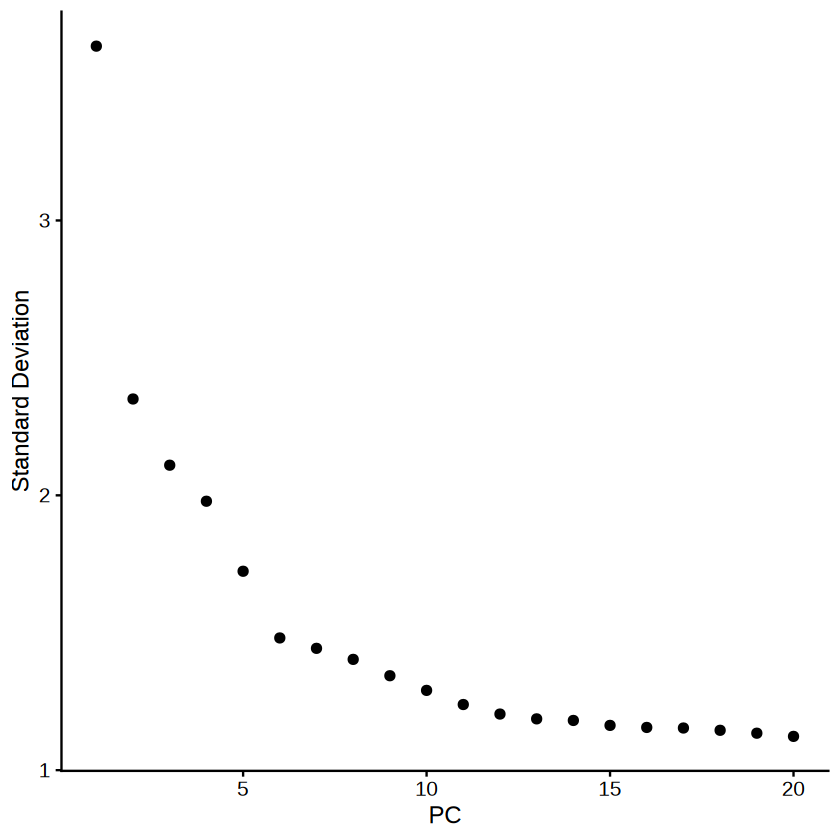

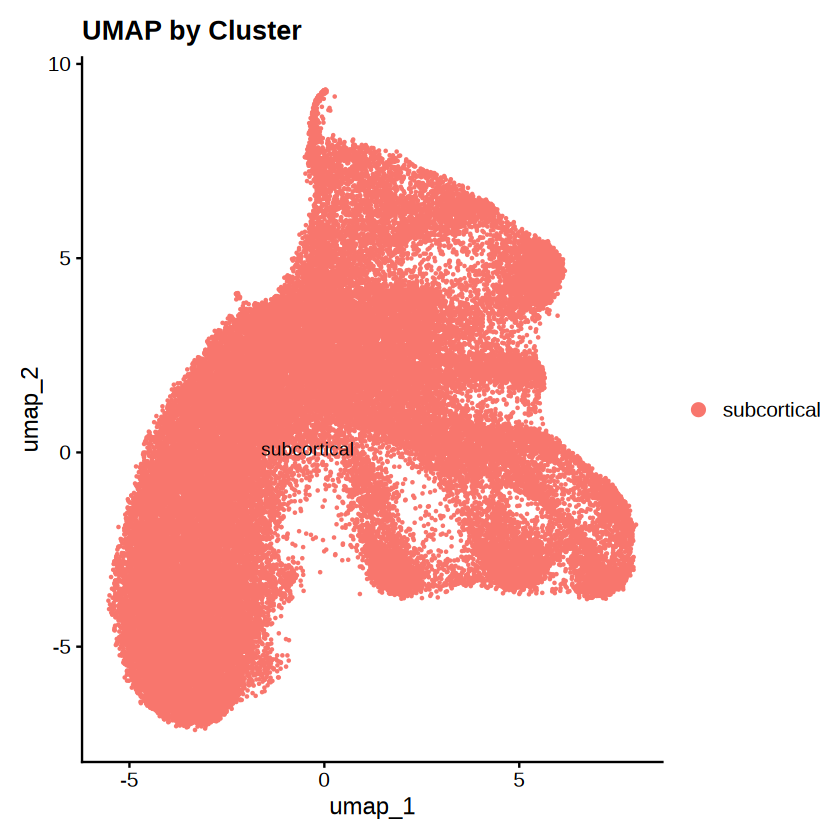

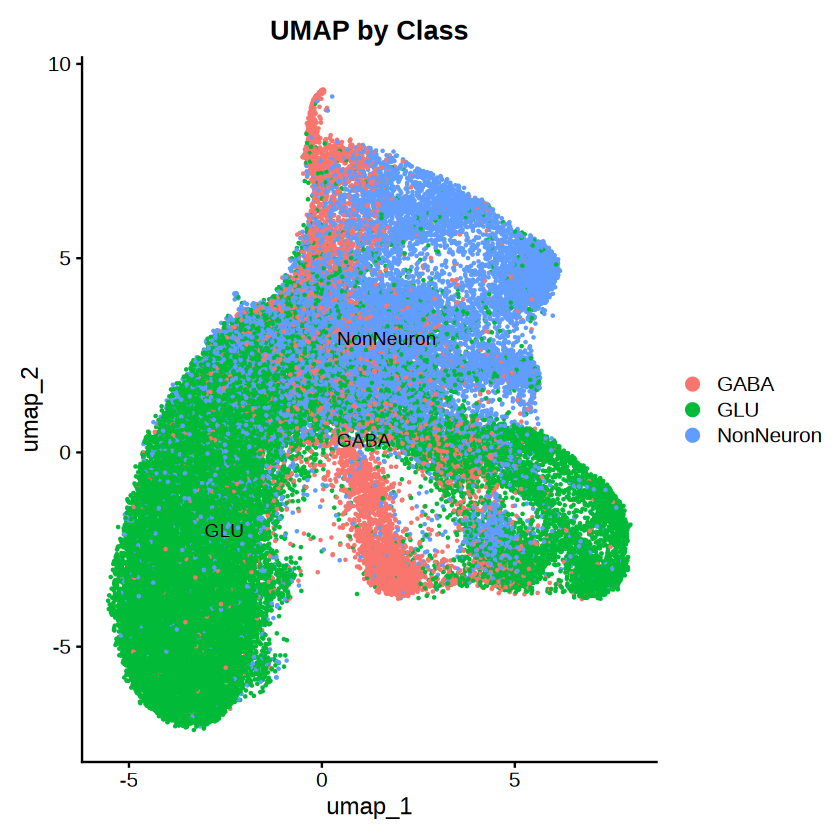

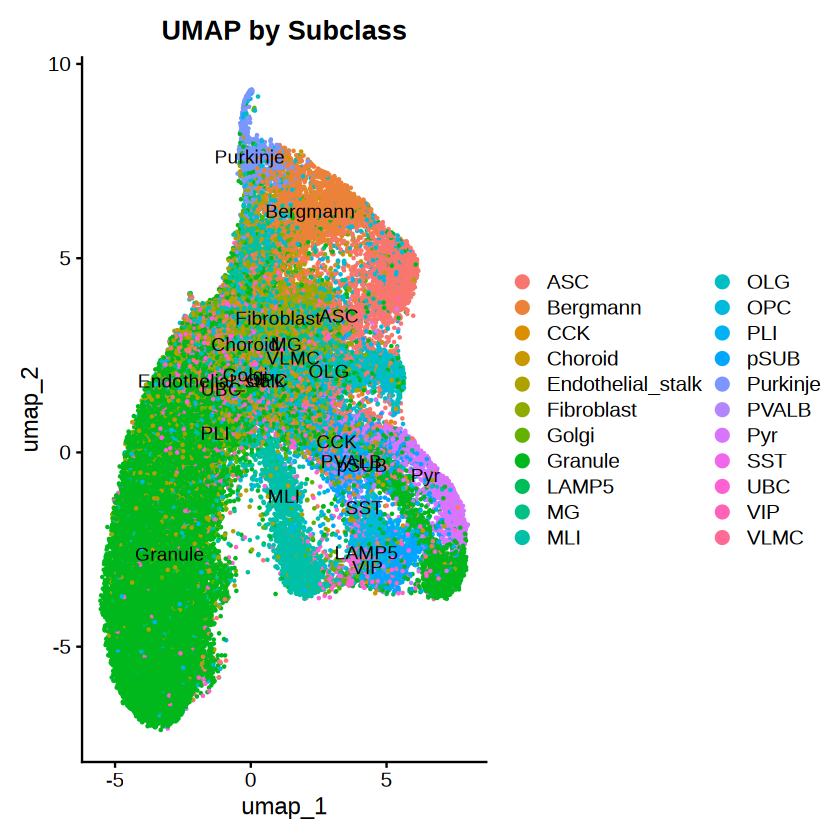

Warning message:
"The following requested variables were not found: coord_x, coord_y"


ERROR: [1m[33mError[39m in `FeaturePlot()`:[22m
[33m![39m None of the requested features were found: coord_x, coord_y in slot  data


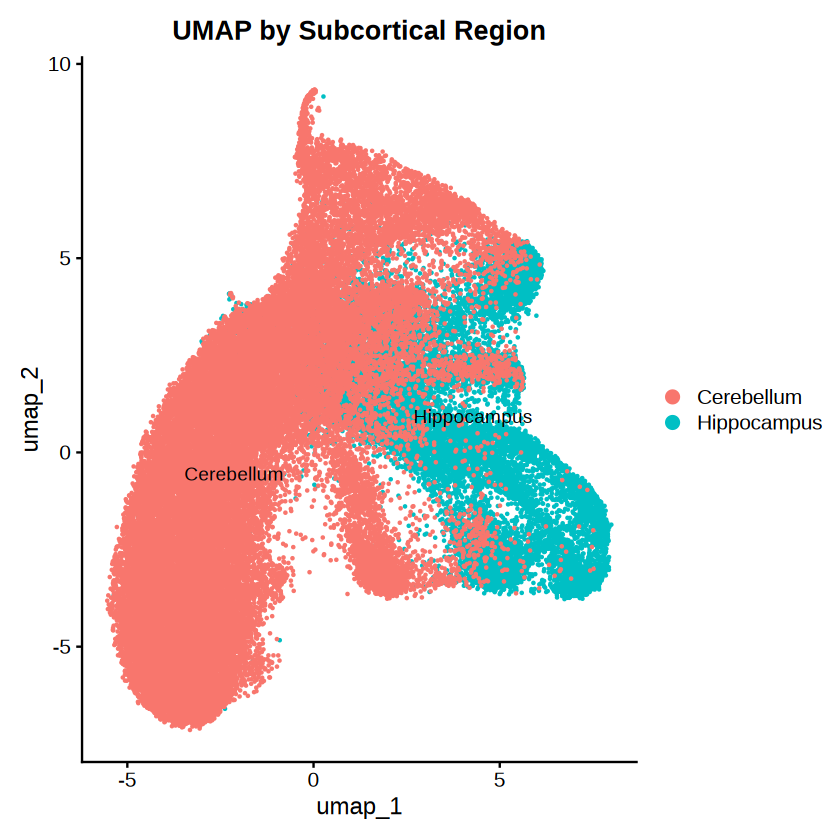

In [427]:
spatial_coords <- metadata[, c("x", "y")]
colnames(spatial_coords) <- c("spatial_1", "spatial_2")
srt[["spatial"]] <- CreateDimReducObject(
  embeddings = as.matrix(spatial_coords),
  key = "spatial_",
  assay = "RNA"
)

# 添加分类信息到元数据[5](@ref)
srt$subclass <- metadata$subclass
srt$class <- metadata$class
srt$subcortical <- metadata$subcortical


# 数据标准化[3,4](@ref)
srt <- NormalizeData(srt, 
  normalization.method = "LogNormalize", 
  scale.factor = 10000)

# 识别高变基因[3](@ref)
srt <- FindVariableFeatures(srt, 
  selection.method = "vst", 
  nfeatures = 2000)

# 数据缩放[4](@ref)
srt <- ScaleData(srt, features = rownames(srt))


# 线性降维（PCA）[4,8](@ref)
srt <- RunPCA(srt, features = VariableFeatures(srt))

# 检查主成分的重要性
ElbowPlot(srt)  # 帮助确定使用多少个PC

# 细胞聚类[4](@ref)
srt <- FindNeighbors(srt, dims = 1:10)
#seurat_obj <- FindClusters(seurat_obj, resolution = 0.5)

# 计算UMAP[6,7](@ref)
srt <- RunUMAP(srt, dims = 1:10, reduction = "pca")

# 基础UMAP可视化（按聚类）[7](@ref)
p1 <- DimPlot(srt, reduction = "umap", label = TRUE) +
  ggtitle("UMAP by Cluster")

# 按分类信息可视化
p2 <- DimPlot(srt, reduction = "umap", 
  group.by = "class", label = TRUE) +
  ggtitle("UMAP by Class")

p3 <- DimPlot(srt, reduction = "umap", 
  group.by = "subclass", label = TRUE) +
  ggtitle("UMAP by Subclass")

p4 <- DimPlot(srt, reduction = "umap", 
  group.by = "subcortical", label = TRUE) +
  ggtitle("UMAP by Subcortical Region")

# 显示所有图
print(p1)
print(p2)
print(p3)
print(p4)


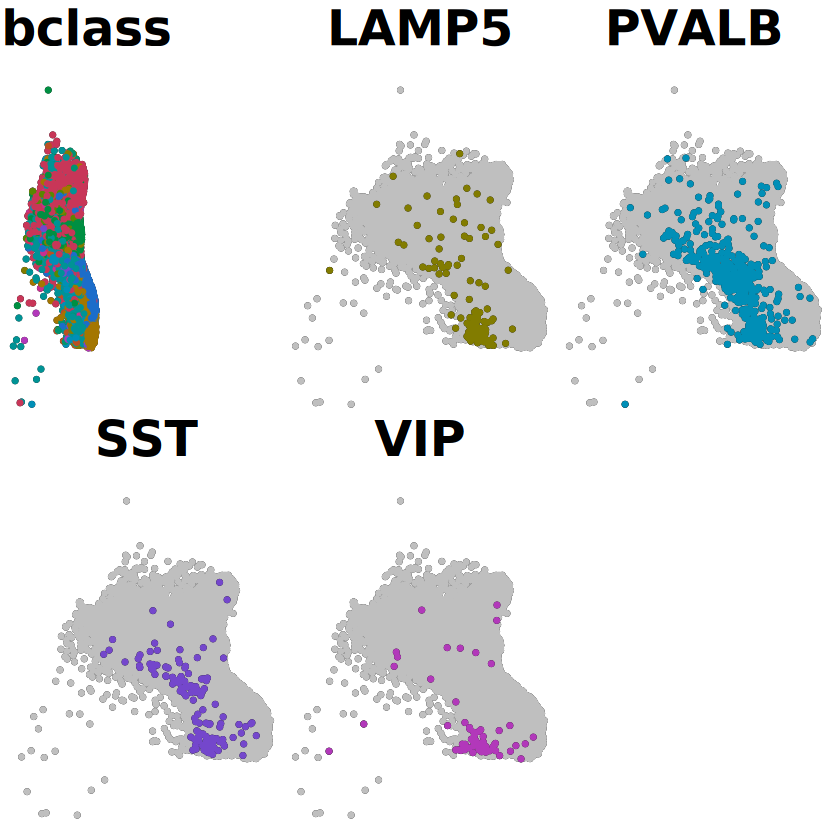

In [443]:
#Idents(srt) = srt$subcortical
#srt.sub = subset(srt,idents = c("Hippocampus"))
# DimPlot(srt.sub, reduction = "umap", pt.size = 0.001,
#    group.by = "subclass",label = TRUE) +
#   ggtitle("UMAP by Subclass")
library(SCpubr)
do_DimPlot(srt.sub, split.by = "subclass", ncol = 3, idents.keep = c("PVALB", "SST", "VIP","LAMP5"),pt.size = 0.001,
                        legend.position = "none",
                        font.size = 24)

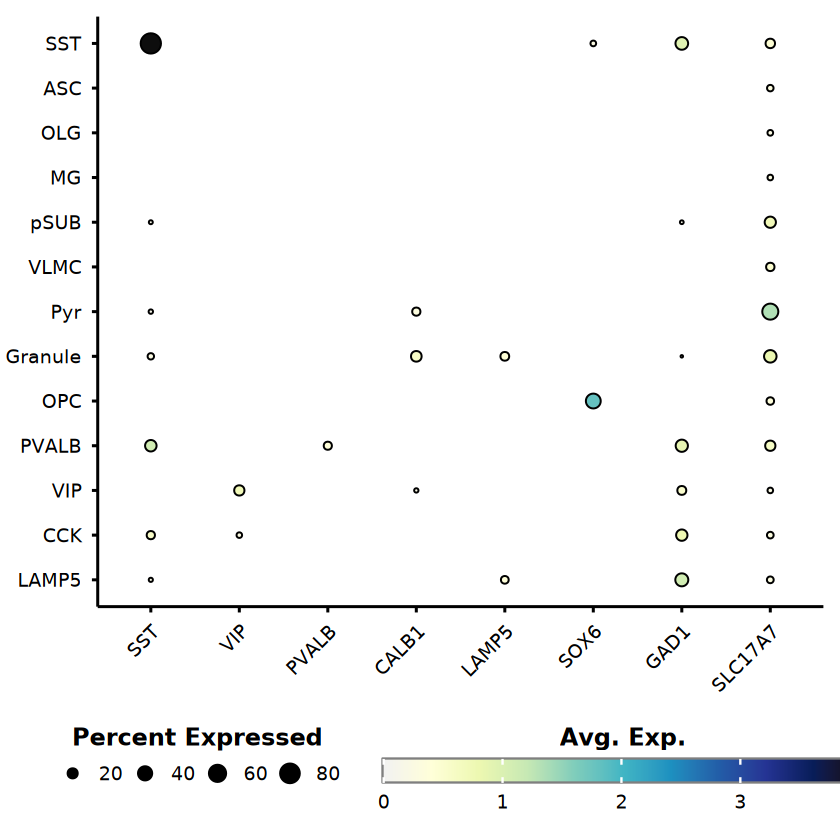

In [448]:
# FeaturePlot(srt,pt.size = 0.001,order = TRUE, 
#   features = c("PVALB","SST","LAMP5"), 
#   reduction = "umap")
Idents(srt.sub) = srt.sub$subclass
genes <- c("PVALB", "SST", "VIP","LAMP5","SLC17A7","GAD1","SOX6","CALB1")

p <- SCpubr::do_DotPlot(sample = srt.sub, dot.scale = 5,
                        features = genes, cluster = TRUE)
p

In [484]:
# 加载必要的包
library(Seurat)
library(dplyr)
library(corrplot)
library(RColorBrewer)
srt$areatr = paste0(srt$subcortical,"-",srt$subclass)
Idents(srt) = srt$areatr
# 1. 计算每个cluster的平均表达量
cluster.averages <- AverageExpression(srt, 
                                     assays = "RNA",  # 指定使用的assay
                                     #features = VariableFeatures(srt.sub), 
                                     group.by = "areatr")  # 指定分组依据

# 提取表达矩阵
avg_exp <- as.data.frame(cluster.averages$RNA)

# 2. 计算cluster间的相关性矩阵
correlation_matrix <- cor(avg_exp,method = "spearman")  # 使用斯皮尔曼相关性

library(pheatmap)

p = pheatmap(correlation_matrix,
         color = colorRampPalette(c("blue", "white", "red"))(100),
         cluster_rows = TRUE,
         cluster_cols = TRUE,
         #display_numbers = TRUE,        # 显示数值
         #number_format = "%.2f",         # 数值格式
         #fontsize_number = 6,            # 数值字体大小
         main = "Cluster Correlation Heatmap")

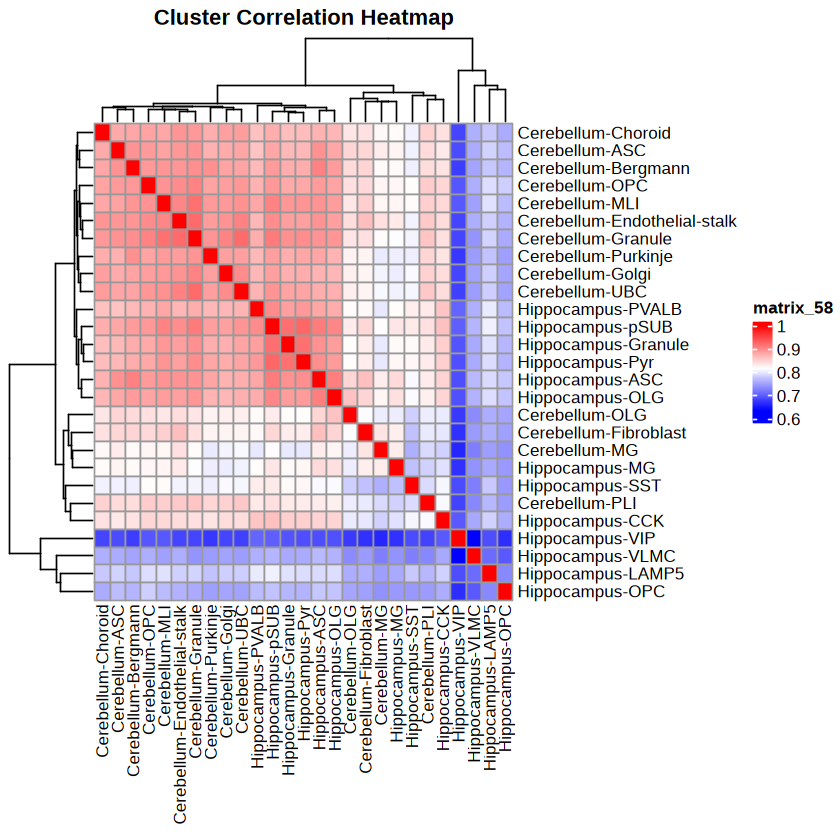

In [485]:
print(p)

### Isoform Diversity diger

#### Total subcortical diversity

In [ ]:
ReadIsoNumRandom = function(npclfglu,n = 500,mygroup){
    readids = unique(npclfglu$readid)
    readid1 = readids[sample(1:length(readids),n)]
    transt1 = npclfglu[npclfglu$readid %in% readid1,]
    transt1 = transt1[order(transt1$readid,transt1$gene_id,
                            transt1$transcript_id),]
    transt1 = transt1[!duplicated(transt1[c("readid","gene_id")]),]
    
    transt1 = transt1 %>% group_by(gene_id) %>% 
      summarise(transnum = length(unique(transcript_id)),
                readnum = length(unique(readid)))
    transt1f = transt1[transt1$readnum > 1,]
    median(transt1f$transnum)
    
    resdf = data.frame("mison" = mean(transt1f$transnum),
                       "isot" = sum(transt1$transnum),
                       "genet" = nrow(transt1),
                       "readnum" = n,
                       "group" = mygroup)
    
    return(resdf)
}

groupanid = unique(fsraw.cor$subcortical)
fsrawdpls = list()
for (i in 1:length(groupanid)) {
    fsrawdpls[[i]] = fsraw.cor[fsraw.cor$subcortical == groupanid[i],]
}
names(fsrawdpls) = groupanid

k = 100000
cellrdsto = NULL
for (i in 1:100) {
    print(i)
    for (j in 1:length(fsrawdpls)) {
      cellrdti = ReadIsoNumRandom(fsrawdpls[[j]],k,names(fsrawdpls)[j])
      cellrdsto = rbind(cellrdsto,cellrdti)
    }
}
qsave(cellrdsto,"result/figure6_other_cmp/bambu_subcortical_isoform_diversity_cmp_25_12_05.qs")


In [17]:
cellrdsto = qread("result/figure6_other_cmp/bambu_subcortical_isoform_diversity_cmp_25_12_05.qs")

file saved to result/figure6_other_cmp/subcortical_isoform_diversity_cmp_box_25_12_05.pdf



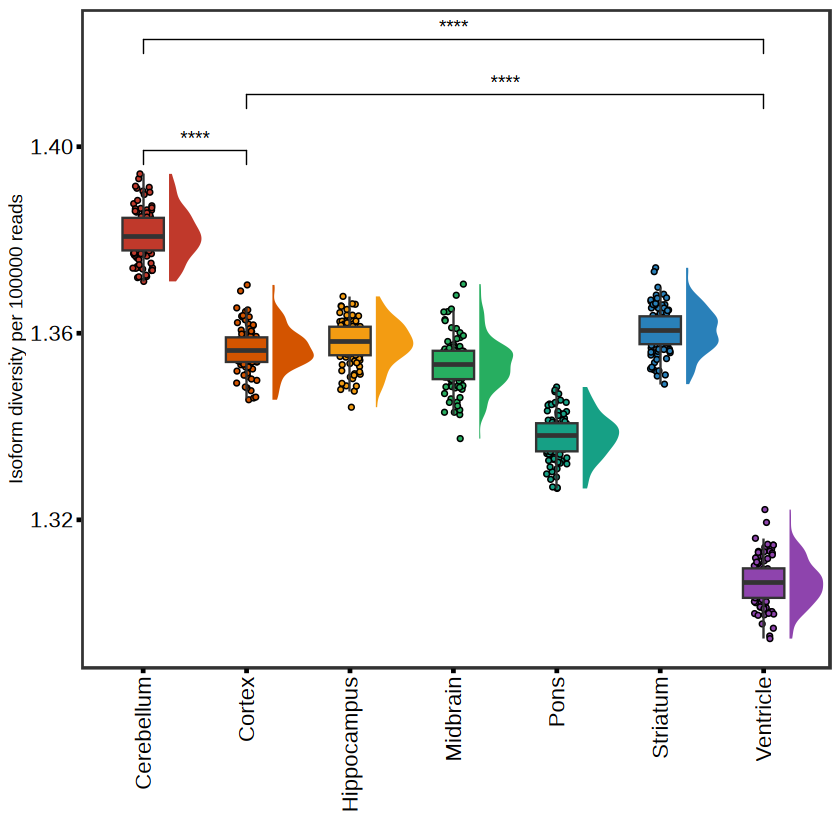

In [19]:
library(gghalves)
pt1 = ggplot(cellrdsto,aes(x = group, y = mison, fill = group))+
      geom_jitter(aes(fill = group),shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,comparison = list(c("Cerebellum","Cortex"),
                                                                                            c("Cortex","Ventricle"),
                                                                                            c("Cerebellum","Ventricle")))  +
      theme_bw()+
      theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),legend.position = "none",
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1,vjust = 0.5),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform diversity per 100000 reads") + xlab("") 
pt1
ggexport(pt1,filename = "result/figure6_other_cmp/subcortical_isoform_diversity_cmp_box_25_12_05.pdf", width = 3.5,height = 4)


#### single cell subcortical diversity

In [5]:
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")
fsraw.cor.sub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus","Cortex"),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$cell_id) & fsraw.cor.sub$cell_id != "",]
unique(fsraw.cor.sub$class)

[1] "GLU"       "GABA"      "NonNeuron" "Glu"       NA

In [5]:
#fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass) & fsraw.cor.sub$subclass != "",]

In [370]:
#total cell level and total reads level
#fsraw.cor.sub
rdstot = fsraw.cor.sub %>% group_by(areatr) %>% 
              mutate(cellnum = length(unique(cell_id))) %>%
                group_by(areatr,gene_id) %>% 
              summarise(transnum = length(unique(transcript_id)),
                        readnum = length(unique(readid)),cellnum = cellnum[1])
rdstot = rdstot %>% group_by(areatr) %>% 
              summarise(mison = mean(transnum),
                        isot = sum(transnum),
                       readnum = sum(readnum),
                       cellnum = cellnum[1])
rdstot

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


areatr,mison,isot,readnum,cellnum
<chr>,<dbl>,<int>,<int>,<int>
Cerebellum-ASC,1.166543,7887,36425,1112
Cerebellum-Bergmann,1.234728,11036,89383,2123
Cerebellum-Choroid,1.149269,6683,31107,839
Cerebellum-Endothelial_stalk,1.240769,10652,84206,2262
Cerebellum-Fibroblast,1.102448,5585,19020,872
Cerebellum-Golgi,1.196436,8393,48736,887
Cerebellum-Granule,1.552284,23826,1047196,22713
Cerebellum-MG,1.076882,4048,11141,479
Cerebellum-MLI,1.264894,12654,110265,3115


In [372]:
fsraw.cor.sub = fsraw.cor.sub[!duplicated(fsraw.cor.sub$readid),]

`summarise()` has grouped output by 'subcortical', 'subclass'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subcortical'. You can override using the
`.groups` argument.


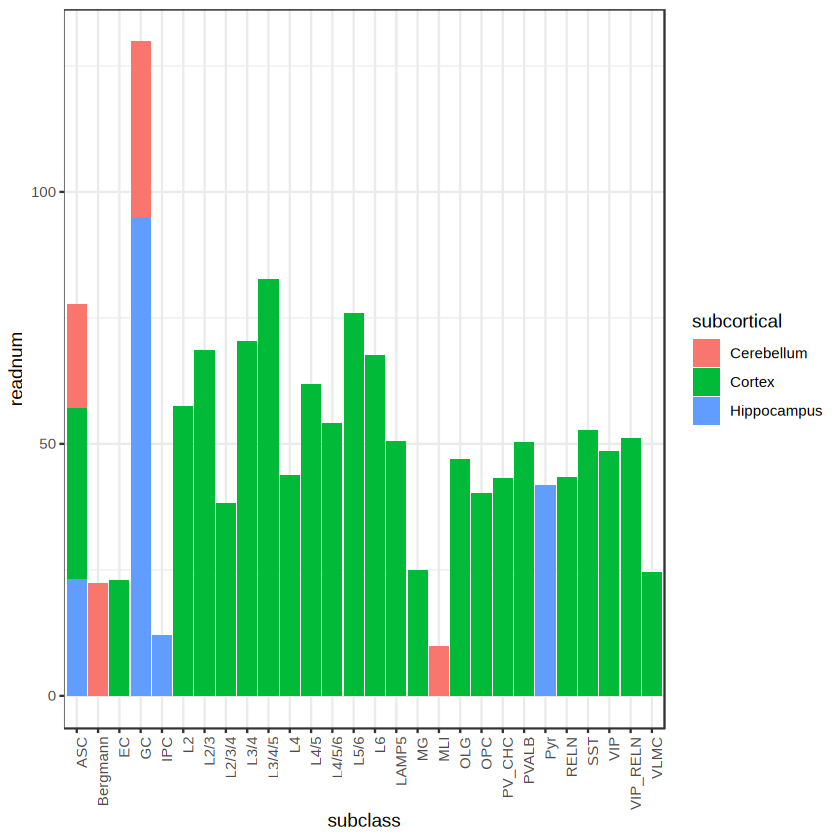

In [65]:
#cell size compare
cellread = fsraw.cor.sub %>% group_by(subcortical,subclass,cell_id) %>% summarise(readnum = length(unique(readid)))
cellread.st = cellread %>% group_by(subcortical,subclass) %>% summarise(readnum = mean(readnum))
#cellread.st
ggplot(cellread.st,aes(x = subclass,y = readnum,fill = subcortical)) + geom_bar(stat = "identity") + 
    theme_bw() + theme(axis.text.x = element_text(angle = 90,hjust = 1))


In [373]:
# subclst = fsraw.cor %>% group_by(class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
# subclst
ReadIsoNumRandom = function(npclfglu,n = 500,time){
    areatrs = unique(npclfglu$areatr)
    resdf = NULL
    for (i in 1:length(areatrs)) {
        npclfi = npclfglu[npclfglu$areatr == areatrs[i],]
        readids = unique(npclfi$readid)
        if(length(readids) < n) next;
        for (j in 1:time) {
            readid1 = readids[sample(1:length(readids),n,replace = FALSE)]
            transt1 = npclfi[npclfi$readid %in% readid1,]
            cellnum = length(unique(transt1$cell_id))
            transt1 = transt1[order(transt1$readid,transt1$gene_id,
                                    transt1$transcript_id),]
            transt1 = transt1[!duplicated(transt1[c("readid","gene_id")]),]
            
            transt1 = transt1 %>% group_by(gene_id) %>% 
              summarise(transnum = length(unique(transcript_id)),
                        readnum = length(unique(readid)))
            #transt1f = transt1[transt1$readnum > 1,]
            
            resdfi = data.frame("mison" = mean(transt1$transnum),
                               "isot" = sum(transt1$transnum),
                               "genet" = nrow(transt1),
                               "readnum" = n,
                                "cellnum" = cellnum,
                               "group" = areatrs[i])
            resdf = rbind(resdf,resdfi)
        }
    }
    return(resdf)
}

CellIsoNumRandom = function(fsraw.cor,n = 100,time = 10){
    areatrs = unique(fsraw.cor$areatr)
    cellrdsto = NULL
    for (i in 1:length(areatrs)) {
        fsrawi = fsraw.cor[fsraw.cor$areatr == areatrs[i],]
        cellids = unique(fsrawi$cell_id)
        if(length(cellids) < n) next;
        for (j in 1:time) {
            cellid.down = cellids[sample(1:length(cellids),n)]
            fsrawij = fsrawi[fsrawi$cell_id %in% cellid.down,]
            
            transtj = fsrawij %>% group_by(gene_id) %>% 
                summarise(transnum = length(unique(transcript_id)),
                readnum = length(unique(readid)))
            #transtjf = transtj[transtj$readnum > 1,]
            cellrdti = data.frame("mison" = mean(transtj$transnum),
                       "isot" = sum(transtj$transnum),
                       "genet" = nrow(transtj),
                       "cellnum" = n,
                        "readnum" = sum(transtj$readnum),
                       "group" = areatrs[i])
            cellrdsto = rbind(cellrdsto,cellrdti)
        }
    }
    return(cellrdsto)
}

CellReadIsoNumRandom = function(fsraw.cor,cn = 100,rn = 4000,time = 10){
    areatrs = unique(fsraw.cor$areatr)
    cellrdsto = NULL
    for (i in 1:length(areatrs)) {
        fsrawi = fsraw.cor[fsraw.cor$areatr == areatrs[i],]
        cellids = unique(fsrawi$cell_id)
        if(length(cellids) < cn) next;
        for (j in 1:time) {
            cellid.down = cellids[sample(1:length(cellids),cn,replace = FALSE)]
            fsrawij = fsrawi[fsrawi$cell_id %in% cellid.down,]
            readids = unique(fsrawij$readid)
            if(length(readids) < rn) next;
            readid1 = readids[sample(1:length(readids),rn,replace = FALSE)]
            fsrawij = fsrawij[fsrawij$readid %in% readid1,]
            transtj = fsrawij %>% group_by(gene_id) %>% 
                summarise(transnum = length(unique(transcript_id)),
                readnum = length(unique(readid)))
            #transtjf = transtj[transtj$readnum > 1,]
            cellrdti = data.frame("mison" = mean(transtj$transnum),
                       "isot" = sum(transtj$transnum),
                       "genet" = nrow(transtj),
                       "cellnum" = length(unique(fsrawij$cell_id)),
                        "readnum" = sum(transtj$readnum),
                       "group" = areatrs[i])
            cellrdsto = rbind(cellrdsto,cellrdti)
        }
    }
    return(cellrdsto)
}


# fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
# cellrdsto2 = CellIsoNumRandom(fsraw.cor.sub,n = 100,time = 10)
#fsraw.cor.sub$areatr = fsraw.cor.sub$subcortical
#fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
cellrdsto = CellReadIsoNumRandom(fsraw.cor.sub,1000,10000,time = 100)
qsave(cellrdsto,file = "result/figure_revision/cross_region_isodiv_time100_25_10_28.qs")
#cellrdsto2 = CellIsoNumRandom(fsraw.cor.sub,n = 50000,time = 10)

In [374]:
classan = unique(cellan[,c("subclass","class")])
classan

,subclass,class
,<chr>,<chr>
1,Granule,GLU
210,NA,NA
730,ASC,NonNeuron
872,MLI,GABA
2593,Purkinje,GABA
3432,Endothelial_stalk,NonNeuron
4065,OPC,NonNeuron
4589,Fibroblast,NonNeuron
5123,UBC,GLU


In [375]:
#
cellrdsto$subclass = MySplit(cellrdsto$group,"-",2)
cellrdsto = merge(cellrdsto,classan,by = "subclass")

In [70]:
#cellrdsto[cellrdsto$class == "Glu",]$class = "GLU"

file saved to result/figure_revision/cross_region_cmp_isoform_diversity_equally_25_10_28.pdf



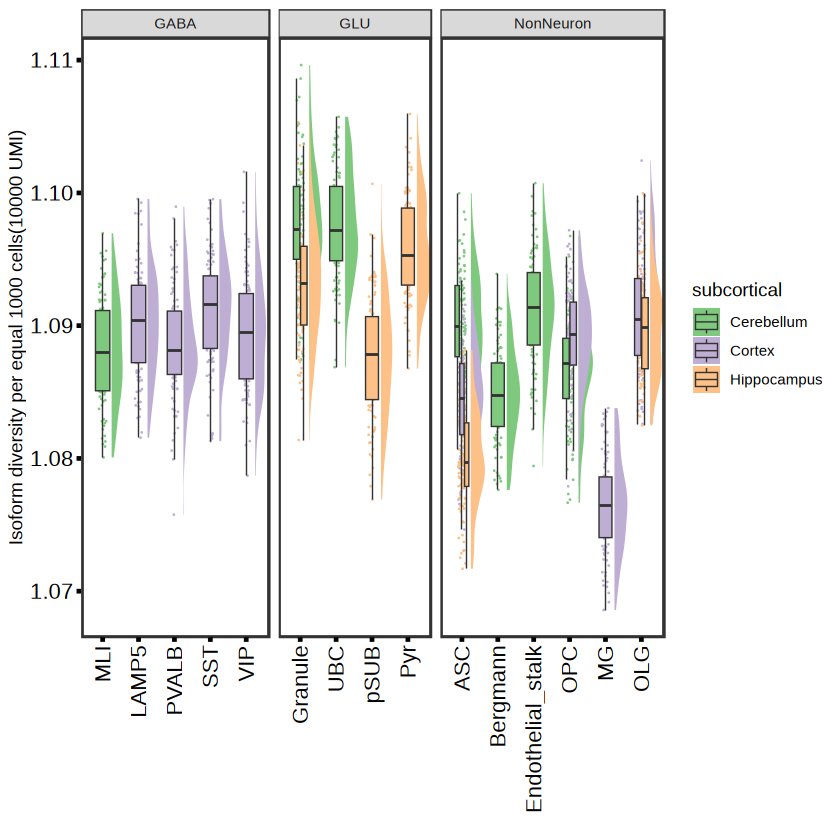

In [376]:
library(gghalves)
cellrdsto$subcortical = MySplit(cellrdsto$group,"-",1)
cellrdsto$subclass = MySplit(cellrdsto$group,"-",2)
cellrdsto = cellrdsto[order(cellrdsto$subcortical,cellrdsto$subclass),]
cellrdsto$subclass = factor(cellrdsto$subclass,levels = unique(cellrdsto$subclass))
pt1.1 = ggplot(cellrdsto,aes(x = subclass, y = mison,fill = subcortical))+
      geom_jitter(shape=21,size=0.5,width=0.1,stroke = 0) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA,linewidth = 0.3) +
      facet_grid(~class,space = "free",scales = "free") +
      theme_bw()+
      theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1,vjust = 0.5),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_brewer(palette = "Accent") + 
    ylab("Isoform diversity per equal 1000 cells(10000 UMI)") + xlab("")

# pt1.2 = ggplot(cellrdsto,aes(x = subclass, y = readnum,fill = subcortical)) +
#       geom_jitter(shape=21,size=1,width=0.1) +
#       geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
#       geom_boxplot(width=0.4,size=0.5, outlier.color =NA,linewidth = 0.3) +
#       stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
#                      ref.group = ".all.")  +
#       theme_bw()+
#       theme(panel.grid = element_blank(),
#         panel.border = element_rect(size = 1),
#         axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
#         axis.text.y = element_text(color = "black",size = 13),
#         axis.ticks = element_line(color="black",linewidth = 1)) +
#       #scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + 
#     ylab("Isoform diversity per 10000 cells") + xlab("")

# pt1.3 = ggplot(cellrdsto,aes(x = subclass, y = cellnum,fill = subcortical))+
#       geom_jitter(shape=21,size=0.1,width=0.1) +
#       geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
#       geom_boxplot(width=0.4,size=0.5, outlier.color =NA,linewidth = 0.3) +
#       stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
#                      ref.group = ".all.")  +
#       theme_bw()+
#       theme(panel.grid = element_blank(),
#         panel.border = element_rect(size = 1),
#         axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
#         axis.text.y = element_text(color = "black",size = 13),
#         axis.ticks = element_line(color="black",linewidth = 1)) +
#       #scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + 
#     ylab("Isoform diversity per 10000 cells") + xlab("")
# pt1.1
# pt1.2
# pt1.3
pt1.1
ggexport(pt1.1,filename = "result/figure_revision/cross_region_cmp_isoform_diversity_equally_25_10_28.pdf",
         width = 7,height = 4)
#pt1.1+pt1.2+pt1.3

### DTU analysis for cross region cell

[1] 1445

Warning message in (function (mapping = NULL, data = NULL, stat = "count", position = "stack", :
"Ignoring unknown parameters: `size`"
Warning message:
"The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead."


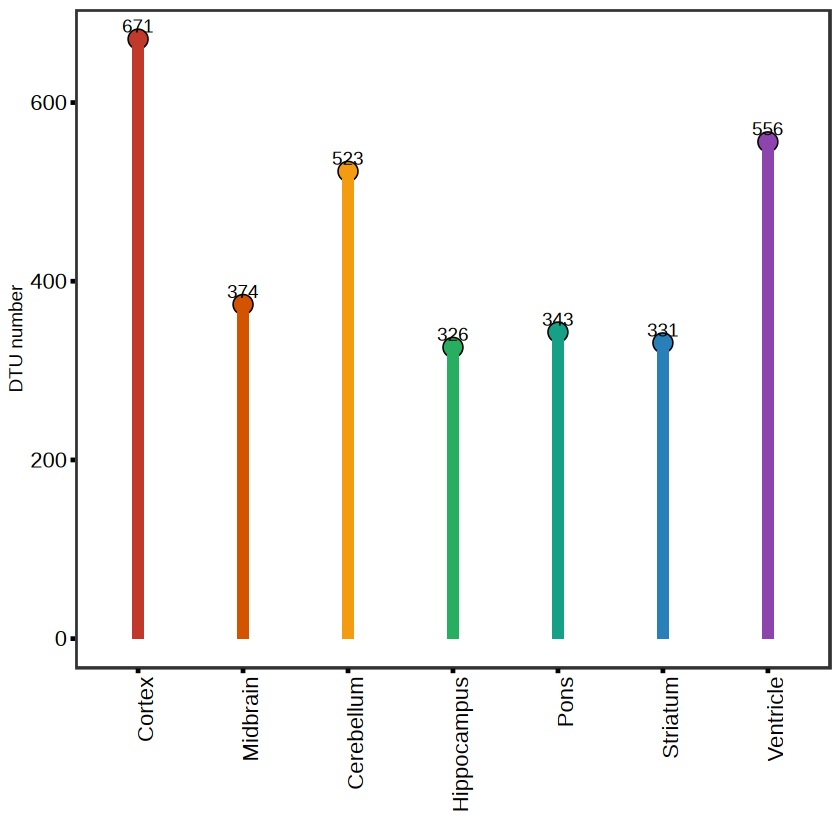

In [5]:
isosig = isosigls$subcortical
isosigf = isosig[isosig$sig != "N" ,]
length(unique(isosigf$gene_id))
#isosigf.st = isosigf %>% group_by(gene_id) %>% filter(length(unique(areatr)) == 1)
isosigf.st = isosigf %>% group_by(areatr) %>% summarise(genenum = length(unique(gene_id)))
isosigf.st$areatr = factor(isosigf.st$areatr,levels = c("Cortex","Midbrain","Cerebellum","Hippocampus",
                                                  "Pons","Striatum","Ventricle"))
p1.1 = ggplot(isosigf.st,
                aes(x= areatr, y=genenum,fill = areatr)) +
  geom_point(aes(fill = areatr),shape=21,size = 5) +
  geom_bar(width=0.1,size=0.5, stat = "identity") +
  geom_text(aes(label = genenum),vjust = -0.5) +
  theme_bw()+
  scale_fill_flatui() + ylab("DTU number") + xlab("") +
  theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1))
p1.1
# ggexport(p1.1,filename = "result/figure6_other_cmp/isosig_stat_otheregion_25_12_08.pdf",width = 3,height = 4)

file saved to result/figure_revision/cross_region_cellan_gene_qc_show_barplot_25_11_05.pdf



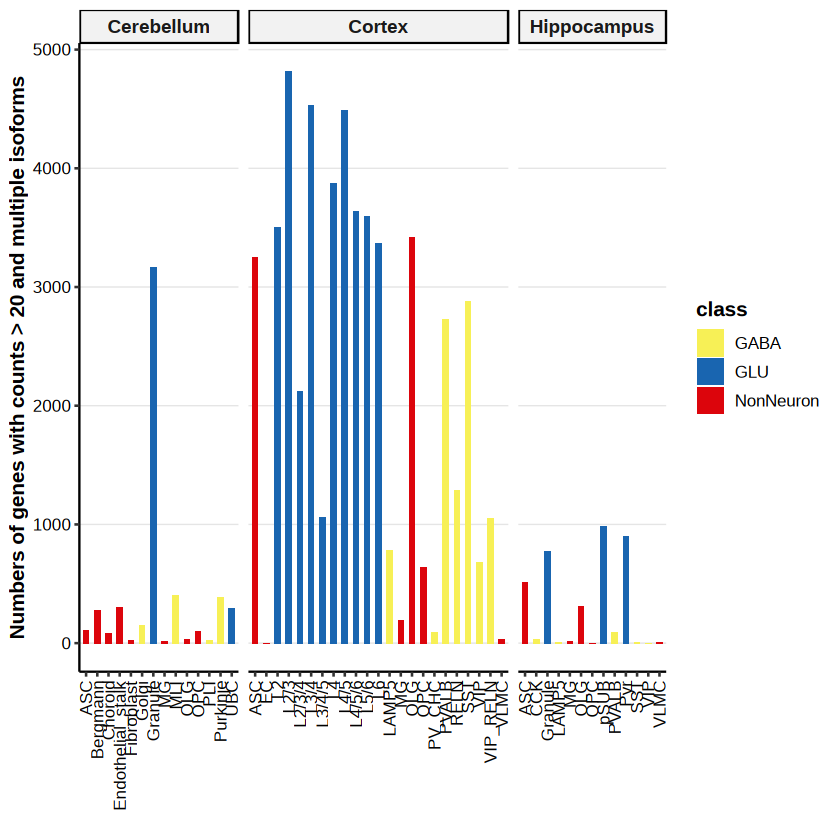

In [169]:
#qc for explain the difficulty to detect cell type level isoform different
# subst = fsraw.cor.sub %>% group_by(gene_id,class,subcortical, subclass) %>% 
#         summarise(count = length(unique(readid)),transnum = length(unique(transcript_id)))
# substm = subst[subst$count > 20 & subst$transnum > 1,] %>% 
#         group_by(class,subcortical, subclass) %>% summarise(genenumber = length(unique(gene_id)))

p1.0 = ggplot(substm, aes(x = subclass, y = genenumber, fill = class)) + 
      geom_bar(stat = "identity",width = 0.5) + 
      facet_grid( ~ subcortical, scales = "free",space = "free") + 
      scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + # 使用Brewer配色
      theme_pubr() + 
      theme(
        axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 10),
        axis.text.y = element_text(size = 10),
        axis.title = element_text(face = "bold", size = 12),
        strip.text = element_text(face = "bold", size = 11), # 分面标签
        legend.position = "right",
        legend.title = element_text(face = "bold"),
        panel.grid.major.y = element_line(color = "gray90", size = 0.3) # 添加横向网格线
      ) + 
      xlab("") + 
      ylab("Numbers of genes with counts > 20 and multiple isoforms")
p1.0
ggexport(p1.0,filename = "result/figure_revision/cross_region_cellan_gene_qc_show_barplot_25_11_05.pdf",width = 7,height = 5)

In [7]:
#calculate isosigi
FullLengthTranSt = function(fs.info,threld){
      transt = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transt = transt[transt$areatr != "" &
                          !is.na(transt$areatr),]

        transt$relative = transt$count/transt$genecount
        #transtf = transt[transt$count > 5,]
        transtf = transt[transt$genecount > threld,]
        transtf = transtf %>% group_by(transcript_id) %>% 
          mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1))
        transtf = transtf[which(transtf$meanrelative > 0.05),]
    
        arean = length(unique(transtf$areatr))
    
        #areanth = arean*(1/3)
       # print(areanth)
        transtf = transtf %>% group_by(transcript_id) %>% 
           filter(length(unique(areatr)) > 1)
        transtf = transtf %>% group_by(gene_id) %>% 
          filter(length(unique(transcript_id))>1)
        
        # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
        transtf$dr = transtf$relative - transtf$otherrelative
      return(transtf)
}
    
#layer


CalSigIsoform = function(transtf){
    transtf$sig = "N"
    table(transtf$sig)
    
    #transtf$pvalue = 1
    MyChiqTest = function(transcript_id, areatr, count){
      dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                       count = count)
      dat = dcast(dat, areatr~transcript_id,
                  value.var = "count",
                  fun.aggregate = sum)
      rownames(dat) = dat$areatr;dat = dat[-1]
      p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                   error = function(e) NA)
      return(p)
    }
    pvdf = transtf %>% group_by(gene_id) %>% summarise(pvalue = MyChiqTest(transcript_id, areatr, count))
    pvdf$padj = p.adjust(pvdf$pvalue,method = "BH")
    transtf = merge(transtf,pvdf,by = "gene_id")
    #print(head(transtf))
    # table(transtf[transtf$padj < 0.05,]$sig)
    #transtf[transtf$padj < 0.05,]$sig = "Y"
    transtf[which(transtf$dr > 0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Up"
    transtf[which(transtf$dr < -0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Down"
    return(transtf)
}


In [104]:
#try inner subregion DTU analysis
fsraw.cor.sub = fsraw.cor.sub[fsraw.cor.sub$subclass != "",]
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",
                              fsraw.cor.sub$class,"-",
                              fsraw.cor.sub$subclass)
transt = FullLengthTranSt(fsraw.cor.sub,20)
qsave(transt,file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
# isosig.sc = CalSigIsoform(transt)
# head(isosig.sc)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [78]:
#subcortical dtu stat
#transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$subclass
transt.hp.sub = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",],threld)
transt.cb.sub = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",],threld)
isosig.hp.sub = CalSigIsoform(transt.hp.sub)
isosig.cb.sub = CalSigIsoform(transt.cb.sub)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 493 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "ABCF1"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 492 remaining warnings."
Warning message:
"There were 357 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAMDC"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 356 remaining warnings."


In [80]:
cellan = unique(fsraw.cor.sub[,c("subclass","class")])
cellan

subclass,class
<chr>,<chr>
L2/3,GLU
SST,GABA
L3/4,GLU
L4,GLU
ASC,NonNeuron
VIP_RELN,GABA
VIP,GABA
L4/5,GLU
OLG,NonNeuron


file saved to result/figure_revision/dtu_number_stat_subclass_stat_total_hippocampus_25_11_04.pdf



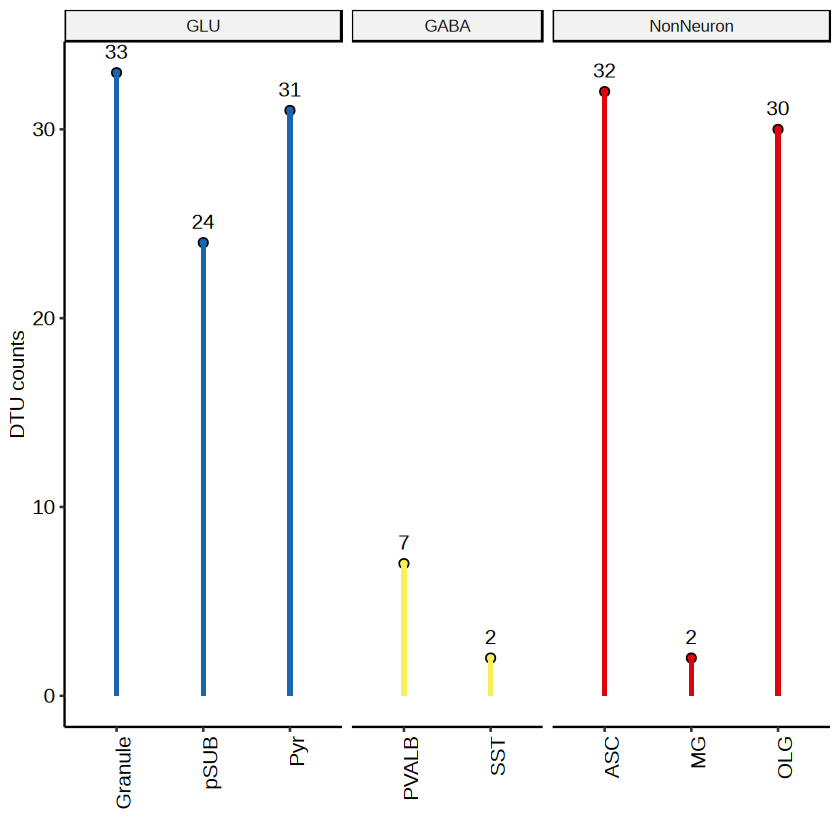

file saved to result/figure_revision/dtu_number_stat_subclass_stat_total_cerebellum_25_11_04.pdf



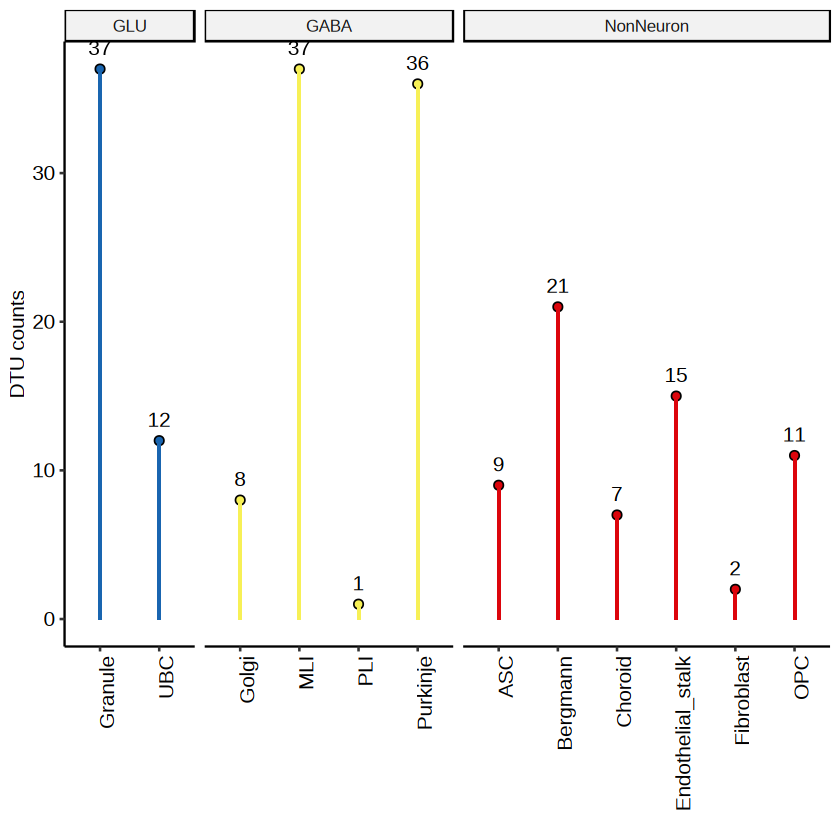

In [83]:
isosigi = isosig.hp.sub
isosigi = isosigi[isosigi$sig != "N",]
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdfg$class = factor(dtustdfg$class,levels = c("GLU","GABA","NonNeuron"))
pison1 = ggplot(data = dtustdfg,aes(x = areatr,y = count,fill = class))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~class,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    scale_color_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
    xlab("") + ylab("DTU counts")
pison1

ggexport(pison1,filename = "result/figure_revision/dtu_number_stat_subclass_stat_total_hippocampus_25_11_04.pdf",
         width = 4,height = 3)

isosigi = isosig.cb.sub
isosigi = isosigi[isosigi$sig != "N",]
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdfg$class = factor(dtustdfg$class,levels = c("GLU","GABA","NonNeuron"))
pison2 = ggplot(data = dtustdfg,aes(x = areatr,y = count,fill = class))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~class,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    scale_color_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
    xlab("") + ylab("DTU counts")
pison2

ggexport(pison2,filename = "result/figure_revision/dtu_number_stat_subclass_stat_total_cerebellum_25_11_04.pdf",
         width = 4,height = 3)

In [309]:
#subcortical dtu stat
#transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$subcortical
transt.glu = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$class == "GLU",],threld)
transt.gaba = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$class == "GABA",],threld)
transt.nn = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$class == "NonNeuron",],threld)
isosig.glu = CalSigIsoform(transt.glu)
isosig.gaba = CalSigIsoform(transt.gaba)
isosig.nn = CalSigIsoform(transt.nn)
isosig.glu$group = "GLU"
isosig.gaba$group = "GABA"
isosig.nn$group = "NonNeuron"

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 1303 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 1302 remaining warnings."
Warning message:
"There were 508 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 2: `gene_id = "ABAT"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 507 remain

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


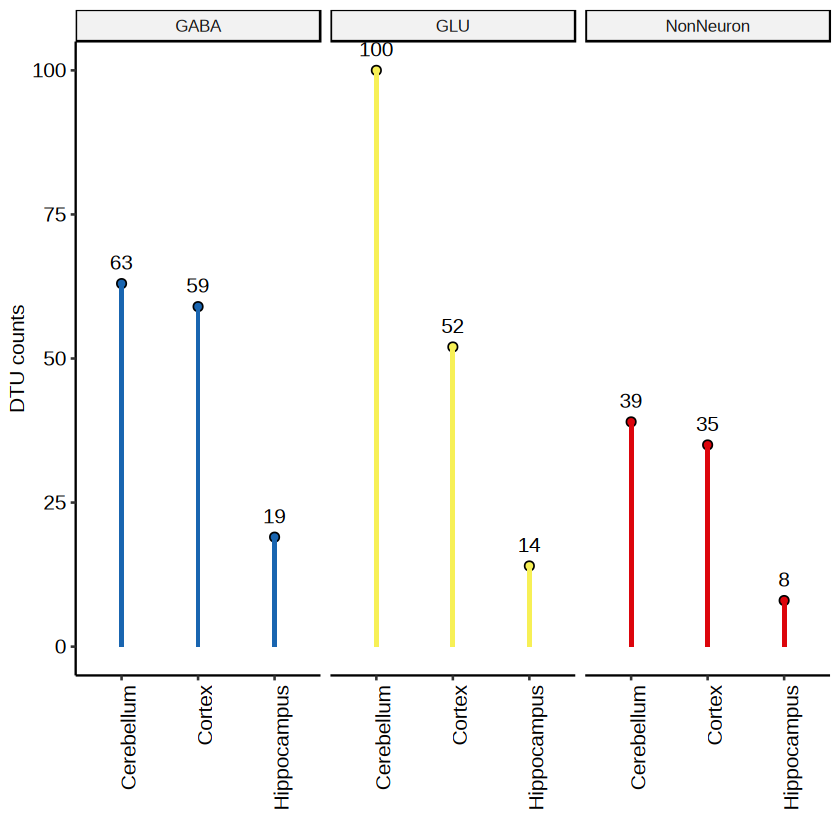

In [326]:
isosigi = rbind(isosig.glu,isosig.gaba,isosig.nn)
isosigi = isosigi %>% group_by(transcript_id,areatr) %>% filter(length(unique(group)) > 2)
isosigi = isosigi[isosigi$sig != "N",]
dtustdfg = isosigi %>% group_by(areatr,group) %>% summarise(count = length(unique(gene_id)))
#dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdfg$class = factor(dtustdfg$group,levels = c("GLU","GABA","NonNeuron"))
pison1 = ggplot(data = dtustdfg,aes(x = areatr,y = count,fill = group))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~group,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    scale_color_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
    xlab("") + ylab("DTU counts")
pison1

library(ggvenn)


In [546]:
library(circlize)
col_fun = colorRamp2(c(-0.4,-0.1, 0,0.1, 0.4), hcl_palette = "RdBu",reverse = T)

isosigi = isosig.hp.sub
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
isosigi = isosig.hp.sub[isosig.hp.sub$transcript_id %in% hubtrans,]
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isomx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$gene_id;isomx = isomx[,-1]
isomx = isomx[,colSums(isomx != 0) > 10]
nrow(isomx)
annoid = c("DBNDD2","TUBA8","CDC42","GRIA2","CALB1","YWHAH","C7H14orf132")
#df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))


pht1 = Heatmap(isomx,name = "Delta u",
               row_km = 7,
               right_annotation = ha,row_names_side = "left",
              #row_km = 5,
              show_row_names = F,border = TRUE,
              #row_split = split,
              #column_split = col_groups,
              #top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht1
ggexport(pht1,filename = "result/figure_revision/subcortical_hp_cell_subclass_DTU_heatmap_25_11_04.pdf",width = 5,height = 6)


[1] 67

Warning message:
"The input is a data frame-like object, convert it to a matrix."


pdf 
  2

file saved to result/figure_revision/subcortical_hp_cell_subclass_DTU_heatmap_25_11_04.pdf



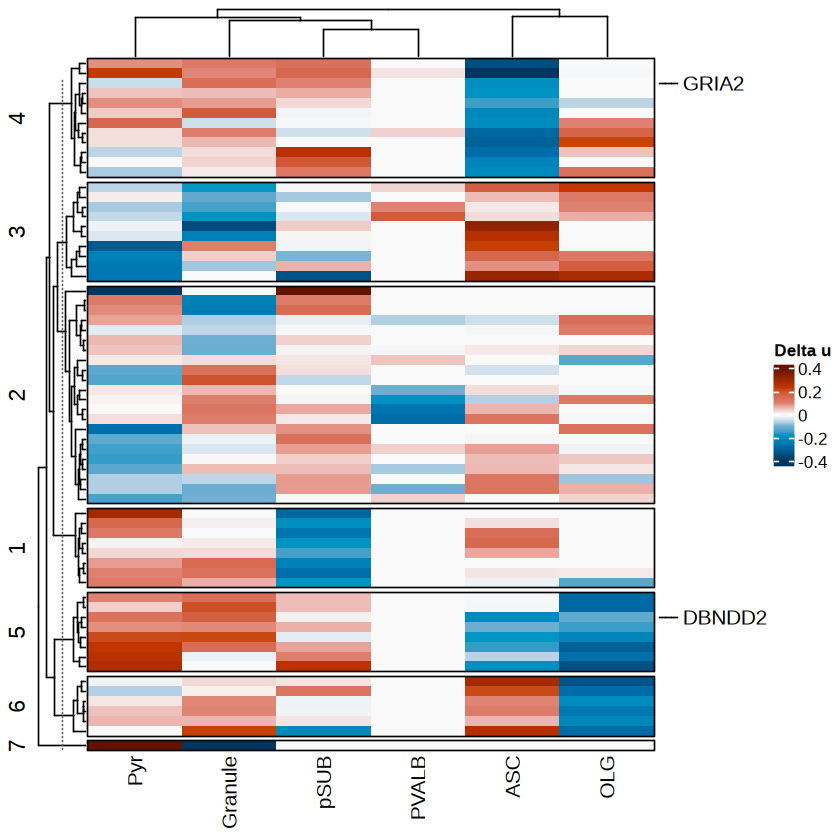

In [550]:
pht1
ggexport(pht1,filename = "result/figure_revision/subcortical_hp_cell_subclass_DTU_heatmap_25_11_04.pdf",width = 5,height = 6)

[1] 81

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cb_cell_subclass_DTU_heatmap_25_11_04.pdf



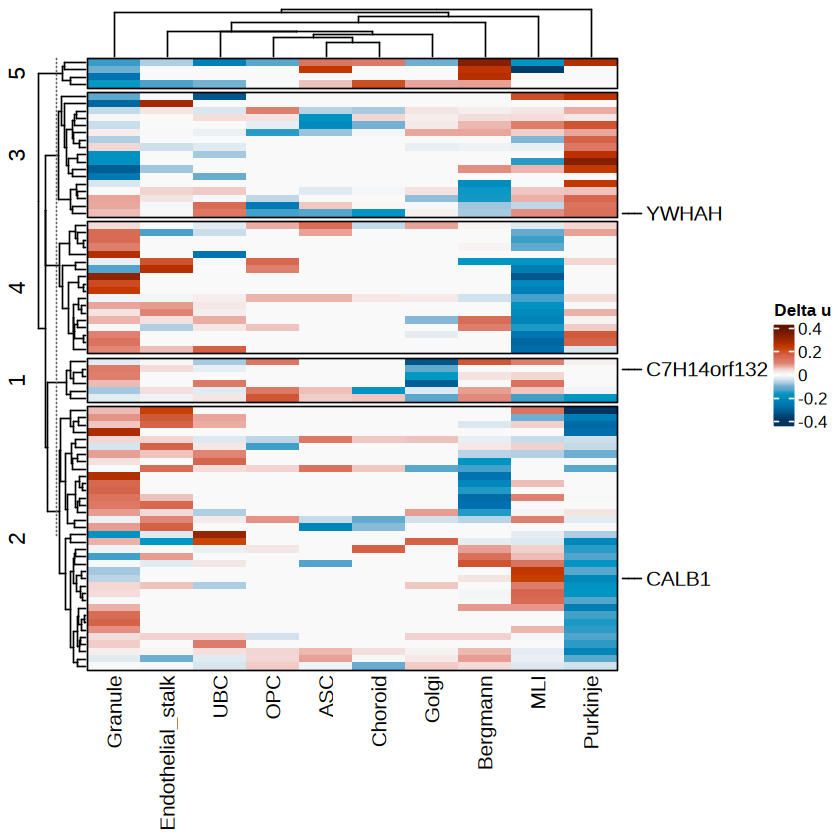

In [551]:
isosigi = isosig.cb.sub
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
isosigi = isosig.cb.sub[isosig.cb.sub$transcript_id %in% hubtrans,]
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isomx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$gene_id;isomx = isomx[,-1]
isomx = isomx[,colSums(isomx != 0) > 10]
nrow(isomx)
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))

In [571]:
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$class
transt.hp.cl = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",],threld)
transt.cb.cl = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",],threld)
isosig.hp.cl = CalSigIsoform(transt.hp.cl)
isosig.cb.cl = CalSigIsoform(transt.cb.cl)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 402 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAMDC"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 401 remaining warnings."
Warning message:
"There were 605 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 2: `gene_id = "ABAT"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 604 remaining warnings."


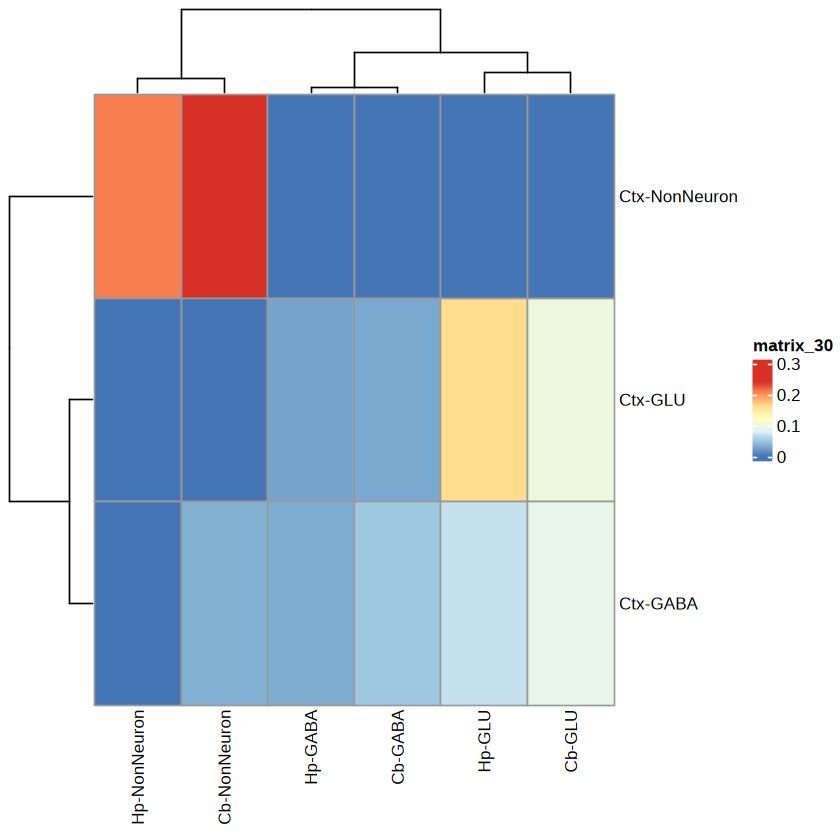

In [572]:
#length(intersect(isosig.hp.sub[isosig.hp.sub$sig != "N",]$gene_id,isosigls$subclass[isosigls$subclass$sig != "N",]$gene_id))
#length(intersect(isosig.cb.sub[isosig.cb.sub$sig != "N",]$gene_id,isosigls$subclass[isosigls$subclass$sig != "N",]$gene_id))
#subcortical dtu stat
#transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
isosig.hp.cl$id = paste0(isosig.hp.cl$transcript_id,"-",isosig.hp.cl$sig)
isosig.hp.clf = isosig.hp.cl[isosig.hp.cl$sig != "N",]
isosig.hp.clf$areatr = paste0("Hp-",isosig.hp.clf$areatr)
isosig.cb.cl$id = paste0(isosig.cb.cl$transcript_id,"-",isosig.cb.cl$sig)
isosig.cb.clf = isosig.cb.cl[isosig.cb.cl$sig != "N",]
isosig.cb.clf$areatr = paste0("Cb-",isosig.cb.clf$areatr)
isosig.subf = rbind(isosig.hp.clf,isosig.cb.clf)
isosig.ref = isosigls$class
isosig.ref = isosig.ref[isosig.ref$sig != "N",]
isosig.ref = isosig.ref[isosig.ref$gene_id %in% isosig.subf$gene_id,]
isosig.ref$id = paste0(isosig.ref$transcript_id,"-",isosig.ref$sig)
isosig.ref$areatr = paste0("Ctx-",isosig.ref$areatr)

# 示例数据（如果已有数据，可跳过此部分）
Jaccardsig = function(df1,df2){
    groups1 <- unique(df1$areatr)
    groups2 <- unique(df2$areatr)
    jaccard_matrix <- matrix(0, nrow = length(groups1), ncol = length(groups2))
    rownames(jaccard_matrix) <- groups1
    colnames(jaccard_matrix) <- groups2
    
    for (i in seq_along(groups1)) {
      for (j in seq_along(groups2)) {
        set1 <- unique(df1$id[df1$areatr == groups1[i]])  # 获取df1中当前分组的唯一id
        set2 <- unique(df2$id[df2$areatr == groups2[j]])  # 获取df2中当前分组的唯一id
        intersection <- length(intersect(set1, set2))     # 交集大小
        union <- length(union(set1, set2))               # 并集大小
        jaccard_matrix[i, j] <- ifelse(union == 0, 0, intersection / union)  # 避免除零错误
      }
    }
    return(jaccard_matrix)
}
jcd.sub = Jaccardsig(isosig.ref,isosig.subf)
pheatmap(jcd.sub)


Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cb_cell_subclass_DTU_heatmap_25_11_04.pdf



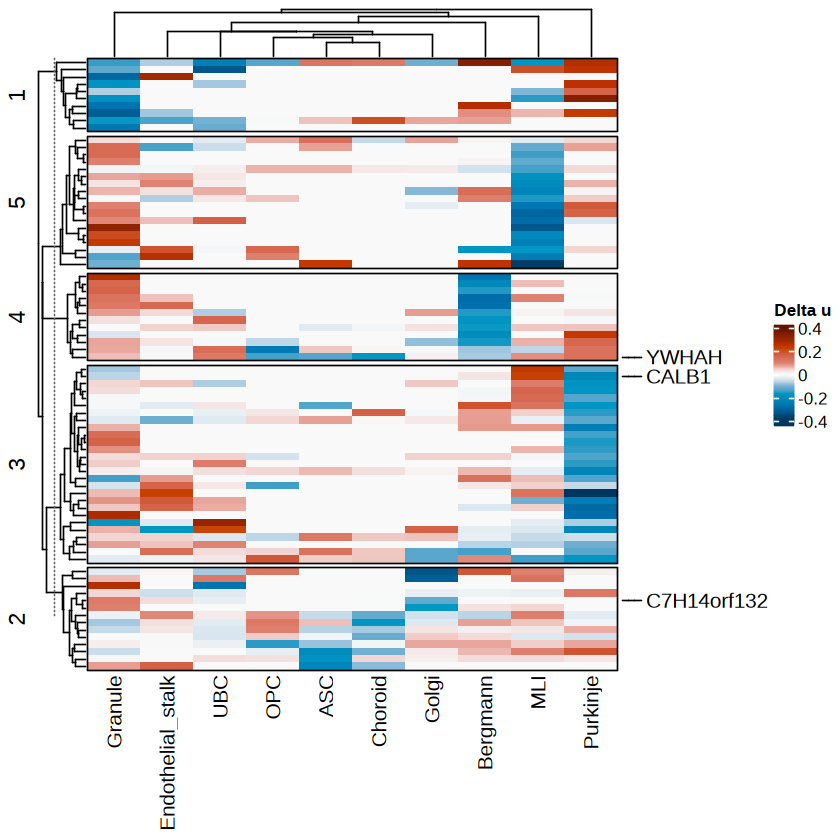

In [557]:
pht2 = Heatmap(isomx,name = "Delta u",
              row_km = 5,
              show_row_names = F,border = TRUE,
              #row_split = split,
              #column_split = col_groups,
              #top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
               right_annotation = ha,row_names_side = "left",
              column_gap = unit(2, "mm"))
pht2

ggexport(pht2,filename = "result/figure_revision/subcortical_cb_cell_subclass_DTU_heatmap_25_11_04.pdf",width = 5,height = 6)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


group,"length(sig[sig == ""Y""])/length(sig)"
<chr>,<dbl>
GABA,0.7647059
GLU,0.8235294
NonNeuron,0.6470588


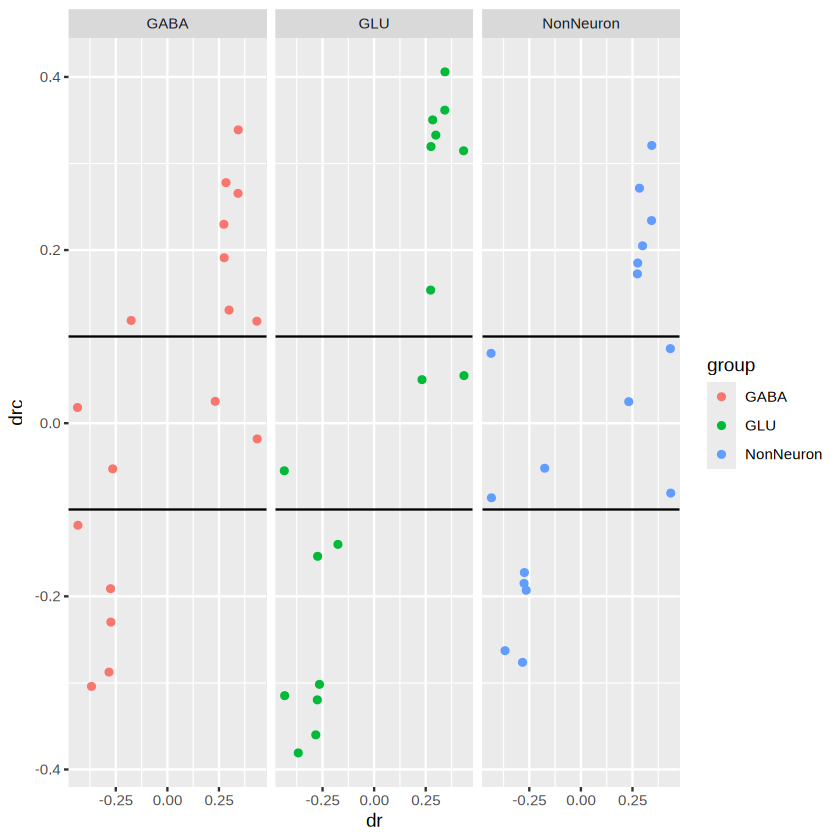

In [373]:
isosig.glu1 = isosig.glu[isosig.glu$areatr %in% c("Cerebellum","Cortex"),]
isosig.gaba1 = isosig.gaba[isosig.gaba$areatr %in% c("Cerebellum","Cortex"),]
isosig.nn1 = isosig.nn[isosig.nn$areatr %in% c("Cerebellum","Cortex"),]
isosig.glu1 = isosig.glu1 %>% group_by(gene_id,transcript_id,group) %>% filter(n() == 2) %>% summarise(drc = relative[areatr == "Cortex"] - relative[areatr == "Cerebellum"])
isosig.gaba1 = isosig.gaba1 %>% group_by(gene_id,transcript_id,group) %>% filter(n() == 2) %>% summarise(drc = relative[areatr == "Cortex"] - relative[areatr == "Cerebellum"])
isosig.nn1 = isosig.nn1 %>% group_by(gene_id,transcript_id,group) %>% filter(n() == 2) %>% summarise(drc = relative[areatr == "Cortex"] - relative[areatr == "Cerebellum"])
isosigi = rbind(isosig.glu1,isosig.gaba1,isosig.nn1)

isosig.ref = isosigls$subcortical
isosig.ref = isosig.ref[isosig.ref$sig != "N" & isosig.ref$areatr %in% c("Cortex","Cerebellum"),]
isosig.ref = isosig.ref %>% group_by(gene_id,transcript_id) %>% filter(n() == 2) %>% 
            summarise(dr = relative[areatr == "Cortex"] - relative[areatr == "Cerebellum"])
isosig.ref = isosig.ref[abs(isosig.ref$dr) > 0.1,]
isosigi.fil = isosigi[isosigi$transcript_id %in% isosig.ref$transcript_id,]
isosigi.fil = merge(isosigi.fil[,c("gene_id","transcript_id","group","drc")],isosig.ref[,c("gene_id","transcript_id","dr")])
isosigi.fil = isosigi.fil %>% group_by(gene_id,transcript_id) %>% filter(length(unique(group)) == 3)
ggplot(isosigi.fil,aes(x = dr,y=drc,color = group)) + geom_point() + facet_wrap(~group) + geom_hline(yintercept = c(-0.1,0.1))
isosigi.fil$sig = "N"
isosigi.fil[abs(isosigi.fil$drc) > 0.1,]$sig = "Y"
isosigi.st = isosigi.fil %>% group_by(group) %>% summarise(length(sig[sig == "Y"])/length(sig))
isosigi.st

[1] 723

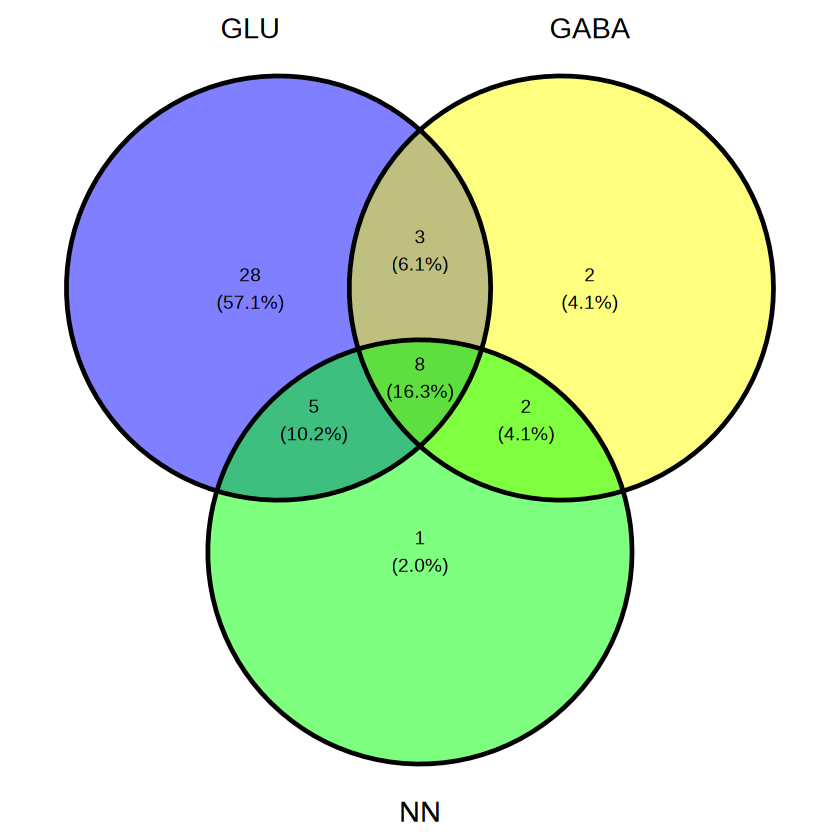

In [364]:
isosigi = rbind(isosig.glu,isosig.gaba,isosig.nn)
isosigi.fil = isosigi %>% group_by(transcript_id,areatr) %>% filter(length(unique(group)) > 2)
isosig.ref = isosigls$subcortical
isosig.ref = isosig.ref[isosig.ref$sig != "N" & isosig.ref$areatr %in% c("Hippocampus","Cerebellum"),]
length(unique(isosigi.fil$gene_id))
isosigi.fil = isosigi.fil[isosigi.fil$sig != "N" & isosigi.fil$gene_id %in% isosig.ref$gene_id,]
ggvenn(list("GLU" = isosigi.fil[isosigi.fil$group == "GLU",]$gene_id,
           "GABA" = isosigi.fil[isosigi.fil$group == "GABA",]$gene_id,
           "NN" = isosigi.fil[isosigi.fil$group == "NonNeuron",]$gene_id))

In [374]:
threld = 20
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$class)
transt.cl = FullLengthTranSt(fsraw.cor.sub,threld)
isosig.cl = CalSigIsoform(transt.cl)
isosig.cl

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2630 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2629 remaining warnings."


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
AAAS,AAAS-FS-1,Cerebellum-GLU,5,29,0.17241379,0.1011077,0.07733900,0.0950747922,N,0.2055856,0.3354159
AAAS,AAAS-FS-1,Cortex-GABA,6,55,0.10909091,0.1011077,0.09844663,0.0106442802,N,0.2055856,0.3354159
AAAS,AAAS-FS-1,Cortex-GLU,15,234,0.06410256,0.1011077,0.11344274,-0.0493401798,N,0.2055856,0.3354159
AAAS,AAAS-FS-1,Cortex-NonNeuron,2,34,0.05882353,0.1011077,0.11520242,-0.0563788927,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cerebellum-GLU,22,29,0.75862069,0.8311447,0.85531941,-0.0966987186,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cortex-GABA,47,55,0.85454545,0.8311447,0.82334449,0.0312009679,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cortex-GLU,194,234,0.82905983,0.8311447,0.83183970,-0.0027798661,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cortex-NonNeuron,30,34,0.88235294,0.8311447,0.81407532,0.0682776168,N,0.2055856,0.3354159
AACS,NM_001284010.1,Cerebellum-GLU,55,65,0.84615385,0.8286517,0.82427615,0.0218776914,N,0.2239977,0.3575931


Warning message:
"The input is a data frame-like object, convert it to a matrix."


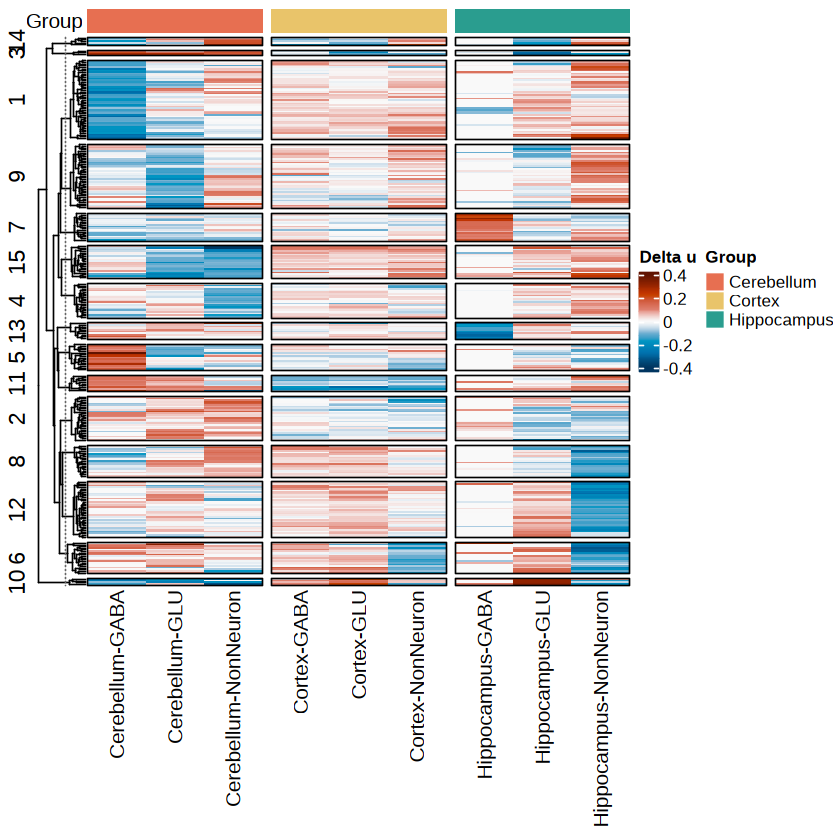

In [399]:
# 从列名提取group信息
isosigi = isosig.cl
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
isosigi = isosig.cl[isosig.cl$transcript_id %in% hubtrans,]
#head(transt.fil)
# 从列名中提取group信息（假设列名格式为"group_areatr"）
#transt.fil = transt.fil %>% group_by(transcript_id) %>% filter(length(unique(group)) > 1)
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isomx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$gene_id;isomx = isomx[,-1]
isomx = isomx[(rowSums(isomx[,1:3] != 0) > 1) & (rowSums(isomx[,4:6] != 0) > 1) & (rowSums(isomx[,7:9] != 0) > 1),]
col_groups <- MySplit(colnames(isomx),"-",1)
library(circlize)
#col_groups <- sapply(strsplit(colnames(isomx), "-"), function(x) x[1])

# 创建顶部注释
top_annotation <- HeatmapAnnotation(
  Group = col_groups,
  col = list(Group = c("Cerebellum" = "#e76f51", "Cortex" = "#e9c46a", "Hippocampus" = "#2a9d8f")),
  annotation_name_side = "left"
)
col_fun = colorRamp2(c(-0.4,-0.1, 0,0.1, 0.4), hcl_palette = "RdBu",reverse = T)
n = 15
fit = kmeans(isomx,n)
split <- factor(as.character(fit$cluster), levels=as.character(c(1:n)))
# 绘制完整的热图
pht = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,
              row_split = split,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht
#ggexport(pht,filename = "result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_25_11_04.pdf",width = 6,height = 8)

Warning message:
"The input is a data frame-like object, convert it to a matrix."


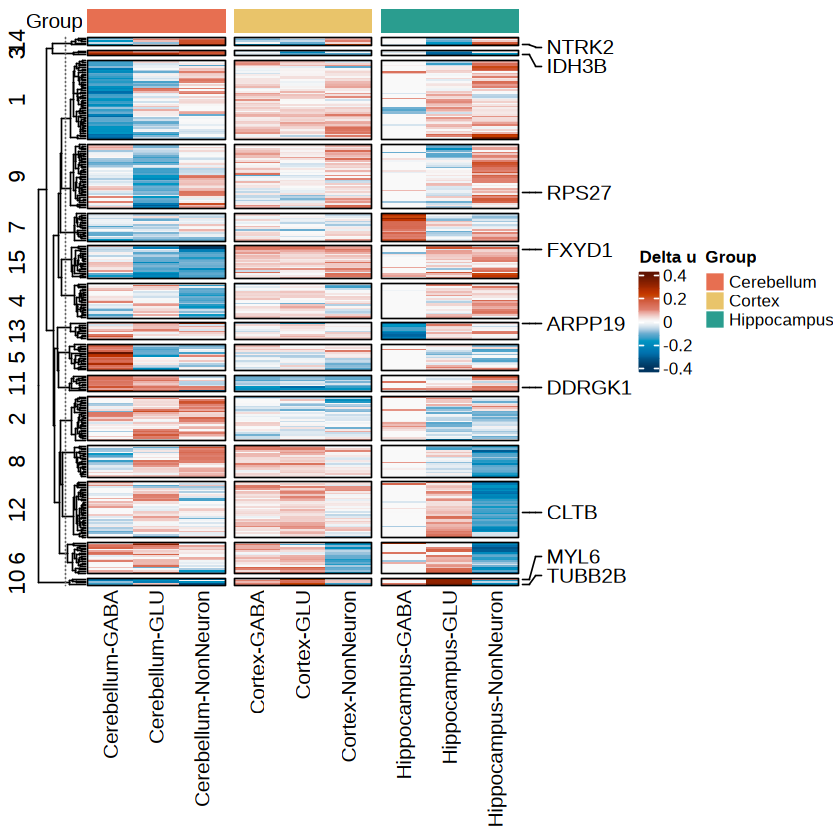

In [404]:
annoid = c("ARPP19","ARPP21","DDRGK1","RPS27","PPP3CB","IDH3B","SYNGR1","FXYD1","EPB41",
           "PDHA1","SLC8A1","RPL7A","NTRK2","TUBB2B","CLTB","MYL6")
#df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))
pht = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,
              row_split = split,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              right_annotation = ha,row_names_side = "left",
              column_gap = unit(2, "mm"))
pht


In [462]:
#rownames(isomx)[which(split == 8)]
rownames(isomx)[which(split == 8)]

[1] "AGAP3"       "ANP32B"      "AURKAIP1"    "BAG6"        "C18H18orf32"
 [6] "CCDC12"      "CTNNB1"      "GRIA2"       "MATR3"       "MICALL1"    
[11] "NDUFS7"      "NFE2L1"      "PDCD4"       "RNPC3"       "SAMD8"      
[16] "SFXN1"       "SUGP2"       "ZCCHC17"     "ZNF655"

In [428]:
isomx["TPM3",]

,Cerebellum-GABA,Cerebellum-GLU,Cerebellum-NonNeuron,Cortex-GABA,Cortex-GLU,Cortex-NonNeuron,Hippocampus-GABA,Hippocampus-GLU,Hippocampus-NonNeuron
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TPM3,0.2529489,-0.1905154,0.09808162,-0.068705,-0.07083131,0.01390579,0,-0.03609729,0.001212734


Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure6_other_cmp/sigiso_subcortical_class_DTU_cluster_heatmap_clone_25_11_06.pdf



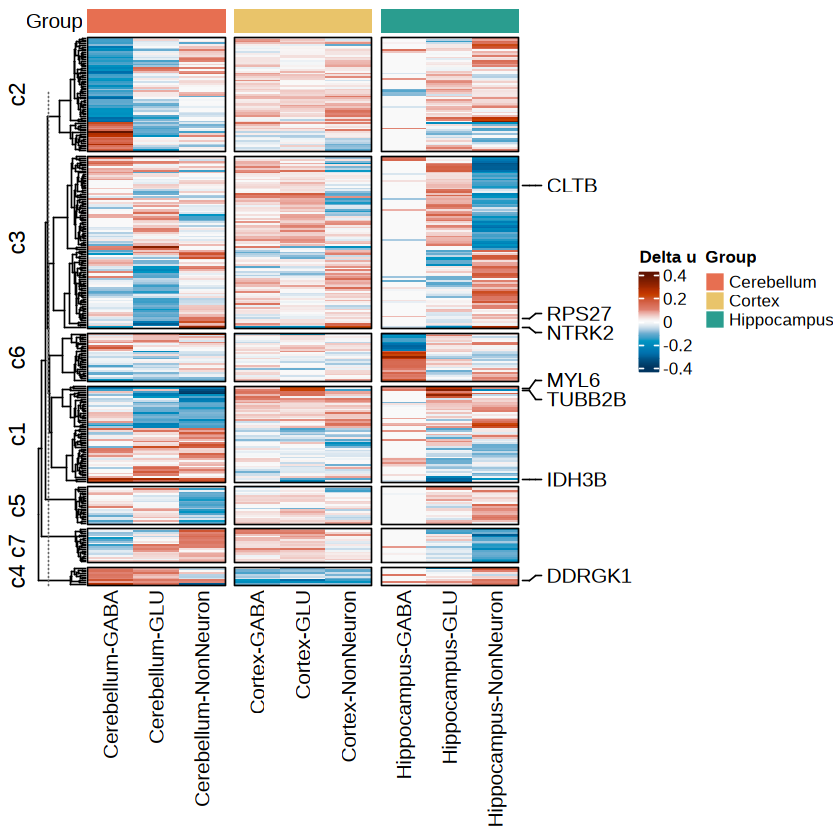

In [433]:
clist = list("c1" = c(10,3,15,2),"c2" = c(1,5),"c3" = c(9,14,6,12),"c4" = c(11),
             "c5" = c(4),
             "c6" = c(13,7),"c7" = c(8))

MergeCluster = function(htls,clist){
  #merge cluster
  split = as.character(htls$rowcluster)
  for (i in 1:length(clist)) {
    split[which(as.character(split) %in% as.character(clist[[i]]))] = names(clist)[i]
  }
  # 
  split = factor(as.character(split), levels = names(clist))
  names(split) = names(htls$rowcluster)
  reorder.hmap = Heatmap(htls$ht@matrix, 
                         name = "delta Isoform\n ratio",
                         row_split = split,
                         # cluster_rows = F,
                         cluster_columns = F,
                         cluster_row_slices = FALSE,
                         #cluster_column_slices = FALSE,
                         show_row_names = F,
                         col = colorRamp2(c(-0.4,0,0.4), 
                                          c("#08306B", "white", "red")),
                         column_order = htls$colorder
  )
  reorder.hmap
  htls$rowcluster = split
  htls$ht = reorder.hmap
  return(htls)
}
htls = list(rowcluster = split,ht = pht)
htls = MergeCluster(htls,clist)
htmx = htls$ht@matrix

annoid = c("DDRGK1","RPS27","IDH3B","SYNGR1","NTRK2","TUBB2B","CLTB","MYL6")
#df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))

pht2 = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,
               right_annotation = ha,row_names_side = "left",
              #row_km = 15,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"),
              row_split = htls$rowcluster)
pht2
ggexport(pht2,filename = "result/figure6_other_cmp/sigiso_subcortical_class_DTU_cluster_heatmap_clone_25_11_06.pdf",
         width =7,height = 7)

In [476]:
table(htls$rowcluster)
length(htls$rowcluster)
97/292


c1 c2 c3 c4 c5 c6 c7 
54 64 97 10 21 27 19 

[1] 292

[1] 0.3321918

### Isoform similarity compare

In [8]:
#fsraw.cor$areatr = fsraw.cor$subcortical
# fsraw.cor.sub[fsraw.cor.sub$areatr != "Cortex",]$areatr = paste0(fsraw.cor.sub[fsraw.cor.sub$areatr != "Cortex",]$subcortical,
#                                                                 fsraw.cor.sub[fsraw.cor.sub$areatr != "Cortex",]$subclass)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",
                              fsraw.cor.sub$subclass)
transt = FullLengthTranSt(fsraw.cor.sub,20)
isosig.sc = CalSigIsoform(transt)
#only for 
# isosigi = isosig3

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2933 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2932 remaining warnings."


In [108]:
# isosig.sc = CalSigIsoform(transt)
# head(isosig.sc)
# transt$relative = transt$count/transt$genecount
# transt = transt %>% group_by(transcript_id) %>% 
#       mutate(meanrelative = mean(relative),
#              otherrelative = (sum(relative) - relative)/(n() - 1))
# transt$dr = transt$relative - transt$otherrelative

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2929 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2928 remaining warnings."


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,AAAS,AAAS-FS-1,Cerebellum-GLU-Granule,5,29,0.17241379,0.1068386,0.09590945,0.07650435,N,0.1094977,0.182641
2,AAAS,AAAS-FS-1,Cortex-GABA-PVALB,5,32,0.15625000,0.1068386,0.09860341,0.05764659,N,0.1094977,0.182641
3,AAAS,AAAS-FS-1,Cortex-GLU-L2/3,8,43,0.18604651,0.1068386,0.09363733,0.09240918,N,0.1094977,0.182641
4,AAAS,AAAS-FS-1,Cortex-GLU-L3/4,3,50,0.06000000,0.1068386,0.11464508,-0.05464508,N,0.1094977,0.182641
5,AAAS,AAAS-FS-1,Cortex-GLU-L4,1,33,0.03030303,0.1068386,0.11959457,-0.08929154,N,0.1094977,0.182641
6,AAAS,AAAS-FS-1,Cortex-GLU-L4/5/6,2,21,0.09523810,0.1068386,0.10877206,-0.01353397,N,0.1094977,0.182641


In [114]:
#transt$areatr = gsub(transt$areatr,pattern = "Glu",replacement = "GLU")
qsave(isosig.sc,file = "data/cross_region/DTU_ls_subcell_level_25_10_28.qs")
qsave(transt,file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")

#### Correlation issue

In [6]:
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <ce>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <b4>"
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <ce>"
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <b4>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlat

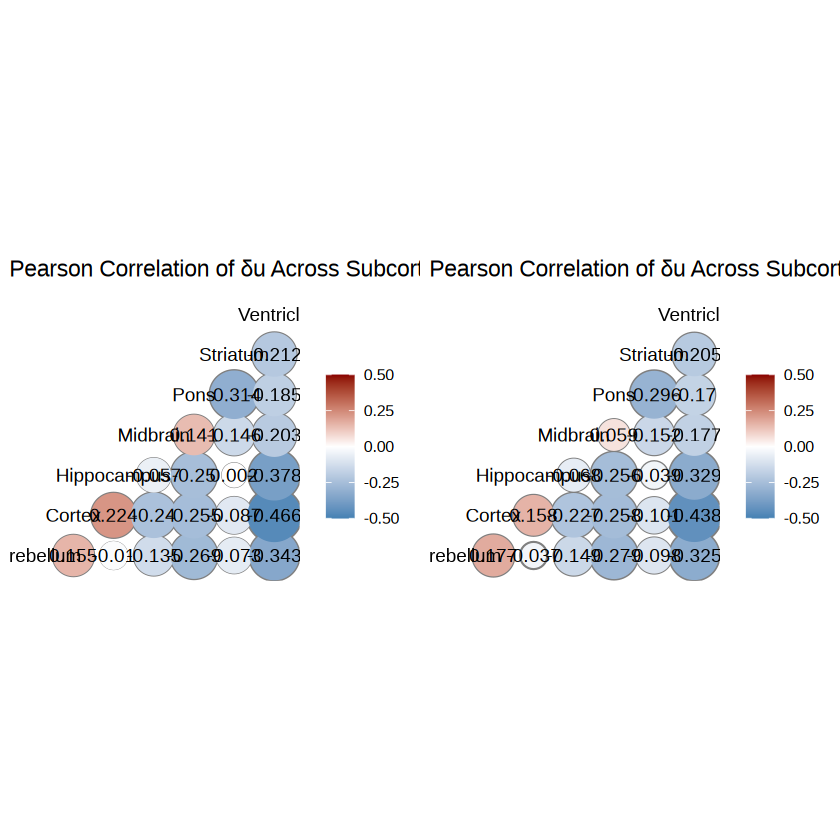

In [38]:
#correlation issue
isosigi = isosigls$subcortical
isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]
#pheatmap(subcor.pr)

pcor1 = GGally::ggcorr(isosigf.mx, 
               label = TRUE,
               limits = c(-0.5,0.5),midpoint = 0,
                      min_size = 6, max_size = 15,label_round = 3,
               method =  c("pairwise", "pearson"), geom = "circle", 
               low = "steelblue", mid = "white", high = "darkred")
pcor1 = pcor1 + ggtitle("Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)")

isosigi = isosigls$subcortical
#isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]
pcor2 = GGally::ggcorr(isosigf.mx, 
               label = TRUE,
               limits = c(-0.5,0.5),midpoint = 0,
                      min_size = 6, max_size = 15,label_round = 3,
               method =  c("pairwise", "pearson"), geom = "circle", 
               low = "steelblue", mid = "white", high = "darkred")
pcor2 = pcor2 + ggtitle("Pearson Correlation of δu Across Subcortical Regions (All Isoforms)")

# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "relative",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# #isosigf.mx = isosigf.mx[,1:6]
# #isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > 2,]
# pcor3 = GGally::ggcorr(isosigf.mx, 
#                label = TRUE,
#                limits = c(0.5,0.9),midpoint = 0.75,
#                       min_size = 6, max_size = 15,label_round = 3,
#                method =  c("pairwise", "pearson"), geom = "circle", 
#                low = "steelblue", mid = "white", high = "darkred")
# pcor3 = pcor3 + ggtitle("Correlation by u value of all isoform")

# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# #isosigf.mx = isosigf.mx[,1:6]
# #isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0)  > 2,]
# pcor4 = GGally::ggcorr(isosigf.mx, 
#                label = TRUE,
#                limits = c(-0.5,0.5),midpoint = 0,
#                       min_size = 6, max_size = 15,label_round = 3,
#                method =  c("pairwise", "pearson"), geom = "circle", 
#                low = "steelblue", mid = "white", high = "darkred")
# pcor4 = pcor4 + ggtitle("Correlation by u value of all isoform")
pcorls = ggarrange(pcor1,pcor2,nrow = 1,ncol = 2)
pcorls
ggexport(pcorls,filename = "result/figure_revision/cross_region_cor_reason_analysis_25_11_10.pdf",width = 10,height = 5)

In [39]:
table(fsraw.cor.sub$subcortical)


 Cerebellum      Cortex Hippocampus 
    4462461    23441688      998615 

[1] 3551   46

[1] 3643    7

Warning message:
"The input is a data frame-like object, convert it to a matrix."
`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



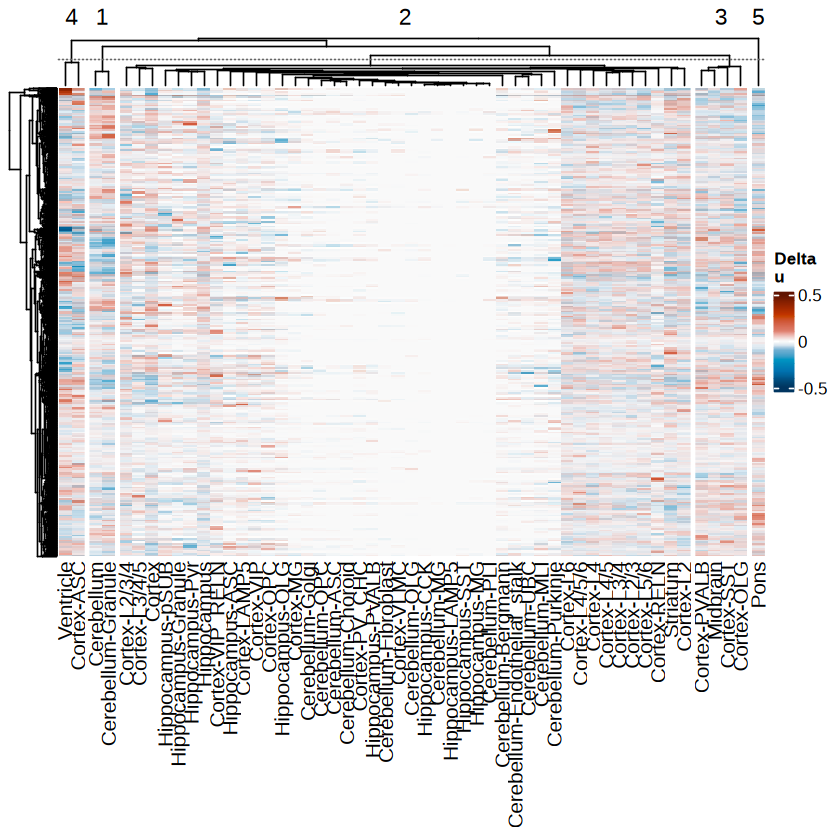

In [31]:
# isosigi = isosigls$subcortical
# #isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "relative",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]
library(circlize)
library(ComplexHeatmap)
isosigi = isosigls$subcortical
#isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx1 = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]

isosigi = transt[transt$transcript_id %in% rownames(isosigf.mx1),]
isosigi = isosigi[!is.na(isosigi$dr),]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx2 = as.data.frame(isosigf.mx)
dim(isosigf.mx2)
dim(isosigf.mx1)
isosigf.mx = cbind(isosigf.mx1[rownames(isosigf.mx2),],isosigf.mx2)
subcor.pr = cor(isosigf.mx)
# subcor.pr[subcor.pr == 1] = NA
library(pheatmap)
library(ComplexHeatmap)
#pdf("result/figure_revision/crossregion_subclass_isoform_heatmap_hubisoform_25_10_28.pdf",width = 8,height = 8)
col_fun = colorRamp2(c(-0.5, -0.1, 0, 0.1, 0.5), hcl_palette = "RdBu",reverse = T)
pht = Heatmap(isosigf.mx,show_row_names = FALSE,column_km = 5,name = "Delta\nu",col = col_fun)
pht
#dev.off()
#cor(isosigf.mx)
# unique(transt$areatr)
# colnames(isosigf.mx)

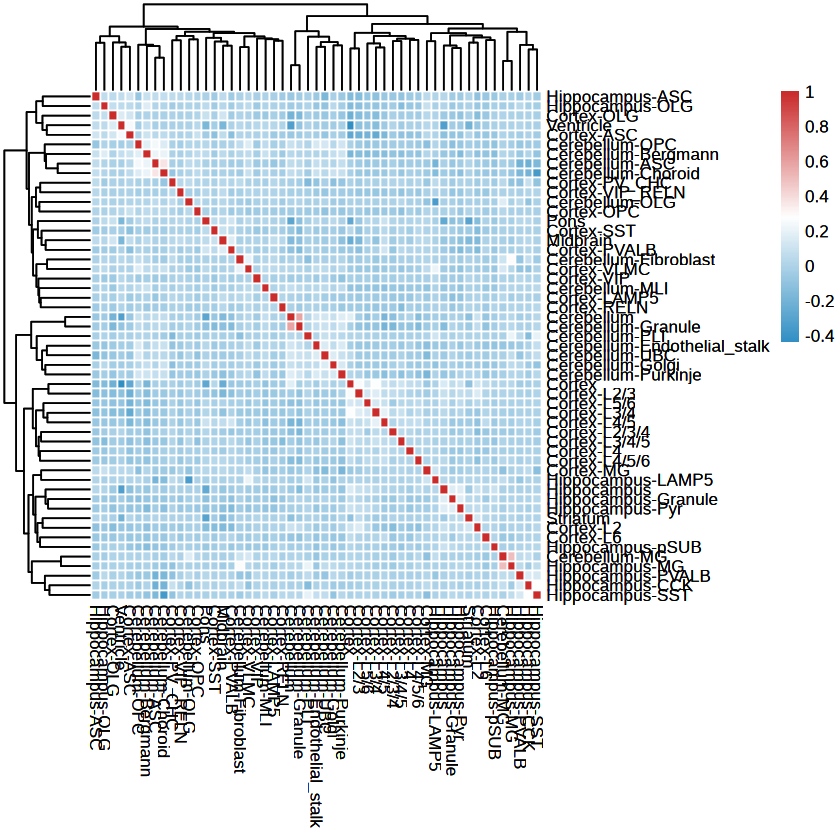

In [32]:
pht1 = pheatmap(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white")
pht1
#ggexport(pht1,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_25_10_28.pdf",width = 8,height = 7)


[1] 122

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/crossregion_class_isoform_heatmap_correlation_25_11_05.pdf



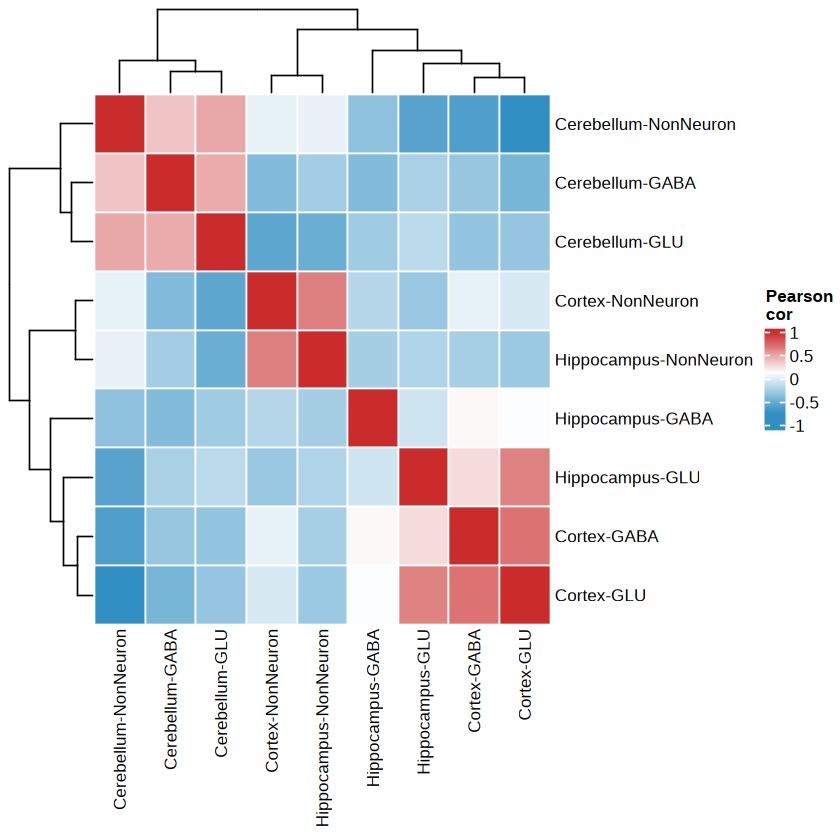

In [241]:
# fsraw.cor.sub = fsraw.cor.sub[fsraw.cor.sub$subclass != "",]
# fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
# fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",
#                               fsraw.cor.sub$class)
# transt.cc = FullLengthTranSt(fsraw.cor.sub,20)
# qsave(transt.cc,file = "data/cross_region/transt_subcortical_cell_class_level_25_10_28.qs")
# isosig.cc = CalSigIsoform(transt.cc)


library(circlize)
hubtrans = unique(isosig.cc[isosig.cc$sig != "N",]$transcript_id)
isosigi = transt.cc[transt.cc$transcript_id %in% hubtrans,] %>% 
                    group_by(areatr,gene_id) %>% filter(genecount > 20)
#isosigi = transt.cc %>% group_by(areatr,gene_id) %>% filter(genecount > 20)
#isosigi = isosigi[isosigi$count > 10,]
isosigi = isosigi[!is.na(isosigi$dr),]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > ncol(isosigf.mx)-1,]
nrow(isosigf.mx)
subcor.pr = cor(isosigf.mx)
library(ComplexHeatmap)
col_fun = colorRamp2(c(-0.5, -0.1, 0, 0.1, 0.5), hcl_palette = "RdBu",reverse = T)
pht = Heatmap(isosigf.mx,show_row_names = FALSE,column_km = 5,name = "Delta\nu",col = col_fun)
pht
pht1 = pheatmap(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white")
pht1
ggexport(pht1,filename = "result/figure_revision/crossregion_class_isoform_heatmap_correlation_25_11_05.pdf",width = 5.7,height = 5)


In [ ]:
isosig.cc

[1] 2647

[1] 106

Warning message:
"The input is a data frame-like object, convert it to a matrix."
Warning message:
"package 'rstatix' was built under R version 4.3.3"

Attaching package: 'rstatix'


The following object is masked from 'package:AnnotationDbi':

    select


The following object is masked from 'package:IRanges':

    desc


The following object is masked from 'package:stats':

    filter




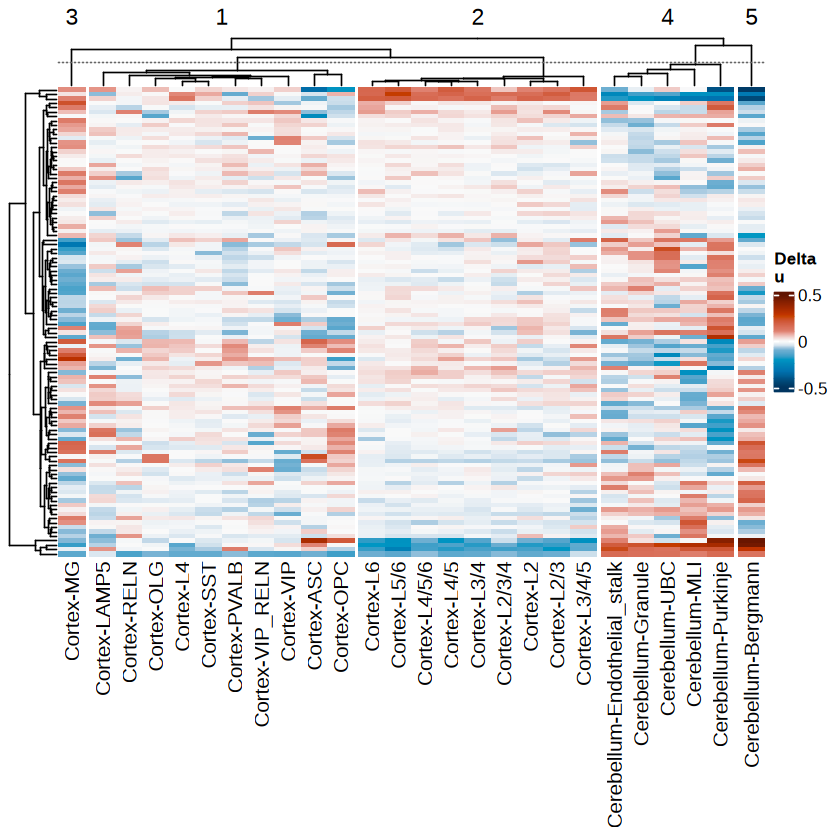

file saved to result/figure_revision/crossregion_subclass_isoform_heatmap_detailed_cerrebellum_25_10_22.pdf



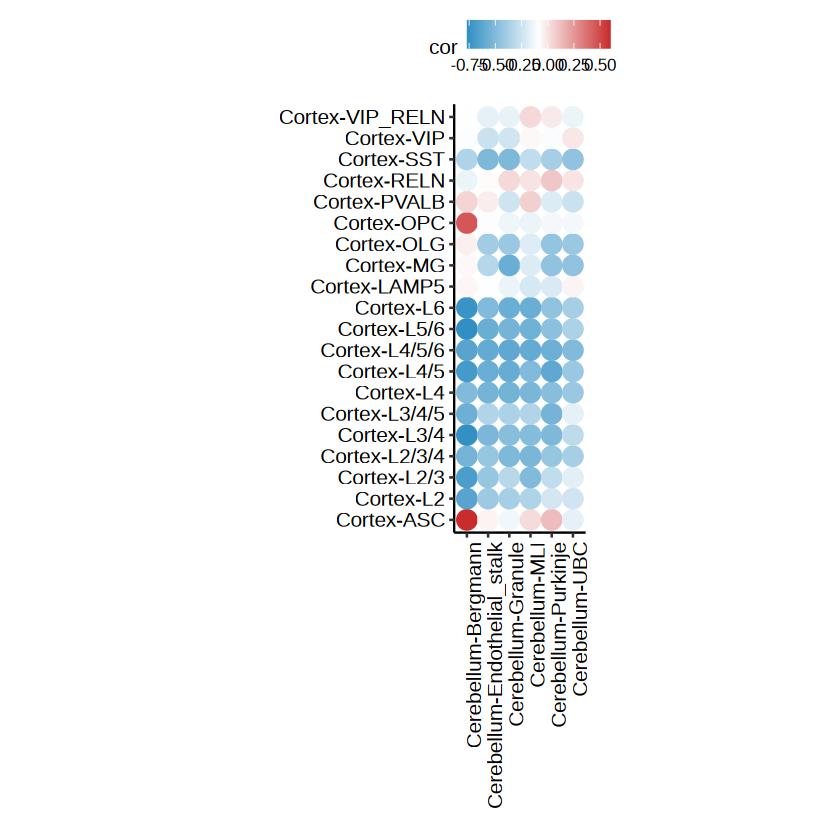

In [40]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt[transt$transcript_id %in% hubtrans,] %>% 
                    group_by(areatr,gene_id) %>% filter(genecount > 10)
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Cerebellum"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
nrow(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
nrow(isosigf.mx)
col_fun = colorRamp2(c(-0.5, -0.1, 0, 0.1, 0.5), hcl_palette = "RdBu",reverse = T)
pht = Heatmap(isosigf.mx,show_row_names = FALSE,column_km = 5,name = "Delta\nu",col = col_fun)
pht

library(rstatix)
subcor.prp = cor_test(isosigf.mx)
#subcor.prp
# subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Cerebellum") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
pht2 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht2
ggexport(pht,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_detailed_cerrebellum_25_10_22.pdf",
        width = 5,height = 8)
# ggexport(pht2,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_cerrebellum_25_10_22.pdf",
#         width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")

[1] 2647

[1] 166

file saved to result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf



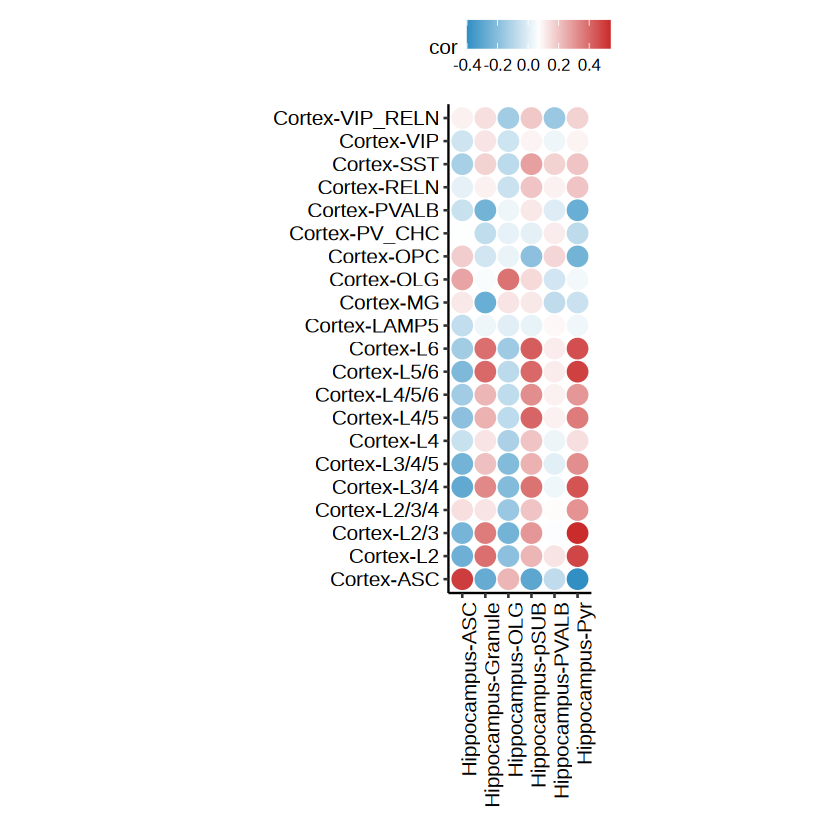

In [385]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt[transt$transcript_id %in% hubtrans,] %>% 
                    group_by(areatr,gene_id) %>% filter(genecount > 10)
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
nrow(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
nrow(isosigf.mx)
library(rstatix)
subcor.prp = cor_test(isosigf.mx)
#subcor.prp
# subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht3
ggexport(pht3,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf",
        width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")

### MGE and CGE-derived cell compare

[1] 38

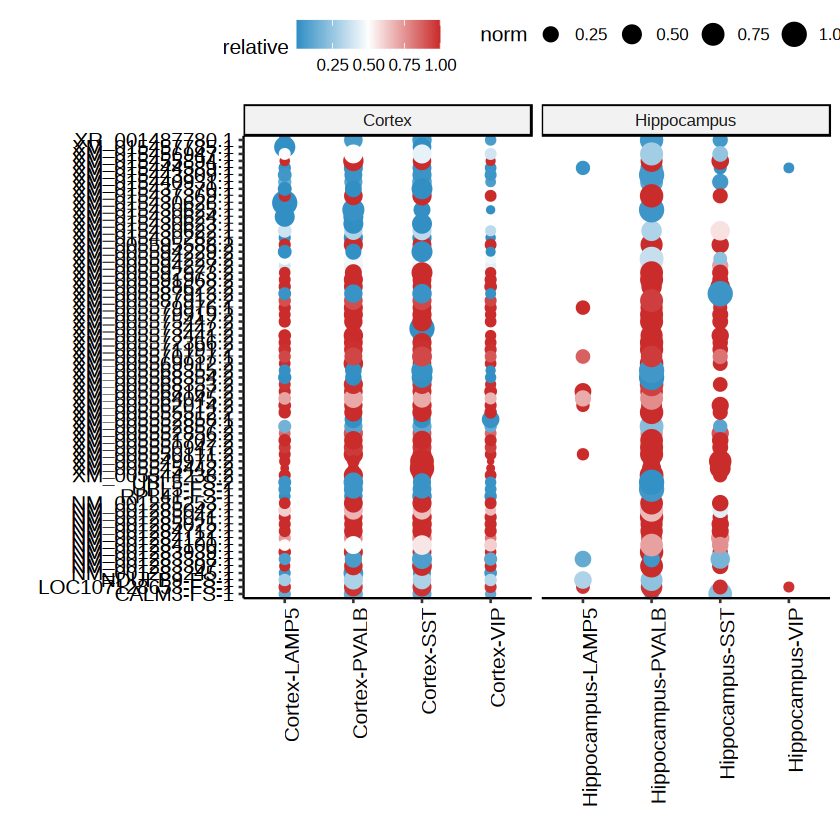

In [11]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt %>% group_by(areatr,gene_id) %>% filter(genecount > 20)

#isosigi = transt
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("LAMP5","PVALB","VIP","SST"),]
isosigi = isosigi %>% group_by(gene_id) %>% filter(length(unique(areatr)) > 5)
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 50)
length(unique(isosigi$gene_id))
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi = isosigi %>% group_by(subcortical,gene_id,transcript_id) %>% mutate(norm = count/sum(count))
pt = ggplot(isosigi,aes(x = areatr,y = transcript_id,color = relative,size = norm)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt

# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# nrow(isosigf.mx)
# isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
# nrow(isosigf.mx)
# library(rstatix)
# subcor.prp = cor_test(isosigf.mx)
# #subcor.prp
# # subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# # subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

# subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
#                       (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
# pht4 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
#                     scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
#                     theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
#pht4
# ggexport(pht3,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf",
#         width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")


In [238]:
isosigpv = isosigls$subclass
isosigpv = isosigpv[isosigpv$sig != "N",]
isosigpv = isosigpv %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("PVALB")) > 0 & length(unique(areatr)) < 5)
nrow(isosigpv)
hubtrans = unique(isosigpv$transcript_id)
length(hubtrans)

[1] 489

[1] 188

In [252]:
ngscount.hp = read.csv("data/cross_region/total_genecount_df_hippocampus.csv")
head(ngscount.hp)

,gene_id,cell_label,count,x,y
,<chr>,<int>,<int>,<dbl>,<dbl>
1,A2M,23,2,35514.00,80727.00
2,A2M,2005,4,31049.67,80426.67
3,A2M,4076,2,31993.00,82718.00
4,A2M,8465,2,18525.00,74764.00
5,A2M,11034,1,26034.00,78404.00
6,A2M,11678,1,19582.00,74038.00


In [254]:
filcell = unique(ngscount.hp[ngscount.hp$gene_id == "PVALB",]$cell_label)
length(filcell)
filcell2 =.
.unique(fsraw.cor.sub[fsraw.cor.sub$areatr == "Hippocampus-PVALB",]$cell_id)
length(intersect(filcell,filcell2)) 

[1] 582

[1] 66

In [250]:
cellan = unique(fsraw.cor.sub[,c("subcortical","subclass","cell_id")])

In [251]:
#fsraw.cor.sub$subclass2 = fsraw.cor.sub$subclass
cellan$areatr = paste0(cellan$subcortical,"-",cellan$subclass)
table(cellan$areatr)
filcell = fsraw.cor.sub[fsraw.cor.sub$areatr == "Hippocampus-PVALB",]
filcell = unique(filcell[filcell$gene_id == "PVALB",]$cell_id)
length(filcell)
#fsraw.cor.sub = fsraw.cor.sub[fsraw.cor.sub$areatr != "Hippocampus-PVALB" | fsraw.cor.sub$cell_id %in% filcell,]


              Cerebellum-ASC          Cerebellum-Bergmann 
                        1112                         2123 
          Cerebellum-Choroid Cerebellum-Endothelial_stalk 
                         839                         2262 
       Cerebellum-Fibroblast             Cerebellum-Golgi 
                         872                          887 
          Cerebellum-Granule                Cerebellum-MG 
                       22713                          479 
              Cerebellum-MLI               Cerebellum-OLG 
                        3115                          554 
              Cerebellum-OPC               Cerebellum-PLI 
                        1215                          284 
         Cerebellum-Purkinje               Cerebellum-UBC 
                         768                         1579 
                  Cortex-ASC                    Cortex-EC 
                       27040                          106 
                   Cortex-L2                  Cortex-L2

[1] 23

In [9]:
transt = fsraw.cor.sub %>% group_by(areatr) %>% 
        mutate(cellnumt = length(unique(cell_id))) %>%
        group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),cellnum = length(unique(cell_id)),
                 cellprop = cellnum/cellnumt[1])
transt = transt[transt$areatr != "" & !is.na(transt$areatr),]
transt$relative = transt$count/transt$genecount
transt = transt %>% group_by(areatr) %>% mutate(norm = count/sum(count))
transt = transt %>% group_by(transcript_id) %>% 
          mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1))
transtf = transt %>% group_by(transcript_id) %>% 
           filter(length(unique(areatr)) > 1)
transtf = transtf %>% group_by(gene_id) %>% 
          filter(length(unique(transcript_id))>1)
transtf$dr = transtf$relative - transtf$otherrelative

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


[1] "Cortex-ASC"          "Cortex-L2"           "Cortex-L2/3"        
 [4] "Cortex-L2/3/4"       "Cortex-L3/4"         "Cortex-L3/4/5"      
 [7] "Cortex-L4"           "Cortex-L4/5"         "Cortex-L4/5/6"      
[10] "Cortex-L5/6"         "Cortex-L6"           "Cortex-OLG"         
[13] "Cortex-OPC"          "Cortex-PVALB"        "Cortex-RELN"        
[16] "Cortex-SST"          "Cortex-VIP_RELN"     "Hippocampus-Pyr"    
[19] "Hippocampus-pSUB"    "Cortex-LAMP5"        "Hippocampus-ASC"    
[22] "Hippocampus-Granule" "Hippocampus-OLG"     "Cortex-VIP"         
[25] "Cortex-MG"           "Cortex-PV_CHC"       "Hippocampus-CCK"    
[28] "Hippocampus-PVALB"   "Cortex-VLMC"         "Hippocampus-MG"     
[31] "Hippocampus-SST"

[1] 21

[1] 21 24

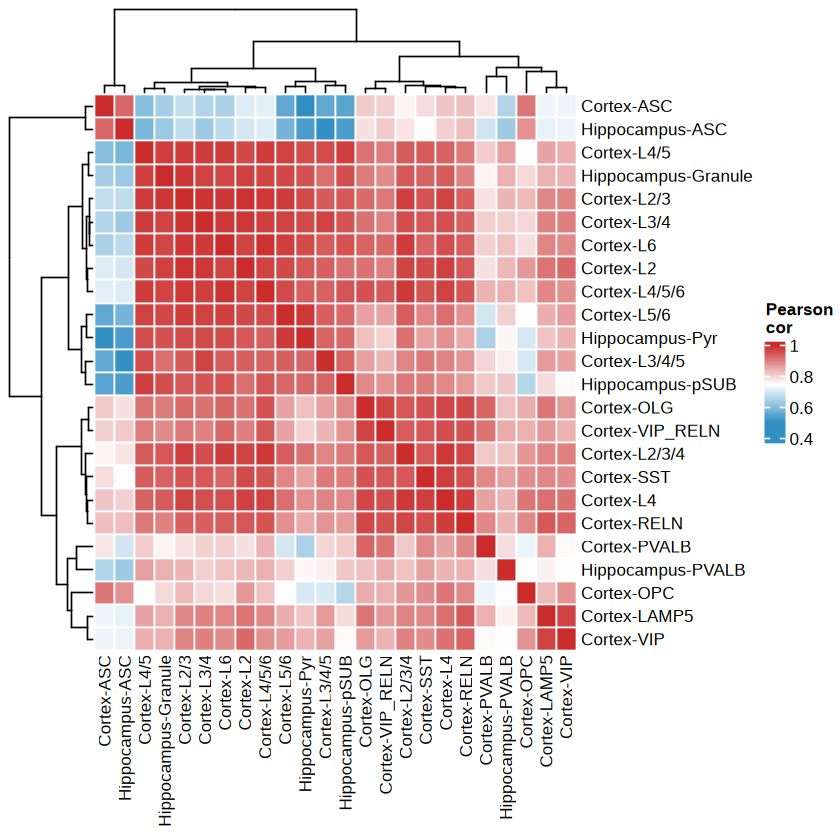

In [114]:
library(circlize)
hubgene = c('SNAP25','SLC17A7','GAD1','CHN1','PVALB','ERBB4','SST','GRIK1','LAMP5','SGCZ','CXCL14','CCK','RELN','ADARB2',
            'VIP','SOX6','PTPRZ1',
             'NELL2','PPFIA2','PROX1','NPY1R',
             'MBP','PLP1','SLC1A3','SLC1A2','APOE','LCAT',
             'KCND2','KCNIP4',
             'ZIC1','CHGB','KLHL1','VCAN',
             'CLDN5','CBLN1','EOMES',
             'TTR','LGI2','GRID2','PCP4','NEFM',
             'CD74','CSF1R','A2M','ATP10A','CGNL1','PTGDS','OGN','GFAP')
isosig.ref = isosigls$subclass
#isosig.ref = isosig.sc
hubtrans = unique(isosig.ref[isosig.ref$sig != "N" & 
                            isosig.ref$areatr %in% c(
                                                     "PV_CHC","PVALB"
                            ),]$transcript_id)
#hubtrans = unique(isosig.ref[isosig.ref$sig != "N",]$transcript_id)
# hubtrans = unique(isosig.ref[isosig.ref$sig != "N" & 
#                             isosig.ref$areatr %in% c(
#                                                      "Cortex-PV_CHC","Cortex-PVALB"
#                                                     #"Hippocampus-PVALB"
#                                                      #"Cortex-SST","Hippocampus-SST"
#                                                      #"Cortex-LAMP5","Cortex-VIP"
#                             ),]$transcript_id)
#length(unique(hubtrans))
isosigi = transtf[transtf$transcript_id %in% hubtrans,]
#isosigi = transt
#isosigi = transtf
#length(unique(isosigi$transcript_id))

#transt
#isosigi = transt %>% group_by(areatr,gene_id) %>% filter(length(unique(transcript_id))>1)
isosigi = isosigi %>% group_by(areatr,transcript_id) %>% filter(genecount > 10)
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Hippocampus","Cortex"),]
#isosigi = isosigi[!is.na(isosigi$dr),]
#isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("PVALB","LAMP5","VIP","SST","PV_CHC"),]
unique(isosigi$areatr)
# isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex") | 
#                   isosigi$areatr %in% c("Hippocampus-PVALB","Hippocampus-SST","Hippocampus-VIP"),]
# isosigi = isosigi[isosigi$areatr %in% c("Hippocampus-PVALB","Hippocampus-SST","Hippocampus-LAMP5",
#                                        "Cortex-PVALB","Cortex-SST","Cortex-LAMP5","Cortex-VIP"),]
              # isosigi$areatr %in% c("Hippocampus-PVALB"),]
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
#isosigi$subclass = MySplit(isosigi$areatr,"-",2)
#length(unique(isosigi$transcript_id))
isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Hippocampus-PVALB")) > 0)
length(unique(isosigi$transcript_id))
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Cortex-PVALB","Hippocampus-PVALB")) > 1 | 
#                                                         sum(areatr %in% c("Cortex-SST","Hippocampus-SST")) > 1)
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Hippocampus-PVALB",
#                                                                            "Hippocampus-LAMP5",
#                                                                            "Hippocampus-VIP",
#                                                                           "Hippocampus-SST")) > 3)
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% 
#                                                              c("Hippocampus-PVALB")) > 0)
#length(unique(isosigi$transcript_id))
#isosigi
isosigi$transcript_id = paste0(isosigi$gene_id,"-",isosigi$transcript_id)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "relative",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
#nrow(isosigf.mx)
isosigf.mx = isosigf.mx[ ,colSums(isosigf.mx != 0) >  20]
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
dim(isosigf.mx)
#nrow(isosigf.mx)
# library(rstatix)
# subcor.prp = cor_test(isosigf.mx)
# subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
#                       (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
#subcor.prp = subcor.prp[subcor.prp$cor > 0.9,]
# pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
#                     scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
#                     theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
# pht3
library(ComplexHeatmap)
# pht = Heatmap(cor(isosigf.mx))
# pht
pht1 = pheatmap(cor(isosigf.mx),color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white",clustering_method = "ward.D2")
pht1
ggexport(pht1,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_PVALB_25_11_17.pdf",width = 8,height = 7)


Warning message:
"The input is a data frame-like object, convert it to a matrix."


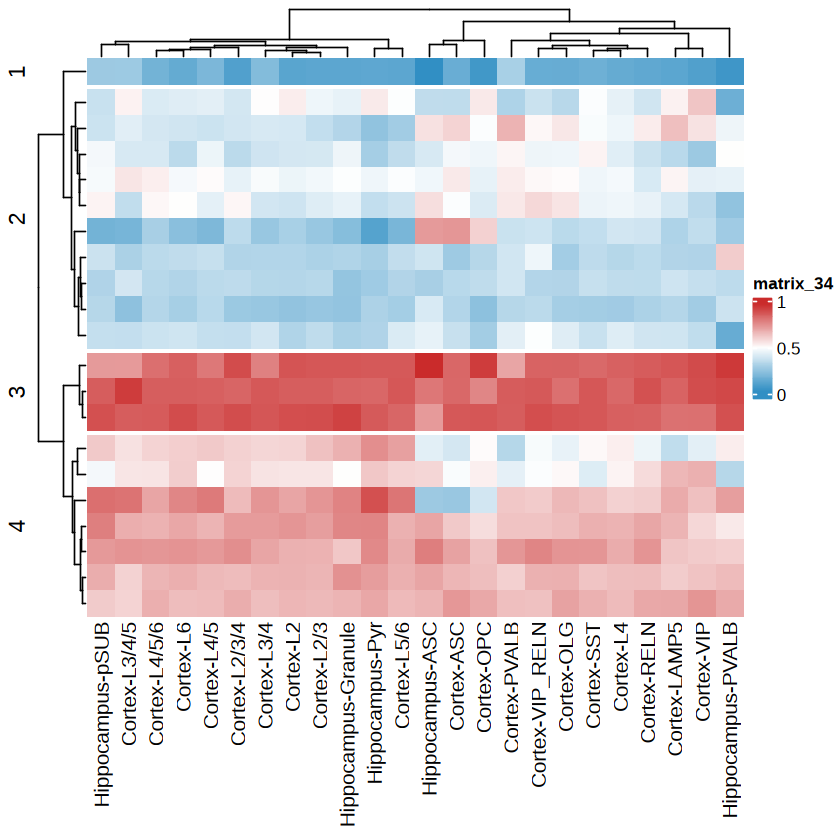

In [120]:
pht = Heatmap(isosigf.mx,row_split = 4,col = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
              clustering_method_columns = "ward.D2",
              #column_split = 3,
              show_row_names = F)
pht

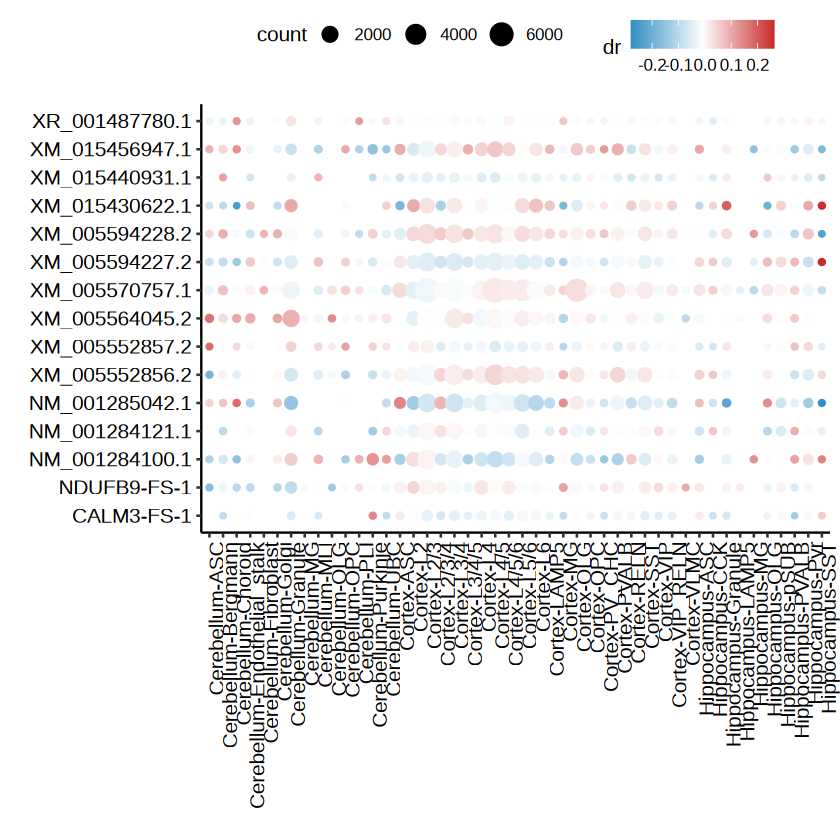

In [51]:
# isosigi.case = transt[transt$transcript_id %in% isosigi$transcript_id,]
# isosigi.case = isosigi.case %>% group_by(areatr,gene_id) %>% filter(genecount > 20)
pt = ggplot(isosigi.case,aes(x = areatr,y = transcript_id,color = dr,size = count)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    #facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt

In [220]:
isosig.sc = CalSigIsoform(transt)

Warning message:
"There were 5733 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 5732 remaining warnings."


In [50]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt[transt$transcript_id %in% hubtrans,]
isosigi = transt %>% group_by(areatr,gene_id) %>% filter(genecount > 20)
isosigi = isosigi[!is.na(isosigi$dr),]
#isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]

              # isosigi$areatr %in% c("Hippocampus-PVALB"),]
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
#isosigi$subclass = MySplit(isosigi$areatr,"-",2)
length(unique(isosigi$transcript_id))
length(unique(isosigi$transcript_id))
#isosigi
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
#nrow(isosigf.mx)
#isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
#nrow(isosigf.mx)
library(rstatix)
subcor.prp = cor_test(isosigf.mx)
subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
#subcor.prp = subcor.prp[subcor.prp$cor > 0.9,]
pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht3
library(ComplexHeatmap)
# pht = Heatmap(cor(isosigf.mx))
# pht
pht1 = pheatmap(cor(isosigf.mx),color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white")
pht1
ggexport(pht1,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_PVALB_25_10_28.pdf",width = 8,height = 7)


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
CALM3,CALM3-FS-1,Cortex-LAMP5,21,164,0.12804878,0.1603449,0.1611523,-0.0331035476
CALM3,CALM3-FS-1,Cortex-PVALB,105,769,0.13654096,0.1603449,0.1609400,-0.0243990613
CALM3,CALM3-FS-1,Cortex-SST,103,874,0.11784897,0.1603449,0.1614073,-0.0435583531
CALM3,CALM3-FS-1,Cortex-VIP,14,123,0.11382114,0.1603449,0.1615080,-0.0476868810
CALM3,CALM3-FS-1,Hippocampus-PVALB,1,31,0.03225806,0.1603449,0.1635471,-0.1312890315
CALM3,CALM3-FS-1,Hippocampus-SST,5,23,0.21739130,0.1603449,0.1589188,0.0584725393
CALM3,NM_001284121.1,Cortex-LAMP5,120,164,0.73170732,0.7788507,0.7798755,-0.0481682152
CALM3,NM_001284121.1,Cortex-PVALB,594,769,0.77243173,0.7788507,0.7789902,-0.0065584895
CALM3,NM_001284121.1,Cortex-SST,680,874,0.77803204,0.7788507,0.7788685,-0.0008364366


#### combined PVALB and SST, LAMP5 and VIP

In [159]:
unique(fsraw.cor.sub[,c("class","subclass")])

class,subclass
<chr>,<chr>
GLU,L2/3
GABA,SST
GLU,L3/4
GLU,L4
NonNeuron,ASC
GABA,VIP_RELN
GABA,VIP
GLU,L4/5
NonNeuron,OLG


In [160]:
#fsraw.cor.hub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Cortex","Hippocampus"),]
fsraw.cor.sub$subclass2 = fsraw.cor.sub$subclass
fsraw.cor.sub[fsraw.cor.sub$subclass2 %in% c("PVALB","SST","PV_CHC"),]$subclass2 = "MGE"
fsraw.cor.sub[fsraw.cor.sub$subclass2 %in% c("LAMP5","VIP","VIP_RELN"),]$subclass2 = "CGE"
fsraw.cor.sub[fsraw.cor.sub$class %in% c("GLU","Glu"),]$subclass2 = "GLU"
#fsraw.cor.hub[fsraw.cor.hub$areatr %in% c("PVALB","SST","LAMP5","VIP"),]$areatr = "GE"
### 
#fsraw.cor.hub$subclass2 = fsraw.cor.hub$areatr
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass2)
transt.ge = fsraw.cor.sub %>% group_by(areatr) %>% 
        mutate(cellnumt = length(unique(cell_id))) %>%
        group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),cellnum = length(unique(cell_id)),
                 cellprop = cellnum/cellnumt[1])
transt.ge = transt.ge[transt.ge$areatr != "" & !is.na(transt.ge$areatr),]
transt.ge$relative = transt.ge$count/transt.ge$genecount
transt.ge = transt.ge %>% group_by(areatr) %>% mutate(norm = count/sum(count))

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


[1] 18456

[1] 399

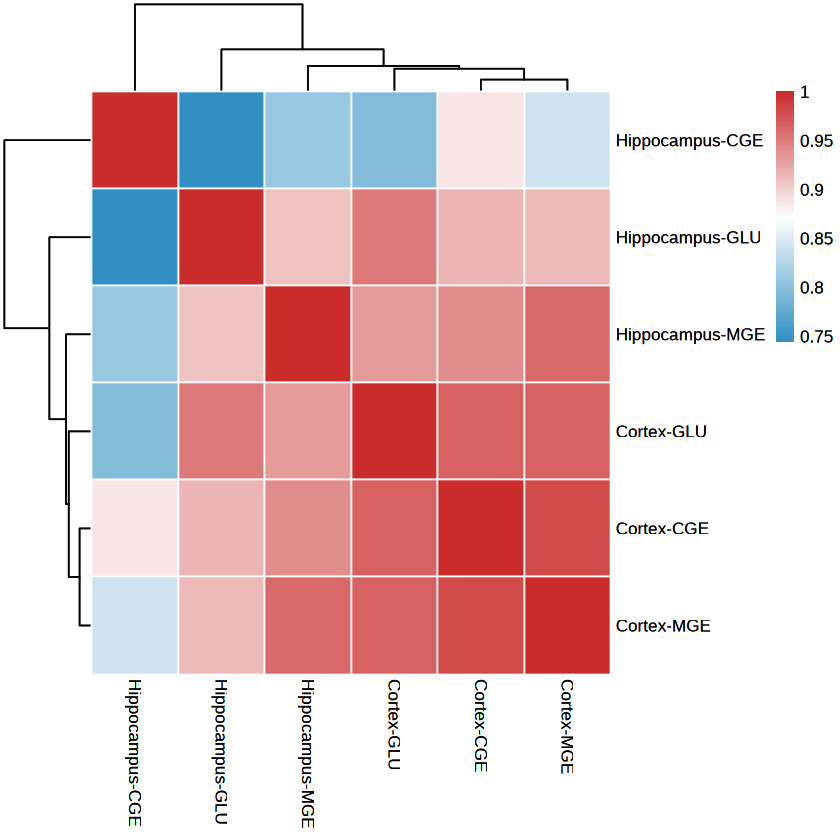

In [167]:
library(circlize)
hubgene = c('SNAP25','SLC17A7','GAD1','CHN1','PVALB','ERBB4','SST','GRIK1','LAMP5','SGCZ','CXCL14','CCK','RELN','ADARB2',
            'VIP','SOX6','PTPRZ1',
             'NELL2','PPFIA2','PROX1','NPY1R',
             'MBP','PLP1','SLC1A3','SLC1A2','APOE','LCAT',
             'KCND2','KCNIP4',
             'ZIC1','CHGB','KLHL1','VCAN',
             #'CSPG4','OLIG2','PDGFRA','FLT1', 
             'CLDN5','CBLN1','EOMES',
             'TTR','LGI2','GRID2','PCP4','NEFM',
             'CD74','CSF1R','A2M','ATP10A','CGNL1','PTGDS','OGN','GFAP')

# hubtrans = unique(isosig.sc[isosig.sc$sig != "N" & isosig.sc$areatr %in% c("Hippocampus-SST",
#                                                                           "Hippocampus-PVALB","Hippocampus-LAMP5"),]$transcript_id)
isosigi = transt.ge[transt.ge$gene_id %in% hubgene,]
#isosigi = transt.ge[transt.ge$transcript_id %in% hubtrans,]
#length(unique(isosigi$transcript_id))

#transt
#isosigi = transt.ge[transt.ge$gene_id %in% hubgene,]
isosigi = transt.ge %>% group_by(areatr,transcript_id) %>% filter(count > 20)
#isosigi = isosigi[!is.na(isosigi$dr),]

#isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("CGE","MGE") | MySplit(isosigi$areatr,"-",1) %in% c("Cortex"),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("CGE","MGE","GLU"),]
length(unique(isosigi$transcript_id))
isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Cortex-CGE","Hippocampus-CGE")) > 1 |
                                                        sum(areatr %in% c("Cortex-MGE","Hippocampus-MGE")) > 1)
# isosigi = isosigi %>% group_by(transcript_id) %>% 
#     filter(sum(areatr %in% c("Cortex-MGE","Hippocampus-MGE")) > 1 )

length(unique(isosigi$transcript_id))
#isosigi
isosigi$transcript_id = paste0(isosigi$gene_id,"-",isosigi$transcript_id)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "cellprop",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)

library(ComplexHeatmap)
pht1 = pheatmap(cor(isosigf.mx),color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white")
pht1
#ggexport(pht1,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_PVALB_25_10_28.pdf",width = 8,height = 7)


Warning message:
"The input is a data frame-like object, convert it to a matrix."
The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.



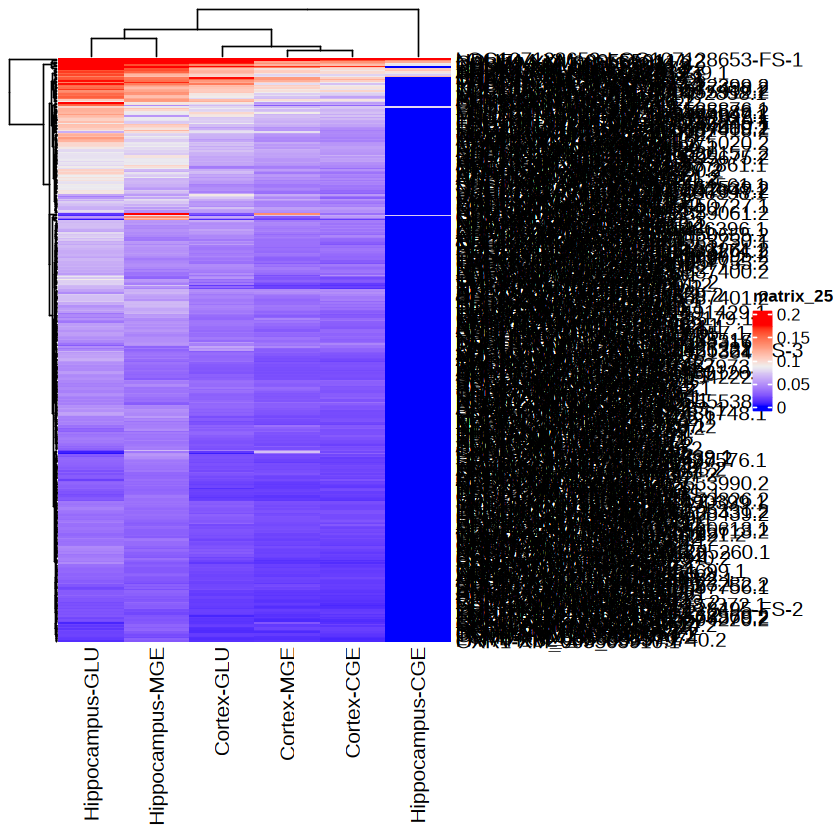

In [168]:
pht = Heatmap(isosigf.mx)
pht
#isosigf.mx

[1] 20047

[1] 723

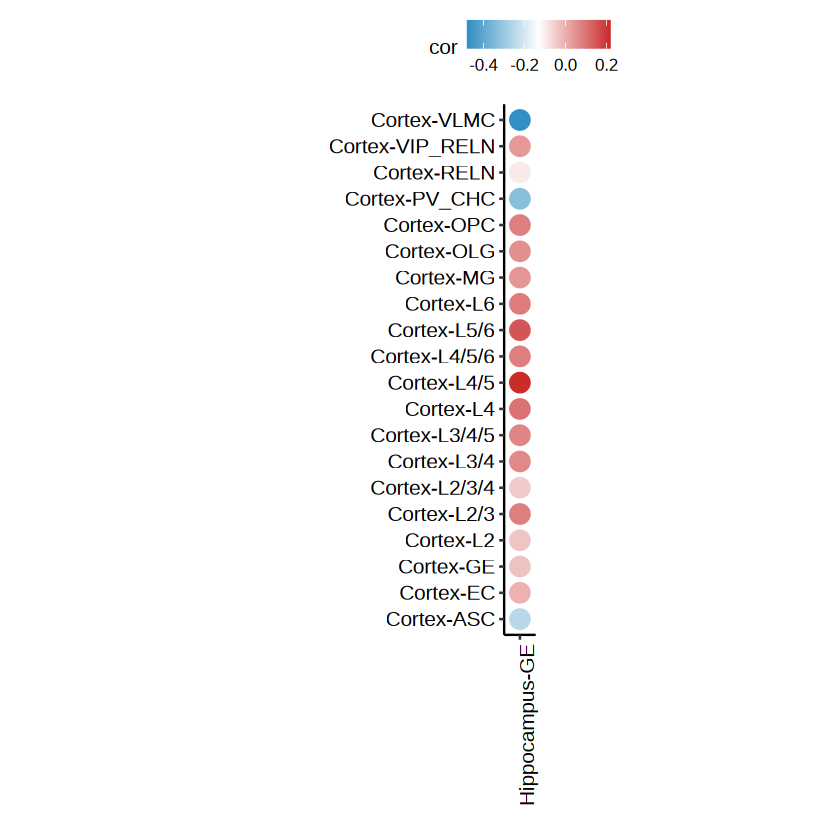

In [507]:
library(circlize)
isosigi = transt.ge %>% group_by(areatr,gene_id) %>% filter(genecount > 10,length(unique(transcript_id))> 1)
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
#isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("MGE"),]
isosigi = isosigi[isosigi$areatr %in% c("Hippocampus-GE") | MySplit(isosigi$areatr,"-",1) %in% c("Cortex"),]
#isosigi = isosigi[isosigi$areatr %in% c("Hippocampus-MGE","Cortex-MGE","Cortex-CGE","Hippocampus-CGE"),]
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
#isosigi$subclass = MySplit(isosigi$areatr,"-",2)
length(unique(isosigi$transcript_id))
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% 
#                                                              c("Hippocampus-LAMP5","Hippocampus-PVALB",
#                                                                "Hippocampus-VIP","Hippocampus-SST")) > 1)
isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Hippocampus-GE")) > 0)
length(unique(isosigi$transcript_id))
# isosigi = transt.ge[transt.ge$transcript_id %in% isosigi$transcript_id,]
# isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
#isosigi
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
#nrow(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 2),]
#nrow(isosigf.mx)
library(rstatix)
subcor.prp = cor_test(isosigf.mx)
#subcor.prp
subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
#subcor.prp
#subcor.prp = subcor.prp[subcor.prp$cor > 0.9,]
pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht3

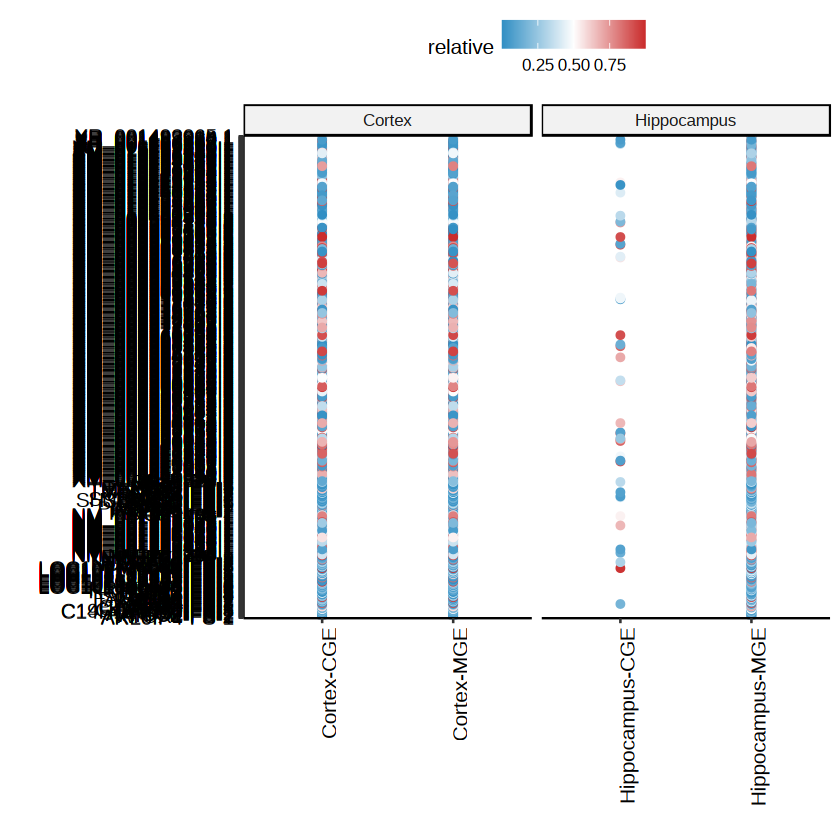

In [398]:
isosig.case = isosigi
isosig.case$subcortical = MySplit(isosig.case$areatr,"-",1)
pt = ggplot(isosig.case,aes(x = areatr,y = transcript_id,color = relative)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt

In [501]:
#isosig.ge = CalSigIsoform(transt.ge)
id1 = isosig.ge[isosig.ge$count > 10 & isosig.ge$areatr == "Hippocampus-GE" & isosig.ge$sig != "N",]$gene_id
id2 = isosig.ge[isosig.ge$count > 20 & isosig.ge$areatr == "Cortex-GE" & isosig.ge$sig != "N",]$gene_id
#isosig.ge[isosig.ge$areatr == "Hippocampus-GE" & isosig.ge$sig != "N",]
intersect(id1,id2)

[1] "RPL10"

In [331]:
caseg = c("YWHAH","RTN1","TUSC3","RPL10")
isosig.sc[isosig.sc$gene_id %in% caseg & isosig.sc$areatr %in% c("Cortex-PVALB","Hippocampus-PVALB","Hippocampus-LAMP5",
                                                                  "Cortex-LAMP5"),]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
35876,GSTP1,GSTP1-FS-1,Cortex-LAMP5,140,158,0.88607595,0.89549826,0.89575999,-0.009684043,N,3.347301e-05,2.726489e-04
35880,GSTP1,GSTP1-FS-1,Cortex-PVALB,584,658,0.88753799,0.89549826,0.89571938,-0.008181386,N,3.347301e-05,2.726489e-04
35889,GSTP1,GSTP1-FS-1,Hippocampus-PVALB,29,29,1.00000000,0.89549826,0.89259544,0.107404565,Up,3.347301e-05,2.726489e-04
35912,GSTP1,NM_001289964.1,Cortex-LAMP5,15,158,0.09493671,0.08676886,0.08652863,0.008408078,N,3.347301e-05,2.726489e-04
35916,GSTP1,NM_001289964.1,Cortex-PVALB,60,658,0.09118541,0.08676886,0.08663896,0.004546447,N,3.347301e-05,2.726489e-04
84559,RTN1,XM_005561388.2,Cortex-LAMP5,197,279,0.70609319,0.73039376,0.73106877,-0.024975582,N,2.828442e-24,2.212666e-22
84563,RTN1,XM_005561388.2,Cortex-PVALB,995,1335,0.74531835,0.73039376,0.72997918,0.015339167,N,2.828442e-24,2.212666e-22
84572,RTN1,XM_005561388.2,Hippocampus-PVALB,43,49,0.87755102,0.73039376,0.72630605,0.151244965,Up,2.828442e-24,2.212666e-22
84596,RTN1,XM_005561389.2,Cortex-LAMP5,81,279,0.29032258,0.26948587,0.26890707,0.021415511,N,2.828442e-24,2.212666e-22


[1] 17139

[1] 78

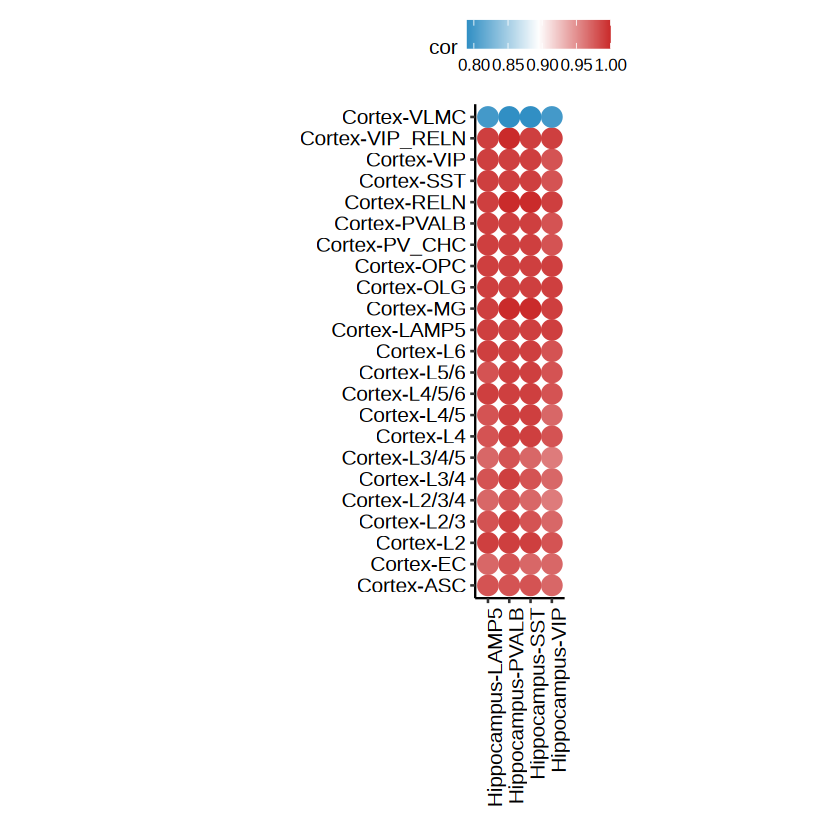

In [299]:
library(circlize)
#hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
# isosigi = transt %>% 
#                     group_by(areatr,gene_id) %>% filter(genecount > 10)
isosigi = unique(transt[,c("gene_id","genecount","areatr")])
#isosigi = transt[transt$transcript_id %in% hubtrans,] 
#%>% 
                    #group_by(areatr,gene_id) %>% filter(genecount > 10)
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex") | 
                  isosigi$areatr %in% c("Hippocampus-LAMP5","Hippocampus-PVALB","Hippocampus-VIP","Hippocampus-SST"),]
#                isosigi$areatr %in% c("Hippocampus-PVALB"),]

#isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 50)
isosigf.mx = dcast(isosigi,gene_id~areatr,value.var = "genecount",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$gene_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
nrow(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx > 1) > (ncol(isosigf.mx) - 1),]
nrow(isosigf.mx)
library(rstatix)
subcor.prp = cor_test(isosigf.mx)
#subcor.prp
# subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht3
# ggexport(pht3,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf",
#         width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")

## Region isoform shift DTU diger

In [3]:
#sp cases plot
pref = qread("../ref/area_figure_an.qs")
subcoran = unique(fsraw.cor[,c("region","subcortical")])
edgesdf = pref$areaedges
edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
library(randomcoloR)
mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
names(mycolor) = unique(edgesdf$subcortical)

SpCasePlot = function(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    # hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]

    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      theme_void() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()  + ggtitle(geneex)
    return(pmkpti1)
}



ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': object 'fsraw.cor' not found


In [6]:
#shiftgcl
shiftgcl = read.csv(file = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.csv")
nrow(shiftgcl)
shiftgcl[shiftgcl$cluster == "c4",]

[1] 375

,gene_id,cluster
,<chr>,<chr>
2,ACLY,c4
29,C15H9orf142,c4
37,C7H14orf119,c4
73,DDX19B,c4
88,ELMO1,c4
105,FBXO8,c4
107,FNDC4,c4
109,FRMD3,c4
137,KIAA1586,c4


In [7]:
table(shiftgcl$cluster)


c1 c2 c3 c4 c5 c6 c7 c8 
95 24 64 27 34 13 21 97 

In [106]:
isosigi2 = isosigls$subcortical
isosigi2[isosigi2$transcript_id == "XM_005563216.2",]
isosigi2.hub = isosigi2[isosigi2$gene_id %in% shiftgcl[shiftgcl$cluster == "c4",]$gene_id & isosigi2$sig != "N",]
isosigi2.hub = isosigi2[isosigi2$sig != "N",]
isosigi2.hub = isosigi2.hub[abs(isosigi2.hub$dr) > 0.2 & isosigi2.hub$areatr == "Midbrain",]
isosigi2.hub[order(-abs(isosigi2.hub$genecount)),]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
39233,SMIM19,XM_005563216.2,Cerebellum,196,467,0.4197002,0.4326814,0.4348449,-0.0151446646,N,2.433153e-06,1.290399e-05
39234,SMIM19,XM_005563216.2,Cortex,2822,6870,0.4107715,0.4326814,0.4363330,-0.0255615325,N,2.433153e-06,1.290399e-05
39235,SMIM19,XM_005563216.2,Hippocampus,126,251,0.5019920,0.4326814,0.4211296,0.0808624561,N,2.433153e-06,1.290399e-05
39236,SMIM19,XM_005563216.2,Midbrain,132,226,0.5840708,0.4326814,0.4074498,0.1766210148,Up,2.433153e-06,1.290399e-05
39237,SMIM19,XM_005563216.2,Pons,18,54,0.3333333,0.4326814,0.4492394,-0.1159060255,Down,2.433153e-06,1.290399e-05
39238,SMIM19,XM_005563216.2,Striatum,55,159,0.3459119,0.4326814,0.4471429,-0.1012309731,Down,2.433153e-06,1.290399e-05
39239,SMIM19,XM_005563216.2,Ventricle,42,97,0.4329897,0.4326814,0.4326300,0.0003597248,N,2.433153e-06,1.290399e-05


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
12998,FAM206A,FAM206A-FS-2,Midbrain,66,179,0.3687151,0.1650978,0.13116159,0.2375535,Up,6.703861e-12,7.159356e-11
13005,FAM206A,XM_005581115.2,Midbrain,102,179,0.5698324,0.7561717,0.78722822,-0.2173958,Down,6.703861e-12,7.159356e-11
48246,ZNF528,ZNF528-FS-1,Midbrain,99,155,0.6387097,0.4465261,0.41449547,0.2242142,Up,7.773401e-07,4.442920e-06
17239,IFT20,XM_005583208.2,Midbrain,57,118,0.4830508,0.6711311,0.70247783,-0.2194270,Down,6.041501e-18,9.651546e-17
22117,LOC102139028,XR_001491793.1,Midbrain,40,102,0.3921569,0.2219595,0.18791997,0.2042369,Up,9.117865e-10,7.676336e-09
31752,PLPP1,XM_005556904.2,Midbrain,31,87,0.3563218,0.1783171,0.14864959,0.2076722,Up,2.272767e-05,1.023008e-04
12864,FAM183A,XR_001485770.1,Midbrain,52,77,0.6753247,0.5135140,0.47306139,0.2022633,Up,9.513173e-38,3.310924e-36
6441,CDC42SE1,XM_005541942.2,Midbrain,33,69,0.4782609,0.2894353,0.25167025,0.2265906,Up,2.070238e-04,7.641845e-04
6447,CDC42SE1,XM_005541943.2,Midbrain,36,69,0.5217391,0.7105647,0.74832975,-0.2265906,Down,2.070238e-04,7.641845e-04


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


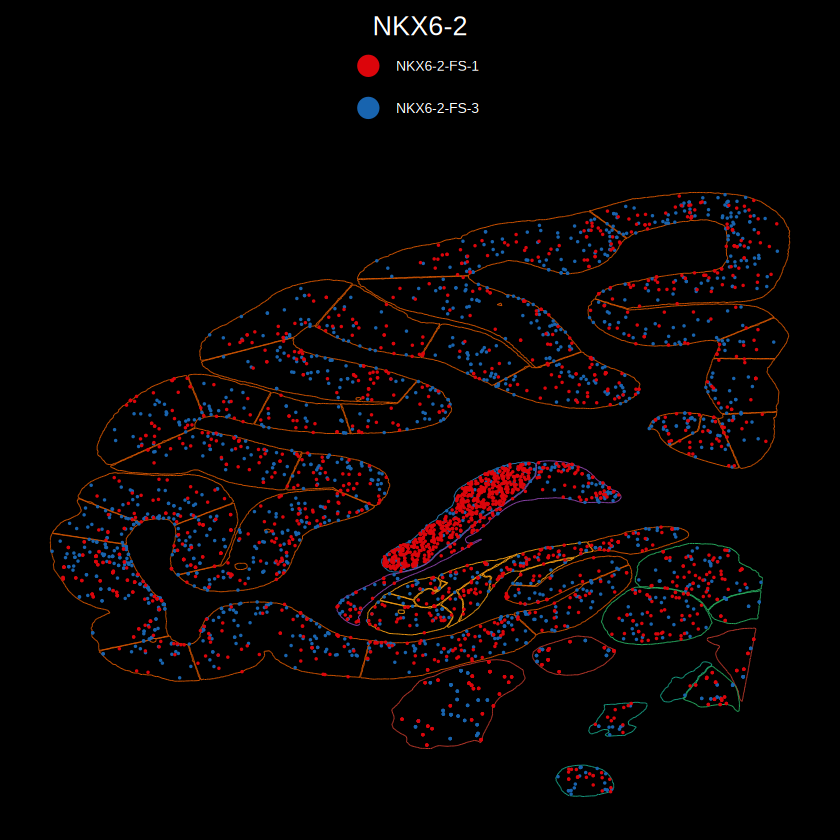

In [95]:
geneex = "NKX6-2"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
# fileid = paste0("result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_",geneex,"_24_05_02.pdf")
hubtrans = c("NKX6-2-FS-1","NKX6-2-FS-3")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,ptsize = 0.7,mycolor)
pci

In [15]:
isosigi2 = isosigls$subcortical
isosigi2[isosigi2$sig != "N" & isosigi2$gene_id == "IDH3B",]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
17119,IDH3B,XM_005568512.1,Cerebellum,389,591,0.6582064,0.4838930,0.4548407,0.2033657,Up,1.037199e-76,8.789136e-75
17120,IDH3B,XM_005568512.1,Cortex,4654,12399,0.3753529,0.4838930,0.5019830,-0.1266301,Down,1.037199e-76,8.789136e-75
17121,IDH3B,XM_005568512.1,Hippocampus,101,510,0.1980392,0.4838930,0.5315353,-0.3334961,Down,1.037199e-76,8.789136e-75
17123,IDH3B,XM_005568512.1,Pons,89,140,0.6357143,0.4838930,0.4585894,0.1771249,Up,1.037199e-76,8.789136e-75
17125,IDH3B,XM_005568512.1,Ventricle,98,158,0.6202532,0.4838930,0.4611663,0.1590869,Up,1.037199e-76,8.789136e-75
17126,IDH3B,XM_005568513.1,Cerebellum,181,591,0.3062606,0.4877848,0.5180389,-0.2117783,Down,1.037199e-76,8.789136e-75
17127,IDH3B,XM_005568513.1,Cortex,7318,12399,0.5902089,0.4877848,0.4707141,0.1194948,Up,1.037199e-76,8.789136e-75
17128,IDH3B,XM_005568513.1,Hippocampus,397,510,0.7784314,0.4877848,0.4393437,0.3390877,Up,1.037199e-76,8.789136e-75
17130,IDH3B,XM_005568513.1,Pons,49,140,0.3500000,0.4877848,0.5107489,-0.1607489,Down,1.037199e-76,8.789136e-75


In [12]:
unique(isosigi2$areatr)
c("Cortex","Hippocampus","Cerebellum","Midbrain","Pons","Striatum","Ventricle")

[1] "Midbrain"    "Striatum"    "Cortex"      "Ventricle"   "Hippocampus"
[6] "Cerebellum"  "Pons"

,areatr,gene_id,1,2,3,groupid,geneidn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Cerebellum,ARPP19,0.09631148,0.7254098,0.0000000,3,1
2,Cerebellum,ARPP21,0.40000000,0.1294118,0.1411765,3,3
3,Cerebellum,DDRGK1,0.30785340,0.6921466,0.0000000,3,2
4,Cerebellum,FXYD1,0.32934683,0.6540938,0.0000000,3,10
5,Cerebellum,IDH3B,0.65820643,0.3062606,0.0000000,3,7
6,Cerebellum,NKX6-2,0.28662420,0.2165605,0.0000000,3,9


file saved to result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08.pdf



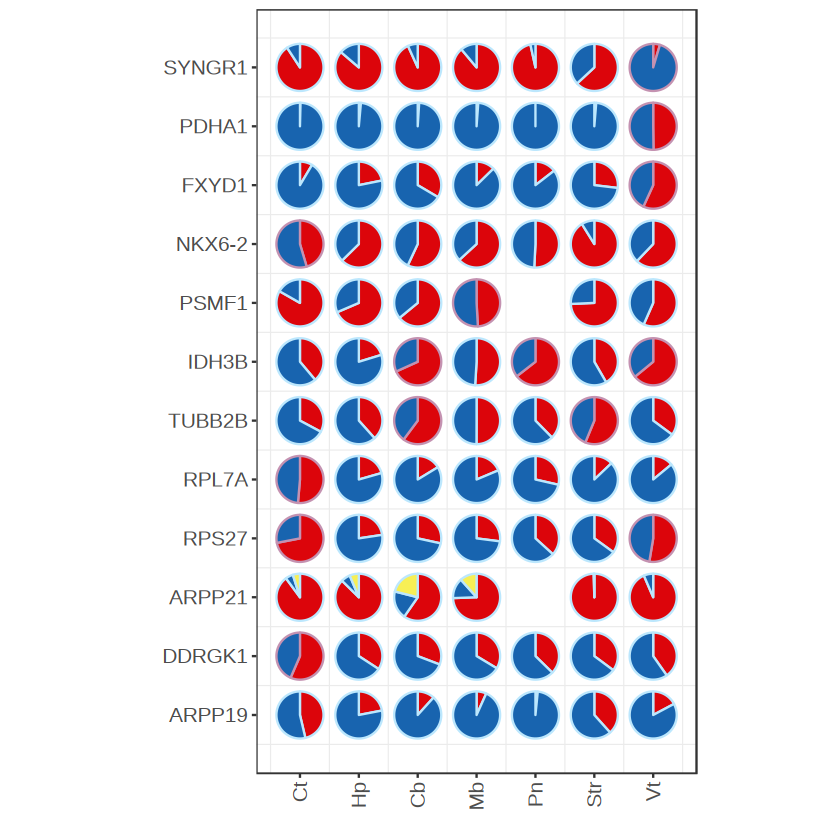

In [16]:
#case plot
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","ARPP21","RPS27","RPL7A","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
#caseg = colnames(isosigimx)
isosigi2 = isosigls$subcortical
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans,]
isosigi2 = isosigi2[isosigi2$sig == "Up",]

#casecti = casecti[casecti$genecount > 10,]

# casecti = casecti %>% group_by(transcript_id) %>% mutate(tcount = sum(count))
# casecti = casecti[order(casecti$gene_id,casecti$tcount),]
# transorder = unique(casecti$transcript_id)
# casecti$transcript_id = factor(casecti$transcript_id,levels = transorder)
casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = c("Cortex","Hippocampus","Cerebellum","Midbrain","Pons","Striatum","Ventricle")))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$major = 'Yes'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
transcolors = c("")
highlight = c("DDRGK1-Cortex","RPS27-Cortex","RPS27-Ventricle","RPL7A-Cortex",
              "TUBB2B-Cerebellum","TUBB2B-Striatum",
              "IDH3B-Cerebellum","IDH3B-Pons","IDH3B-Ventricle",
              "PSMF1-Midbrain","NKX6-2-Cortex",
              "FXYD1-Ventricle",
              "SYNGR1-Ventricle",
             "PDHA1-Ventricle")
casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$major = "No"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
xlabel = c("Ct","Hp","Cb","Mb","Pn","Str","Vt")
plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid,color = major,
                                           r = 0.4),
                      cols= colnames(casectl)[3:(3+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = xlabel) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("#C492B1","#BCE7FD")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08.pdf",width = 7,height = 4)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


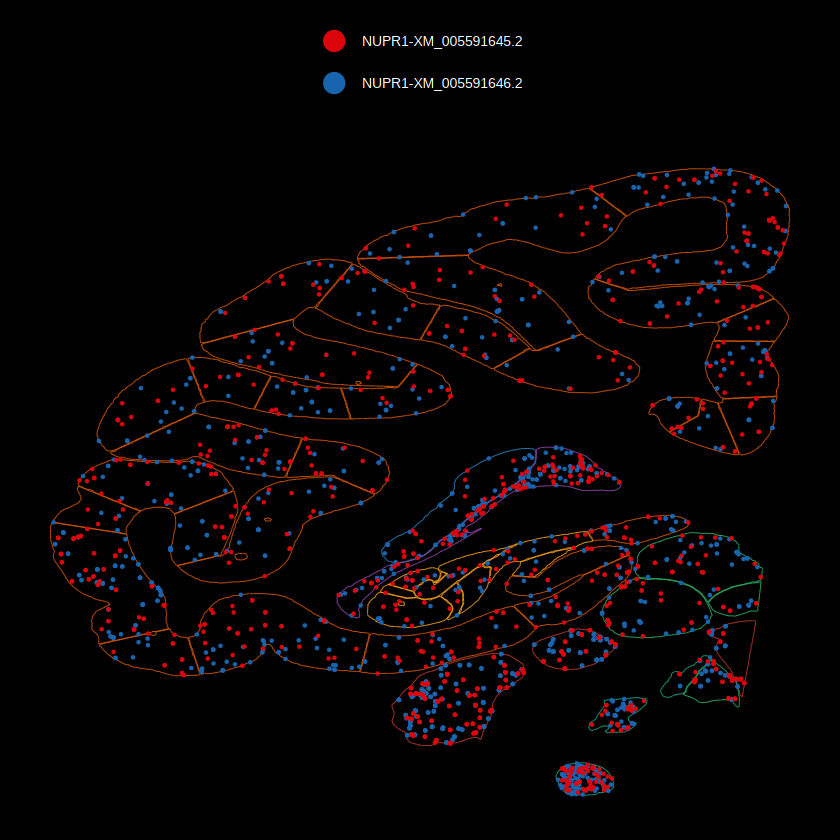

In [44]:
geneex = "NUPR1"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
# fileid = paste0("result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_",geneex,"_24_05_02.pdf")
hubtrans = c("NUPR1-XM_005591645.2","NUPR1-XM_005591646.2")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor)
pci

In [9]:
hubgene = c("ARPP19","DDRGK1","RPS27","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1","RPL7A","ARPP21")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
plmkt.sp = list()
for (i in c(1,2,4)) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.cor,
                               hubgene[i],hubtrans,ptsize = 0.5,mycolor,0.5)
}

for (i in c(3,5:length(hubgene))) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.cor,hubgene[i],hubtrans,ptsize = 0.5,mycolor)
}
plmkt.spt = ggarrange(plotlist = plmkt.sp,ncol = 8,nrow = 2)
ggexport(plmkt.spt,filename = "result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_total_case_25_12_08.pdf", 
         width = 12/4*8,height = 16/3*2)

[1] "ARPP19"
[1] "DDRGK1"
[1] "TUBB2B"
[1] "RPS27"
[1] "IDH3B"
[1] "PSMF1"
[1] "NKX6-2"
[1] "FXYD1"
[1] "PDHA1"
[1] "SYNGR1"
[1] "RPL7A"
[1] "ARPP21"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

In [92]:
#only see the isoform switched cases
library(dplyr)
library(tidyr)
library(purrr)
# major isoform shift stat
isosigi = isosigls$subcortical
hubgene = unique(isosigi[isosigi$sig != "N",]$gene_id)
isosigi = isosigi[isosigi$gene_id %in% hubgene,]
head(isosigi)
#construct phase dataset
isosigi$ismajor <- FALSE
isosigi <- isosigi %>%
  group_by(areatr, gene_id) %>%
  mutate(ismajor = ifelse(relative == max(relative), TRUE, FALSE)) %>%
  ungroup()
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#isosigi[isosigi$relative > 0.5,]$ismajor = TRUE
isosigi = isosigi[isosigi$ismajor == TRUE | (isosigi$ismajor == FALSE & abs(isosigi$relative - isosigi$otherrelative) > 0.1),]
isosigi = isosigi %>% group_by(transcript_id) %>% filter(length(unique(ismajor)) > 1)
length(unique(isosigi$gene_id))
hubtransid = unique(isosigi$transcript_id)

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
9,AACS,NM_001284010.1,Cerebellum,146,158,0.9240506,0.855632,0.8419483,0.08210238,N,0.001852607,0.005294328
10,AACS,NM_001284010.1,Cortex,2879,3272,0.8798900,0.855632,0.8507804,0.02910959,N,0.001852607,0.005294328
11,AACS,NM_001284010.1,Hippocampus,92,117,0.7863248,0.855632,0.8694934,-0.08316864,N,0.001852607,0.005294328
12,AACS,NM_001284010.1,Midbrain,37,48,0.7708333,0.855632,0.8725917,-0.10175838,Down,0.001852607,0.005294328
13,AACS,NM_001284010.1,Striatum,29,31,0.9354839,0.855632,0.8396616,0.09582226,N,0.001852607,0.005294328
14,AACS,NM_001284010.1,Ventricle,36,43,0.8372093,0.855632,0.8593165,-0.02210722,N,0.001852607,0.005294328


[1] 375

In [95]:
#shiftgcl
shiftgcl = read.csv(file = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.csv")
head(shiftgcl)
transt = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")

,gene_id,cluster
,<chr>,<chr>
1,ABCE1,c7
2,ACLY,c4
3,ACSF2,c1
4,AK1,c1
5,ALG13,c8
6,ALKBH6,c1


In [109]:
transt = FullLengthTranSt(fsraw.cor.sub,5)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


file saved to result/figure_revision/crossregion_subclass_isoform_shift_cb_show_25_10_22.pdf



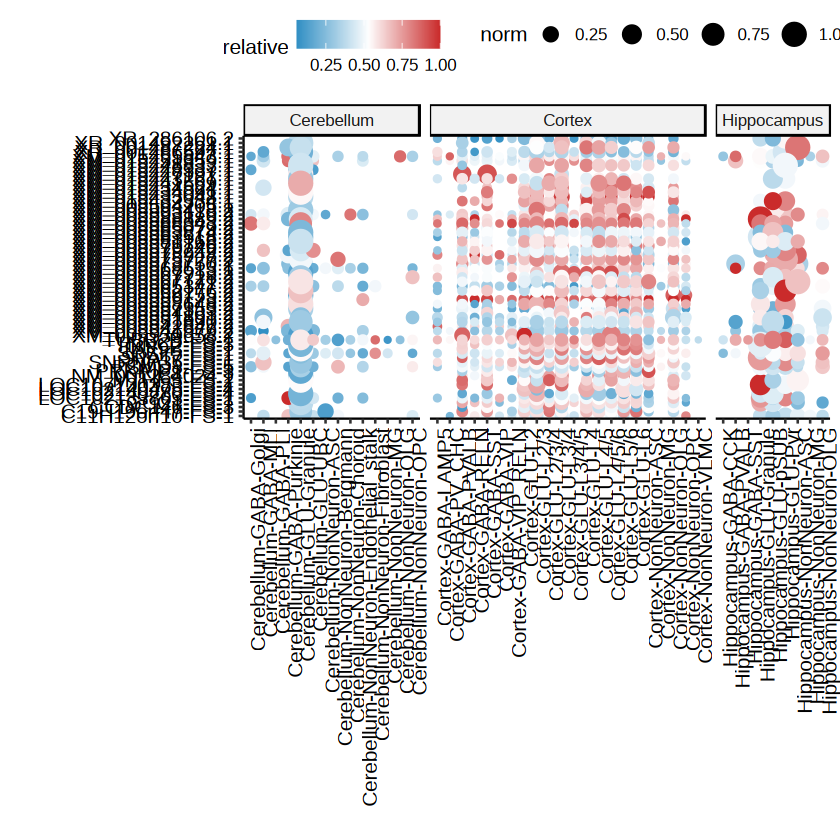

In [110]:
hubgene = shiftgcl[shiftgcl$cluster == "c3",]$gene_id
isosigi = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi = isosigi %>% group_by(subcortical,gene_id,transcript_id) %>% mutate(norm = count/sum(count))
pt = ggplot(isosigi,aes(x = areatr,y = transcript_id,color = relative,size = norm)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt
ggexport(pt,filename = "result/figure_revision/crossregion_subclass_isoform_shift_cb_show_25_10_22.pdf",
        width = 10,height = 12)

file saved to result/figure_revision/crossregion_subclass_isoform_shift_hp_show_25_10_22.pdf



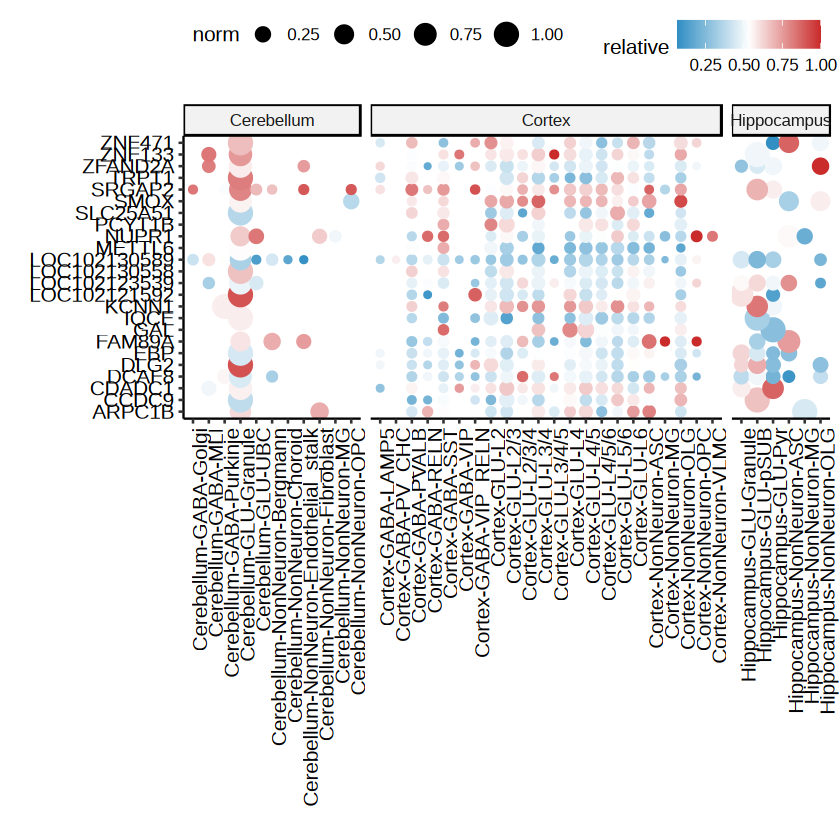

In [111]:
hubgene = shiftgcl[shiftgcl$cluster == "c2",]$gene_id
isosigi = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi = isosigi %>% group_by(subcortical,gene_id,transcript_id) %>% mutate(norm = count/sum(count))
pt = ggplot(isosigi,aes(x = areatr,y = gene_id,color = relative,size = norm)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt
ggexport(pt,filename = "result/figure_revision/crossregion_subclass_isoform_shift_hp_show_25_10_22.pdf",
        width = 10,height = 6)

file saved to result/figure_revision/crossregion_subclass_isoform_shift_cortex_show_25_10_22.pdf



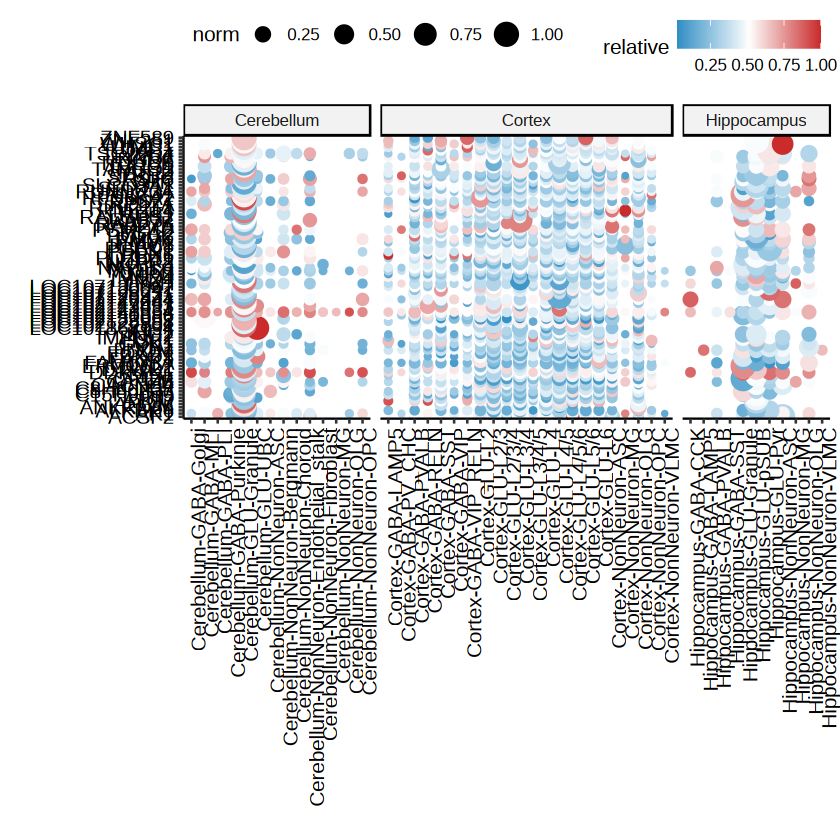

In [112]:
hubgene = shiftgcl[shiftgcl$cluster == "c1",]$gene_id
isosigi = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi = isosigi %>% group_by(subcortical,gene_id,transcript_id) %>% mutate(norm = count/sum(count))
pt = ggplot(isosigi,aes(x = areatr,y = gene_id,color = relative,size = norm)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt
ggexport(pt,filename = "result/figure_revision/crossregion_subclass_isoform_shift_cortex_show_25_10_22.pdf",
        width = 10,height = 12)

`summarise()` has grouped output by 'subcortical', 'subclass'. You can override
using the `.groups` argument.
Warning message:
"Removed 71 rows containing missing values or values outside the scale range
(`geom_text()`)."


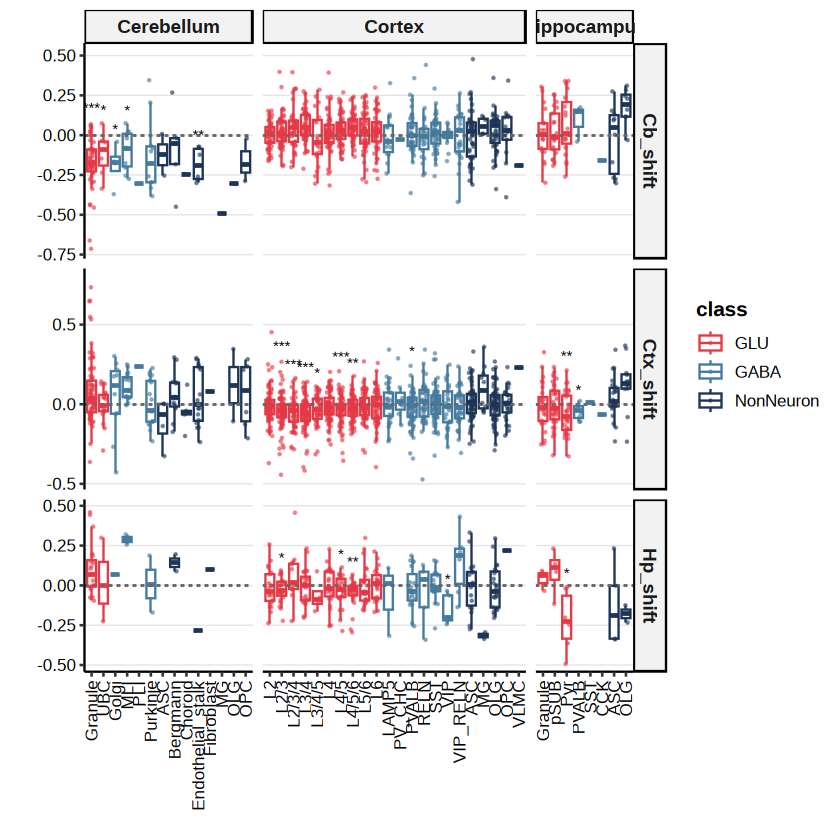

In [470]:
hubgene = shiftgcl[shiftgcl$cluster == "c3",]$gene_id
isosigi.cb = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi.cb$group = "Cb_shift"
hubgene = shiftgcl[shiftgcl$cluster == "c2",]$gene_id
isosigi.hp = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi.hp$group = "Hp_shift"
hubgene = shiftgcl[shiftgcl$cluster == "c1",]$gene_id
isosigi.ctx = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi.ctx$group = "Ctx_shift"
isosigi = rbind(isosigi.cb,isosigi.hp,isosigi.ctx)
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi$class = MySplit(isosigi$areatr,"-",2)
isosigi$subclass = MySplit(isosigi$areatr,"-",3)
isosigi$class = factor(isosigi$class,levels = c("GLU","GABA","NonNeuron"))
isosigi = isosigi[order(isosigi$class,isosigi$subcortical,isosigi$subclass),]
isosigi$subclass = factor(isosigi$subclass,levels = unique(isosigi$subclass))
isosigi = isosigi[isosigi$genecount > 10, ]
sig_labels <- isosigi %>%
  group_by(subcortical,subclass,group) %>%
  filter(n() > 3) %>%
  summarize(
    p_value = t.test(dr, mu = 0, alternative = "less")$p.value, # 计算p值
    # 根据p值生成显著性星号标签
    label = case_when(
      p_value < 0.001 ~ "***",
      p_value < 0.01 ~ "**",
      p_value < 0.05 ~ "*",
      TRUE ~ NA  # 若不显著，标记为"ns"；若不想显示ns，可改为 NA 或 ""
    ),
    # 设置标签的y坐标位置（略高于该组dr的最大值）
    y_position = max(dr, na.rm = TRUE) + 0.05 * diff(range(dr, na.rm = TRUE))
  )

p1.1 = ggplot(isosigi, aes(x = subclass, y = dr, color = class)) + 
      geom_boxplot(outlier.stroke = 0,
        #outlier.shape = 8,            # 异常点形状
        outlier.size = 0,
        alpha = 0.7,                  # 箱体透明度
        size = 0.5                    # 箱线粗细
      ) + 
      geom_hline(yintercept = 0, linetype = "dashed", color = "gray40", size = 0.6) +
      geom_jitter(width = 0.2, alpha = 0.5, size = 0.2) + # 添加抖动点显示数据分布
      geom_text(data = sig_labels, 
            aes(x = subclass, y = y_position, label = label), 
            color = "black",
            vjust = -0.5, 
            size = 3) + 
      facet_grid(group ~ subcortical, scales = "free",space = "free") + 
      scale_color_manual(values = c("#e63946",'#457b9d','#1d3557')) + # 使用Brewer配色
      theme_pubr() + 
      theme(
        axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 10),
        axis.text.y = element_text(size = 10),
        axis.title = element_text(face = "bold", size = 12),
        strip.text = element_text(face = "bold", size = 11), # 分面标签
        legend.position = "right",
        legend.title = element_text(face = "bold"),
        panel.grid.major.y = element_line(color = "gray90", size = 0.3) # 添加横向网格线
      ) + 
      xlab("") + 
      ylab("")
p1.1
# p1.cb = PlotCloneCell(hubgene,transt)
# hubgene = shiftgcl[shiftgcl$cluster == "c2",]$gene_id
# p1.hp = PlotCloneCell(hubgene,transt)
# hubgene = shiftgcl[shiftgcl$cluster == "c1",]$gene_id
# p1.ctx = PlotCloneCell(hubgene,transt)
# p1t = ggarrange(p1.cb,p1.hp,p1.ctx,nrow = 3,common.legend = T)
# p1t
# isomx

In [471]:
ggexport(p1.1,filename = "result/figure_revision/crossregion_subclass_isoform_shift_cortex_boxplot_25_11_04.pdf",width = 8,height = 4)

Warning message:
"Removed 71 rows containing missing values or values outside the scale range
(`geom_text()`)."
file saved to result/figure_revision/crossregion_subclass_isoform_shift_cortex_boxplot_25_11_04.pdf



## G model analysis

In [3]:
transt = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
transt$subcortical = MySplit(transt$areatr,"-",1)
transt$class = MySplit(transt$areatr,"-",2)
transt$subclass = MySplit(transt$areatr,"-",3)
#unique(transt[,c("class","subclass")])
transt[transt$class != "NonNeuron",]$subclass = transt[transt$class != "NonNeuron",]$class
transt = transt %>% group_by(subclass,subcortical,gene_id,transcript_id) %>% 
            summarise(count = sum(count),genecount = sum(genecount),relative = count/genecount)
#head(transt)
transtf = transt %>% group_by(subcortical,gene_id) %>% 
      filter(length(unique(transcript_id))>1)
transtf = transtf[transtf$count > 10,]
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
# #transtf = transtf[paste0(transtf$subclass,transtf$layer) %in% paste0(substf$subclass,substf$layer),]
# transtf = transtf %>% group_by(gene_id,transcript_id,class,subcortical) %>% summarise(count = sum(count),
#                                                                                       genecount = sum(genecount),
#                                                                                      relative = count/genecount)
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% mutate(subcortm = sum(count)/sum(genecount))

`summarise()` has grouped output by 'subclass', 'subcortical', 'gene_id'. You
can override using the `.groups` argument.


In [4]:
transtf.cl = transtf %>% group_by(gene_id,transcript_id,subclass) %>% summarise(relative = sum(count)/sum(genecount))
transtf.sb = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% summarise(relative = sum(count)/sum(genecount))
transtf.cl = transtf.cl %>% group_by(gene_id,transcript_id) %>% filter(n() > 1) %>% summarise(celldr = max(relative) - min(relative))
transtf.sb = transtf.sb %>% group_by(gene_id,transcript_id) %>% filter(n() > 1) %>% summarise(subdr = max(relative) - min(relative))
compardf = merge(transtf.cl,transtf.sb,by = c("gene_id","transcript_id"))

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


file saved to result/figure_revision/cross_region_subclass_maxchange_26_01_08.pdf



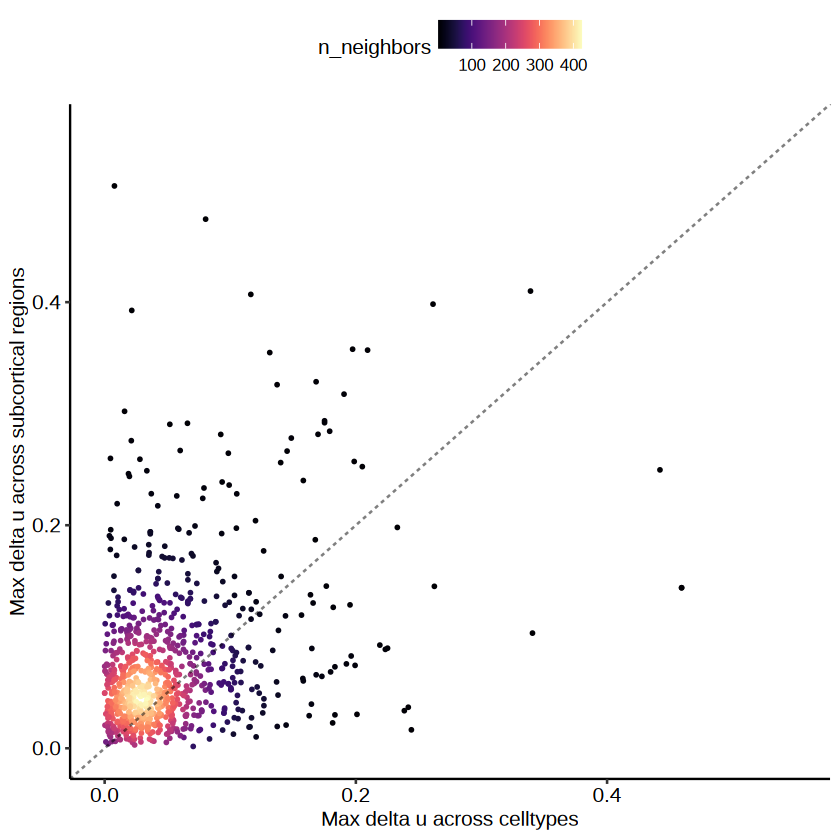

In [14]:
library(ggpointdensity)
p1.0 = ggplot(compardf,aes(x = celldr,y = subdr)) + geom_pointdensity(size = 0.5,adjust = 0.1) + 
        geom_abline(intercept = 0,linetype = 2,alpha = 0.5) +
        scale_color_viridis(option = "A") + 
        xlim(c(0,0.55)) + ylim(c(0,0.55)) + theme_pubr() + xlab("Max delta u across celltypes") + 
        ylab("Max delta u across subcortical regions")
p1.0
ggexport(p1.0,filename = "result/figure_revision/cross_region_subclass_maxchange_26_01_08.pdf",width = 4,height = 4)

In [192]:
unique(transtf$subcortical)

[1] "Cerebellum"  "Cortex"      "Hippocampus"

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


gene_id,transcript_id,subclass,cbdr,hpdr
<chr>,<chr>,<chr>,<dbl>,<dbl>
AAMDC,XM_005579175.2,GLU,0.117577161,0.192111322
AAMP,XM_005574266.2,GLU,0.027439614,0.030742205
ABAT,XM_005591210.2,GLU,0.033092369,0.005002869
ABCF1,XM_005553641.2,GLU,0.019985570,0.042207792
ABHD2,XM_005560462.2,GLU,0.005493485,0.127159576
ACOT8,XM_005569186.2,GLU,0.009753959,0.063866513


file saved to result/figure_revision/cross_region_subclass_change_facet_25_11_20.pdf



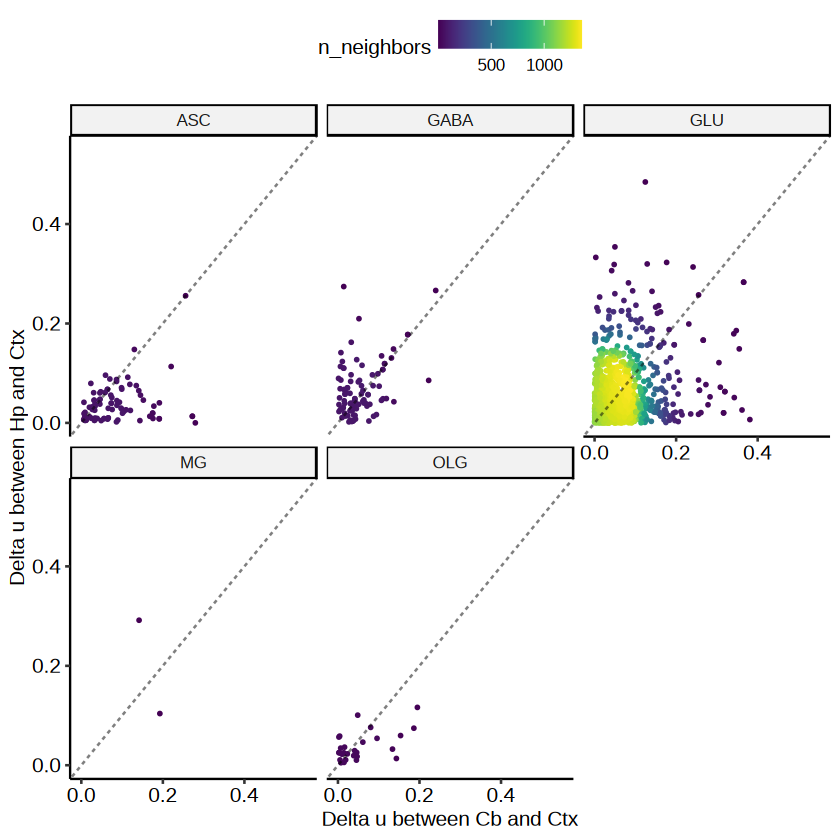

In [197]:
compardf.sb = transtf %>% group_by(gene_id,transcript_id,subclass) %>% filter(length(unique(subcortical)) == 3) %>% 
            summarise(cbdr = abs(relative[subcortical == "Cerebellum"] - relative[subcortical == "Cortex"]),
                      hpdr = abs(relative[subcortical == "Hippocampus"] - relative[subcortical == "Cortex"]))
head(compardf.sb)
p1.1 = ggplot(compardf.sb,aes(x = cbdr,y = hpdr)) + geom_pointdensity(size = 0.5) + 
        geom_abline(intercept = 0,linetype = 2,alpha = 0.5) +
        facet_wrap(~subclass) +
        scale_color_viridis() + 
        xlim(c(0,0.55)) + ylim(c(0,0.55)) + theme_pubr() + xlab("Delta u between Cb and Ctx") + 
        ylab("Delta u between Hp and Ctx")
p1.1
ggexport(p1.1,filename = "result/figure_revision/cross_region_subclass_change_facet_25_11_20.pdf",width = 6,height = 5)

In [222]:
transt = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
transt$subcortical = MySplit(transt$areatr,"-",1)
transt$class = MySplit(transt$areatr,"-",2)
transt$subclass = MySplit(transt$areatr,"-",3)
#unique(transt[,c("class","subclass")])
transt[transt$class != "NonNeuron",]$subclass = transt[transt$class != "NonNeuron",]$class
transt = transt %>% group_by(subclass,subcortical,gene_id,transcript_id) %>% 
            summarise(count = sum(count),genecount = sum(genecount),relative = count/genecount)
#head(transt)
transtf = transt %>% group_by(subcortical,gene_id) %>% 
      filter(length(unique(transcript_id))>1)
transtf = transtf[transtf$count > 20,]
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% mutate(subcortm = sum(count)/sum(genecount))

`summarise()` has grouped output by 'subclass', 'subcortical', 'gene_id'. You
can override using the `.groups` argument.


In [247]:
##plot G model results
library(lme4)
modelcoef2 = NULL
length(unique(transtf$transcript_id))
for(i in unique(transtf$gene_id)){
    model_with_region = tryCatch(glmer(relative ~  cellm + subcortm + (1|transcript_id),
                            family = binomial(),
                            data = transtf[transtf$gene_id == i,],
                            na.action = na.exclude), 
                   error = function(e) NA)

    if(!is.na(model_with_region)){
        modelsm = tryCatch(summary(model_with_region),error = function(e) NA)
        if(length(modelsm) == 1) next;
        modelsmdf = as.data.frame(modelsm$coefficients)
        modelsmdf$gene_id = i
        # gi = transt.lobei[transt.lobei$transcript_id == i,]$gene_id[1]
        # modelsmdf$gene_id = gi
        modelsmdf$areatr = rownames(modelsmdf)
        modelcoef2 = rbind(modelcoef2,modelsmdf)
    }    
    
   # print(summary(model_with_region))
}
modelcoef2

# modelcoef2 = qread("data/dtu_analysis/subcortical_subclass_isoform_model_tri_onlyregion_25_10_31.qs")
# head(modelcoef2)

[1] 2925

Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')

Warning message in is.na(model_with_region):
"is.na() applied to non-(list or vector) of type 'S4'"
Warning message in vcov.merMod(object, use.hessian = use.hessian):
"variance-covariance matrix computed from finite-difference Hessian is
not positive definite or contains NA values: falling back to var-cov estimated from RX"
Warning message in vcov.merMod(object, correlation = correlation, sigm = sig):
"variance-covariance matrix computed from finite-difference Hessian is
not positive definite or contains NA values: falling back to var-cov estimated from RX"
Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')

Warning message in is.na(model_with_region):
"is.na() applied to non-(list or vector) of type 'S4'"
Warning message in vcov.merMod(object, use.hessian =

,Estimate,Std. Error,z value,Pr(>|z|),gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
(Intercept),-63.111482,4.244725e+07,-1.486822e-06,0.9999988,ATP5H,(Intercept)
cellm,109.183931,8.045627e+08,1.357059e-07,0.9999999,ATP5H,cellm
subcortm,119.152315,7.964192e+08,1.496100e-07,0.9999999,ATP5H,subcortm
(Intercept)1,-51.246943,2.117247e+07,-2.420452e-06,0.9999981,ATP5J,(Intercept)
cellm1,56.893613,3.764434e+08,1.511346e-07,0.9999999,ATP5J,cellm
subcortm1,66.547514,3.919146e+08,1.698010e-07,0.9999999,ATP5J,subcortm
(Intercept)2,-68.872947,9.360515e+01,-7.357816e-01,0.4618636,C11H12orf57,(Intercept)
cellm2,8.947914,1.695798e+02,5.276520e-02,0.9579190,C11H12orf57,cellm
subcortm2,127.264069,1.696252e+02,7.502662e-01,0.4530944,C11H12orf57,subcortm


In [248]:
colnames(modelcoef2)[4] = "pvalue"
modelcoef2[modelcoef2$pvalue < 0.05,]

,Estimate,Std. Error,z value,pvalue,gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
(Intercept)33,-32.59602,14.840488,-2.196425,2.806152e-02,SNRPN,(Intercept)
cellm41,13.18934,5.247332,2.513533,1.195285e-02,TUBB2B,cellm
(Intercept)66,-22.22986,11.265339,-1.973297,4.846176e-02,CAMK2B,(Intercept)
(Intercept)88,-22.65246,9.904491,-2.287090,2.219058e-02,FKBP2,(Intercept)
subcortm116,249.65805,107.922509,2.313308,2.070569e-02,LOC102140594,subcortm
(Intercept)154,-94.91522,40.117280,-2.365944,1.798418e-02,PSMD4,(Intercept)
subcortm154,162.77946,40.887904,3.981115,6.859267e-05,PSMD4,subcortm
subcortm162,106.95425,52.773320,2.026673,4.269590e-02,RPSA,subcortm


[1] 881

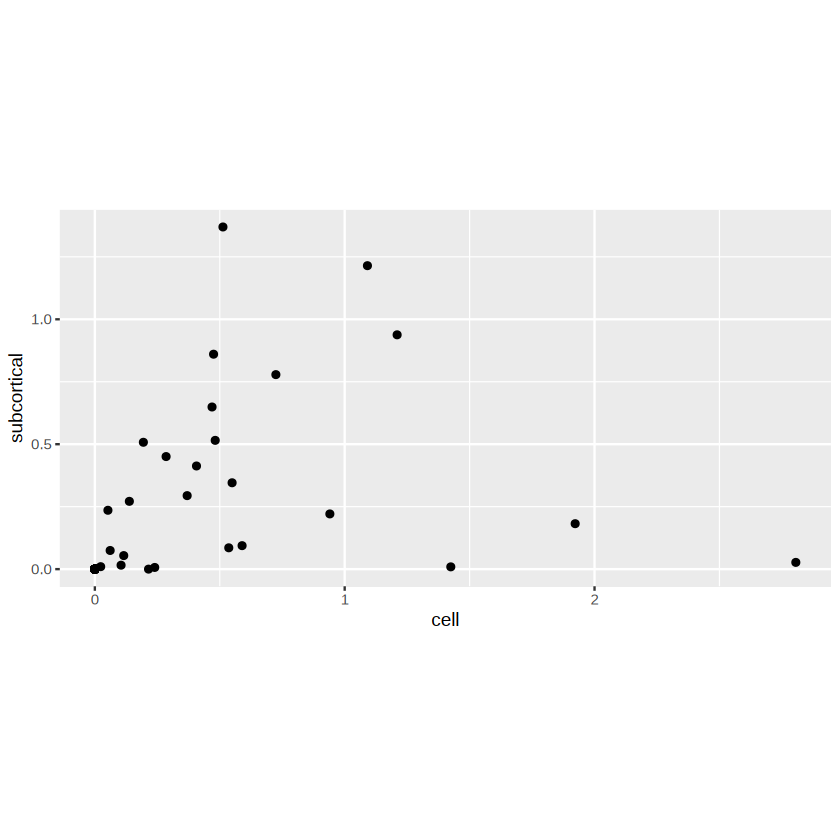

In [226]:
modelcoef2$group = modelcoef2$areatr
modelcoef2[modelcoef2$areatr == "cellm",]$group = "cell"
modelcoef2[modelcoef2$areatr == "subcortm",]$group = "subcortical"

#modelcoef[modelcoef$pvalue < 0.05,] %>% group_by(group) %>% summarise(max(abs(Estimate)))
#hubgene = modelcoef[modelcoef$pvalue < 0.05,]$gene_id
#modelcoef.hub = modelcoef[!modelcoef$group %in% c("(Int") & modelcoef$gene_id %in% hubgene,]
modelcoef.hub = modelcoef2[modelcoef2$group %in% c("cell","subcortical"),]
length(unique(modelcoef.hub$gene_id))
modelcoef.hub$pvalue = -log10(modelcoef.hub$pvalue)
modelmx1 = dcast(modelcoef.hub,gene_id~group,value.var = "pvalue",fun.aggregate = sum)
ggplot(modelmx1,aes(x = cell,y = subcortical)) + geom_point() + coord_fixed()

In [227]:
modelmx1.hub = modelmx1
modelmx1.hub$sig <- sapply(1:nrow(modelmx1.hub), function(i) {
  significant_cols <- names(modelmx1.hub)[-1][modelmx1.hub[i, -1] > -log10(0.05)]
  paste(significant_cols, collapse = "-")
})

In [237]:
#isosigtri = modelmx1.hub
transtf[transtf$gene_id == "IDH3B",]

Estimate,Std. Error,z value,pvalue,gene_id,areatr,group
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>


In [ ]:
library(ggrepel)
thred = -log10(0.05)
isosigtri = modelmx1.hub
#isosigtri[isosigtri$cell > (-log10(1.0e-32)),]$cell = -log10(1.0e-32)
#isosigtri[isosigtri$subcortical > (-log10(1.0e-32)),]$subcortical = -log10(1.0e-32)
#isosigtri = isosigtri[isosigtri$cell < 100 &,]
isosigtri = isosigtri[isosigtri$sig != "",]
#isosigtri = isosigtri[isosigtri$subcortical > thred,]
isosigtri[isosigtri$cell > thred,]$sig = "cell"
isosigtri[isosigtri$subcortical > thred,]$sig = "subcortical"
#isosigtri[isosigtri$subcortical > thred & isosigtri$cell > thred,]$sig = "cell-subcortical"
# isosigtri$group = "N"
# isosigtri[isosigtri$gene_id %in% isosigi2$gene_id,]$group = "Y"
length(unique(isosigtri$gene_id))
thred = log2(-log10(0.05))
casels = c("NTRK2","DBNDD2","DDRGK1","ARPP19","RTN1","MORF4L1","SNRPN")
p2 = ggplot(data = isosigtri,aes(x = log2(cell), y = log2(subcortical),color = sig)) + 
#geom_pointdensity() +
   geom_point(size = 1.5) + 
   geom_text_repel(data=isosigtri, nudge_y = .2,min.segment.length = unit(0, 'lines'),
             aes(x = log2(cell), y = log2(subcortical),label = gene_id),size = 3,color = "black",vjust = 0.1)+
   geom_hline(yintercept = thred,linetype = 3) +
   geom_vline(xintercept = thred,linetype = 3) +
    scale_x_continuous(limits = c(-8,6),breaks = c(log2(-log10(0.99)),log2(-log10(0.9)),
                                log2(-log10(0.05)),log2(-log10(0.01)),3,5),
                     labels = c("0.99","0.9","0.05","0.01","10-e8","10-e32")) +
     scale_y_continuous(limits = c(-8,6),breaks = c(log2(-log10(0.99)),log2(-log10(0.9)),
                                log2(-log10(0.05)),log2(-log10(0.01)),3,5),
                     labels = c("0.99","0.9","0.05","0.01","10-e8","10-e32")) +
    scale_color_manual(values = c("#789CBE","#FEE1E3","#CBE8D2")) +
   # geom_text_repel(data=isosigtri[!isosigtri$sig %in% c("","cell"),],
   #                 aes(cell,lobe,layer,label = gene_id),size = 2,color = "black") +
    theme_bw() + 
    theme(panel.grid.major = element_blank(),panel.grid.minor = element_blank(),
          axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
    xlab("Contribution p value of subclass") + 
    ylab("Contribution p value of cortex region")
#scale_fill_viridis()
    #scale_color_discreterainbow()
p2
# table(isosigtri$group)
# table(isosigtri$sig)
ggexport(p2,filename = "result/figure_revision/cross_region_subclass_model_contribution_fil_25_11_20.pdf",width = 4.5,height = 3)
# pdf("result/figure5/region_subclass_model_contribution_stpie_24_12_20.pdf",width = 4,height = 4)
# p2.1 = pie(table(isosigtri$sig),col = c("#789DBC","#FFE3E3","#C9E9D2"))
# p2.1
# dev.off()


### GLU vs GABA and NN

In [19]:
# dtumkdf.hub = qread(file = "result/figure3/class_DTU_by_subclass_ttest_25_10_11.qs")
# head(dtumkdf.hub)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$class),]
fsraw.cor.sub$class = gsub(fsraw.cor.sub$class,pattern = "Glu",replacement = "GLU")
head(fsraw.cor.sub)

readid,origin_name,cell_id,cell_type_id,subclass,class,gene_id,layer,region,subcortical,transcript_id,lobe,x,y,areatr
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
589a032e-1c17-43b6-9fbf-5dc59250a856-7;st_ed:A:2600-2951;AD:A:adapterL.rc-adapterK.rc;AP:A:Correct_20-44:-,L-1|2-l3,600265,19,L2/3,GLU,LOC102143409,l3,1|2,Cortex,XM_005595588.2,somatosensory,10000,26922,Cortex-L2/3
9ac7b273-96bf-4d68-80fb-d7ff514e5ebe-5;st_ed:A:1453-2414;AD:A:adapterD-adapterE;AP:A:Correct_917-941:+,L-1|2-l3,995906,199,SST,GABA,LOC102118724,l3,1|2,Cortex,XM_005594222.1,somatosensory,10000,27116,Cortex-SST
4ba4820b-e8fa-46a0-821c-c6712593c1d6-2;st_ed:A:54-981;AD:A:adapterM.rc-adapterL;AP:A:RC-Wrong_882-908:+,L-1|2-l3,367403,55,L3/4,GLU,APOO,l3,1|2,Cortex,XM_005593179.2,somatosensory,10000,27283,Cortex-L3/4
0cda11f1-c8d9-420c-92f5-c559b823a60c-5;st_ed:A:9766-10659;AD:A:adapterM-adapterN;AP:A:Correct_850-874:+,L-1|2-l3,221672,44,L3/4,GLU,MCM4,l3,1|2,Cortex,XM_005563283.2,somatosensory,10000,27312,Cortex-L3/4
31a90124-560e-4cc0-bf91-1f36255f8739-4;st_ed:A:1305-2664;AD:A:adapterN.rc-adapterM.rc;AP:A:Correct_20-45:-,L-1|2-l3,221672,44,L3/4,GLU,SNCB,l3,1|2,Cortex,XM_005558602.2,somatosensory,10000,27312,Cortex-L3/4
ef487e6a-3992-4bb2-a088-184a261be56e-16;st_ed:A:8794-9695;AD:A:adapterJ.rc-adapterI.rc;AP:A:Correct_21-44:-,L-1|2-l3,221672,44,L3/4,GLU,MCM4,l3,1|2,Cortex,XM_005563283.2,somatosensory,10000,27312,Cortex-L3/4


In [23]:
#unique(fsraw.cor.sub$class)
#qsave(fsraw.cor.sub,"data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_filter_25_10_28.qs")
#unique(fsraw.cor.sub$subcortical)

[1] "Cortex"      "Hippocampus" "Cerebellum"

In [43]:
fsraw.cor.sub$areatr = fsraw.cor.sub$class
threld = 20
transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
transt.hp = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",],threld)
transt.cb = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",],threld)
transt.ctx$group = "Cortex"
transt.hp$group = "Hippocampus"
transt.cb$group = "Cerebellum"
transt = rbind(transt.ctx,transt.hp,transt.cb)
head(transt)
qsave(transt,file = "data/cross_region/transt_subcortical_inner_cell_level_25_11_03.qs")

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,group
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAAS,AAAS-FS-1,GABA,6,55,0.10909091,0.0773390,0.06146305,0.047627862,Cortex
AAAS,AAAS-FS-1,GLU,15,234,0.06410256,0.0773390,0.08395722,-0.019854655,Cortex
AAAS,AAAS-FS-1,NonNeuron,2,34,0.05882353,0.0773390,0.08659674,-0.027773207,Cortex
AAAS,AAAS-FS-2,GABA,2,55,0.03636364,0.0502331,0.06410256,-0.027738928,Cortex
AAAS,AAAS-FS-2,GLU,15,234,0.06410256,0.0502331,0.03636364,0.027738928,Cortex
AAAS,XM_005571000.2,GABA,47,55,0.85454545,0.8553194,0.85570639,-0.001160931,Cortex


Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_25_11_04.pdf



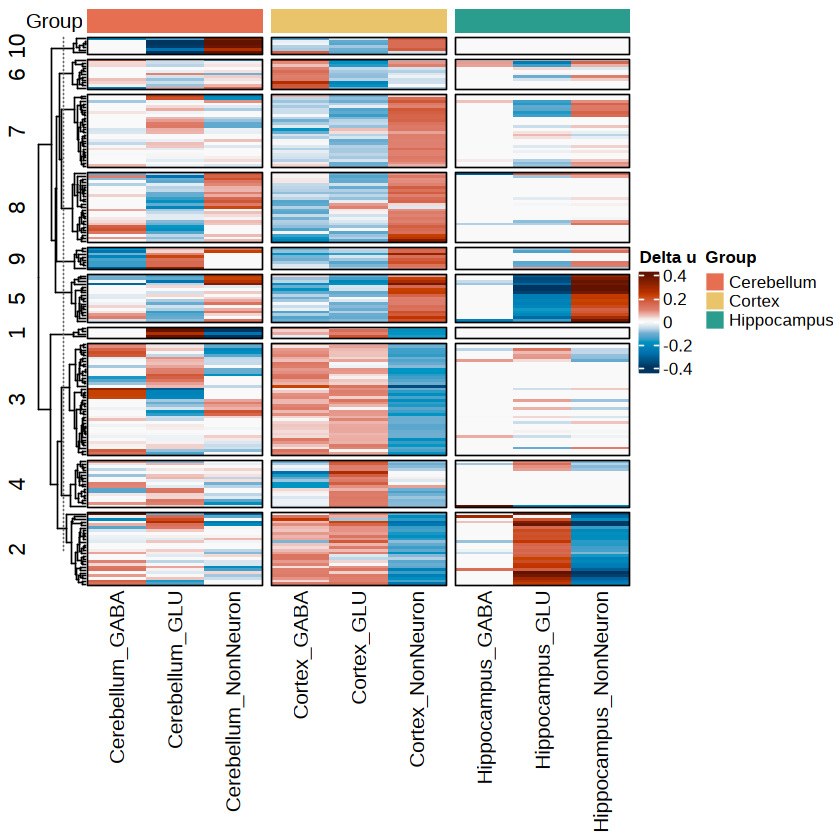

In [64]:
# 从列名提取group信息
isosigi = isosigls$class
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
transt.fil = transt[transt$transcript_id %in% hubtrans,]
head(transt.fil)
# 从列名中提取group信息（假设列名格式为"group_areatr"）
transt.fil = transt.fil %>% group_by(transcript_id) %>% filter(length(unique(group)) > 1)
isomx = dcast(transt.fil,transcript_id~group+areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$transcript_id;isomx = isomx[,-1]
col_groups <- sapply(strsplit(colnames(isomx), "_"), function(x) x[1])
library(circlize)
col_groups <- sapply(strsplit(colnames(isomx), "_"), function(x) x[1])

# 创建顶部注释
top_annotation <- HeatmapAnnotation(
  Group = col_groups,
  col = list(Group = c("Cerebellum" = "#e76f51", "Cortex" = "#e9c46a", "Hippocampus" = "#2a9d8f")),
  annotation_name_side = "left"
)
col_fun = colorRamp2(c(-0.4,-0.1, 0,0.1, 0.4), hcl_palette = "RdBu",reverse = T)
# 绘制完整的热图
pht = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,row_km = 10,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht
ggexport(pht,filename = "result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_25_11_04.pdf",width = 6,height = 8)

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_fil_25_11_04.pdf



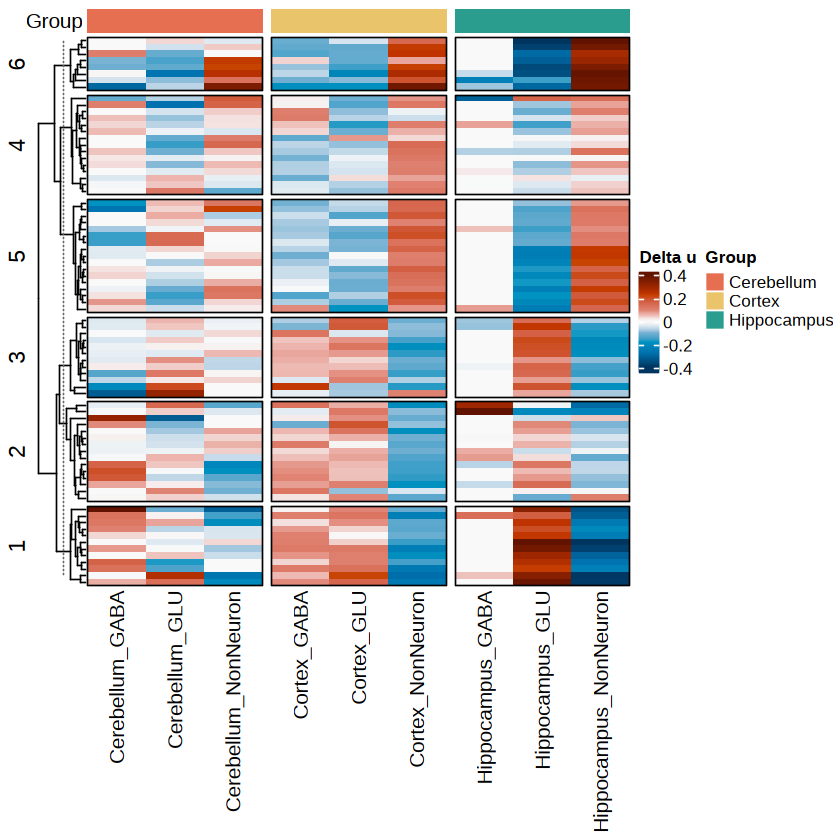

In [67]:
pht = Heatmap(isomx[rowSums(isomx != 0) > 6,],name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,row_km = 6,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht
ggexport(pht,filename = "result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_fil_25_11_04.pdf",width = 6,height = 7)

In [273]:
transt.cl = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
transt.cl$subcortical = MySplit(transt.cl$areatr,"-",1)
transt.cl$class = MySplit(transt.cl$areatr,"-",2)
transt.cl$subclass = MySplit(transt.cl$areatr,"-",3)
head(transt.cl)
# unique(transt[,c("class","subclass")])
# transt[transt$class != "NonNeuron",]$subclass = transt[transt$class != "NonNeuron",]$class
# transt = transt %>% group_by(subclass,subcortical,gene_id,transcript_id) %>% summarise(count = sum(count),genecount = sum(genecount))

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,subcortical,class,subclass
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
AAAS,AAAS-FS-1,Cerebellum-GLU-Granule,5,29,0.17241379,0.1068386,0.09590945,0.07650435,Cerebellum,GLU,Granule
AAAS,AAAS-FS-1,Cortex-GABA-PVALB,5,32,0.15625000,0.1068386,0.09860341,0.05764659,Cortex,GABA,PVALB
AAAS,AAAS-FS-1,Cortex-GLU-L2/3,8,43,0.18604651,0.1068386,0.09363733,0.09240918,Cortex,GLU,L2/3
AAAS,AAAS-FS-1,Cortex-GLU-L3/4,3,50,0.06000000,0.1068386,0.11464508,-0.05464508,Cortex,GLU,L3/4
AAAS,AAAS-FS-1,Cortex-GLU-L4,1,33,0.03030303,0.1068386,0.11959457,-0.08929154,Cortex,GLU,L4
AAAS,AAAS-FS-1,Cortex-GLU-L4/5/6,2,21,0.09523810,0.1068386,0.10877206,-0.01353397,Cortex,GLU,L4/5/6


In [7]:
transt$relative = transt$count/transt$genecount
transt = transt %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
transt$dr = transt$relative - transt$otherrelative

In [8]:
unique(transt$subclass)
transtf = transt %>% group_by(subclass,gene_id) %>% 
      filter(length(unique(transcript_id))>1)
transtf = transtf[transtf$count > 10,]
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
#transtf = transtf[paste0(transtf$subclass,transtf$layer) %in% paste0(substf$subclass,substf$layer),]
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% 
                mutate(cellm = sum(count)/sum(genecount),drr = relative - cellm)
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% 
                mutate(subcortm = sum(count)/sum(genecount),drc = relative - subcortm)

[1] "ASC"               "Bergmann"          "Choroid"          
 [4] "EC"                "Endothelial_stalk" "Fibroblast"       
 [7] "GABA"              "GLU"               "MG"               
[10] "OLG"               "OPC"               "VLMC"

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


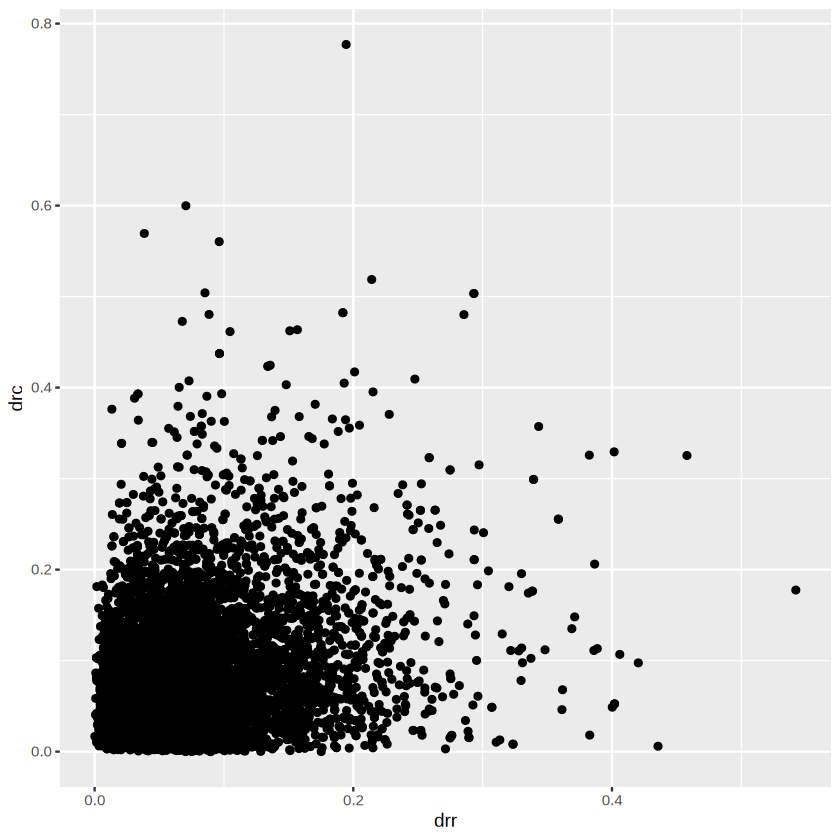

In [271]:
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$class
transt.cl = FullLengthTranSt(fsraw.cor.sub,threld)
fsraw.cor.sub$areatr = fsraw.cor.sub$subcortical
transt.rg = FullLengthTranSt(fsraw.cor.sub,threld)
iso.cl = transt.cl %>% group_by(gene_id,transcript_id) %>% summarise(drr = max(relative) - min(relative))
iso.rg = transt.rg %>% group_by(gene_id,transcript_id) %>% summarise(drc = max(relative) - min(relative))
isocmp = merge(iso.cl,iso.rg)
ggplot(isocmp,aes(x = drr,y = drc)) + geom_point()

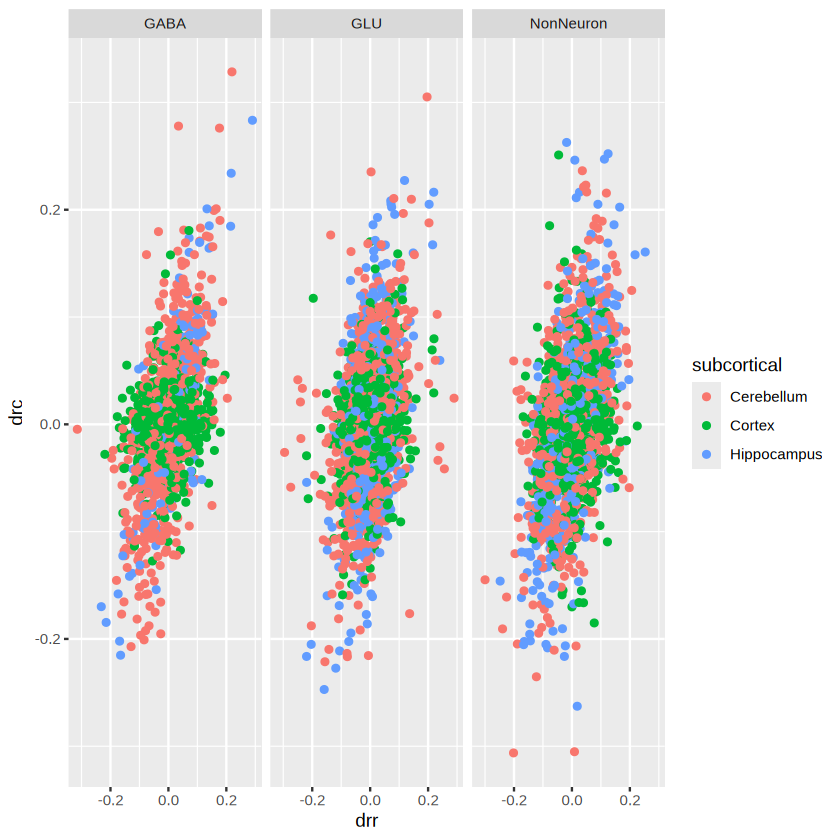

In [270]:
isosigi = isosigi %>% group_by(transcript_id,class) %>% filter(n() > 1)
isosigi = isosigi %>% group_by(transcript_id,subcortical) %>% filter(n() > 1)

isosigi = isosigi %>% group_by(transcript_id,class) %>% mutate(drr = relative - mean(relative))
isosigi = isosigi %>% group_by(transcript_id,subcortical) %>% mutate(drc = relative - mean(relative))
ggplot(isosigi,aes(x = drr,drc,color = subcortical)) + geom_point() + facet_wrap(~class)

In [267]:
final_results[final_results$p_value < 0.05 & !is.na(final_results$p_value),]
#final_results

transcript_id,cell_type,data,anova_p,kw_p,n_regions,n_obs,status,p_value,is_conserved,significance
<chr>,<fct>,<list>,<lgl>,<dbl>,<int>,<int>,<chr>,<dbl>,<lgl>,<chr>


In [20]:
isosiggl = dcast(transtf,gene_id+transcript_id+subclass~subcortical,value.var = "relative",fun.aggregate = sum)
nrow(isosiggl)
isosiggl = isosiggl[rowSums(isosiggl[,4:6]>0.01) == 3,]
nrow(isosiggl)

[1] 11491

[1] 5187

In [13]:
modeldf = qread("data/dtu_analysis/subcortical_subclass_isoform_model_tri_onlyregion_25_10_31.qs")
modeldf.fil = modeldf[modeldf$pvalue < 0.05,]
modeldf.fil = modeldf.fil[modeldf.fil$areatr != "(Intercept)",]
modeldf.fil

,Estimate,Std. Error,z value,pvalue,gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
cellm105,69.24571,34.592919,2.001731,4.531370e-02,LOC102141554,cellm
subcortm135,47.80928,23.042962,2.074789,3.800612e-02,NDUFS7,subcortm
cellm142,35600.87892,3734.829866,9.532129,1.540906e-21,NTRK2,cellm
subcortm186,48.82865,23.938607,2.039745,4.137576e-02,RPSA,subcortm
cellm203,37.09875,15.575242,2.381905,1.722333e-02,SNRPN,cellm
cellm230,13.54810,4.640461,2.919559,3.505269e-03,TUBB2B,cellm
cellm245,101.52728,46.406389,2.187787,2.868514e-02,YWHAH,cellm
subcortm297,71.66527,29.779402,2.406538,1.610451e-02,ARGLU1,subcortm
subcortm429,18.61625,8.784216,2.119284,3.406644e-02,DPCD,subcortm


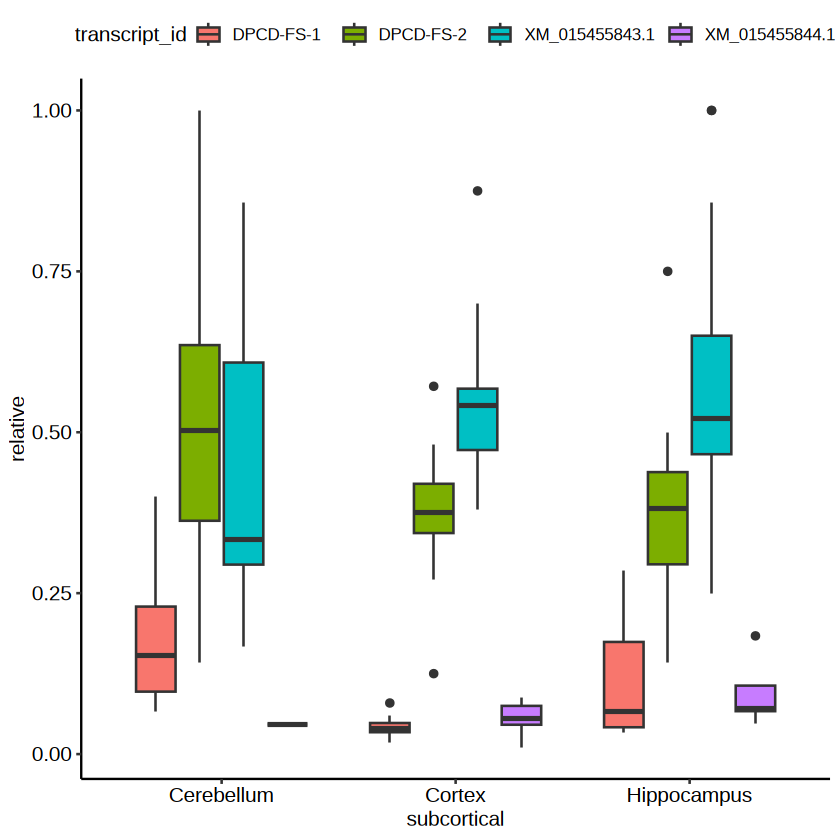

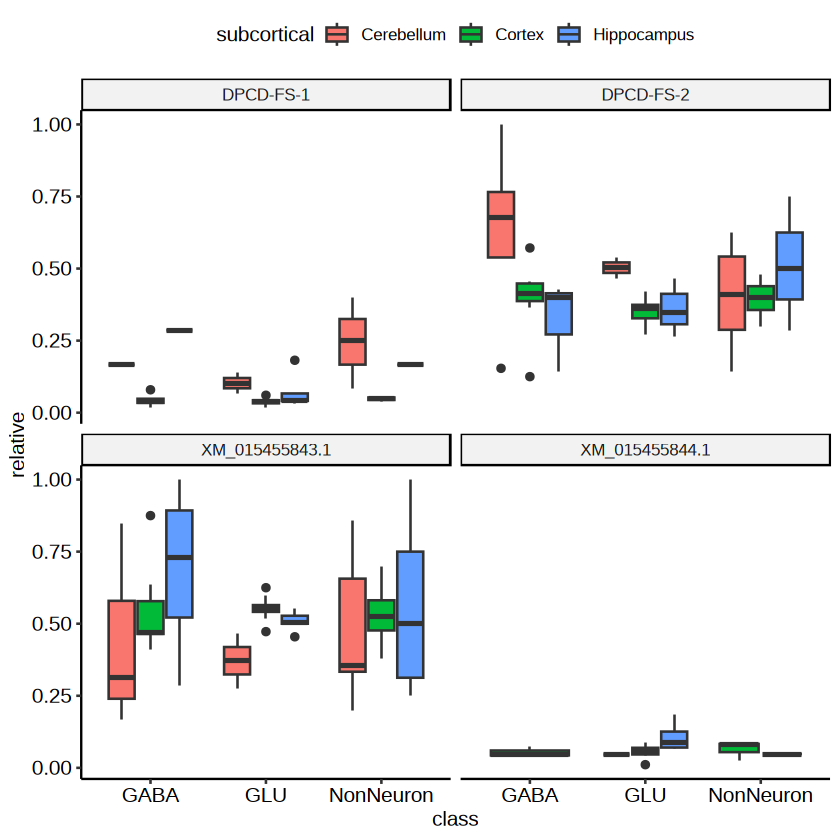

In [159]:
isocase = transt.cl[transt.cl$gene_id == "DPCD",]
ggplot(isocase,aes(x = subcortical,y = relative,fill = transcript_id)) + geom_boxplot() + theme_pubr()
ggplot(isocase,aes(x = class,y = relative,fill = subcortical)) + 
                facet_wrap(~transcript_id) +
                geom_boxplot() + theme_pubr()

##  Cell Case Plot

In [200]:
library(randomcoloR)
pref = qread("../ref/area_figure_an.qs")
subcoran = unique(fsraw.cor[,c("region","subcortical")])
edgesdf = pref$areaedges
edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
names(mycolor) = unique(edgesdf$subcortical)

In [208]:
head(edgesdf)

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1|2,14137,8201,13719,27125,13805,27151,13748.72,27181.92,13821.84,26940.06,0,0,Cortex
2,1|2,6544,36469,13921,27127,14028,27183,13984.86,27135.20,14070.35,26971.87,0,0,Cortex
3,1|2,23042,28818,14240,27193,14298,27255,14311.90,27183.87,14657.62,26860.46,0,0,Cortex
4,1|2,7559,14391,13318,27000,13548,27076,13463.00,26947.21,13962.13,25436.69,0,0,Cortex
5,1|2,11606,7559,13277,27001,13318,27000,13298.28,27032.41,13281.32,26337.29,0,0,Cortex
6,1|2,37516,11606,13227,27004,13277,27001,13253.47,27026.95,13226.19,26572.31,0,0,Cortex


In [10]:
#head(subcoran)
# pref = qread("../ref/area_figure_an.qs")
# subcoran = unique(fsraw.cor[,c("region","subcortical")])
# edgesdf = pref$areaedges
# edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
# edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
# mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
# names(mycolor) = unique(edgesdf$subcortical)


#head(edgesdf)
#backpt = qread("longread_cell_isoform_")
SpCasePlot = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    # mkdf.st = mkdf %>% group_by(transcript_id) %>% summarise(count = length(readid))
    # mkdf.st = mkdf.st[order(mkdf.st$count),]
    # transorder = unique(mkdf.st$transcript_id)
    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    #edgesdf.zoom = edgesdf[,]
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),size = ptsize,stroke = NA,shape = 21) + 
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
      #            size = 0.5,alpha = 0.75) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 

      theme_void() +
      #scale_fill_discreterainbow() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      #scale_color_manual(values = mycolor) +
      #scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()
    return(pmkpti1)
}

SpCasePlot = function(fsraw.cor, geneex, hubtrans, edgesdf, ptsize = 1, mycolor, downsample = 0) {
    # 处理数据
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex, ]
    if (downsample != 0) {
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans, ]
    mkdf$transcript_id = factor(mkdf$transcript_id, levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)), ]
    
    # 计算isoform比例用于饼图
    isoform_counts <- table(mkdf$transcript_id)
    isoform_prop <- prop.table(isoform_counts)
    pie_data <- data.frame(
        transcript_id = names(isoform_prop),
        proportion = as.numeric(isoform_prop),
        stringsAsFactors = FALSE
    )
    
    # 创建饼图
    pie_plot <- ggplot(pie_data, aes(x = "", y = proportion, fill = transcript_id)) +
        geom_bar(width = 1, stat = "identity", color = "white") +
        coord_polar("y", start = 0) +
        scale_fill_manual(values = mycolor[2:1]) +
        theme_void() +
        theme(legend.position = "none")
    
    # 创建主图
    pmkpti1 <- ggplot() +
        geom_segment(data = edgesdf, 
                     aes(x = x1, y = y1, xend = x2, yend = y2, color = subcortical),
                     size = 0.2, alpha = 1) +
        geom_point(data = mkdf,
                   aes(x, y, fill = transcript_id), size = ptsize, stroke = NA, shape = 21) + 
        theme_void() +
        scale_color_flatui() +
        scale_fill_manual(values = mycolor) +
        theme_presentation() + 
        theme(legend.position = "top", legend.title = element_blank(),
              legend.text = element_text(size = 8)) +
        guides(color = "none",
              fill = guide_legend(override.aes = list(size = 6), nrow = 2), size = 7) +
        scale_y_reverse() + 
        scale_x_reverse()
    
    # 在右上角添加饼图
    pmkpti1 <- pmkpti1 + 
        annotation_custom(
            ggplotGrob(pie_plot),
            xmin = max(mkdf$x, na.rm = TRUE) - diff(range(mkdf$x, na.rm = TRUE)) * 0.3,
            xmax = max(mkdf$x, na.rm = TRUE) + diff(range(mkdf$x, na.rm = TRUE)) * 0.1,
            ymin = min(mkdf$y, na.rm = TRUE) - diff(range(mkdf$y, na.rm = TRUE)) * 0.3,
            ymax = min(mkdf$y, na.rm = TRUE) + diff(range(mkdf$y, na.rm = TRUE)) * 0.1
        )
    
    return(pmkpti1)
}

In [233]:
#select case
isosigi = isosigls$subcortical
# hubgene = rownames(isomx)[which(split == 8)]
hubgene = "RPSA"
isosigi = isosigi[isosigi$gene_id %in% hubgene,]
isosigi[order(-isosigi$count),]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
36602,RPSA,XM_015445275.1,Cortex,25539,50234,0.5084007,0.4794985,0.4746815,0.033719233,N,3.297091e-08,2.295011e-07
36595,RPSA,NM_001284067.1,Cortex,24159,50234,0.4809293,0.5013337,0.5047344,-0.023805137,N,3.297091e-08,2.295011e-07
36604,RPSA,XM_015445275.1,Midbrain,1086,2099,0.5173892,0.4794985,0.4731834,0.044205873,N,3.297091e-08,2.295011e-07
36596,RPSA,NM_001284067.1,Hippocampus,975,1825,0.5342466,0.5013337,0.4958482,0.038398408,N,3.297091e-08,2.295011e-07
36597,RPSA,NM_001284067.1,Midbrain,971,2099,0.4626012,0.5013337,0.5077891,-0.045187818,N,3.297091e-08,2.295011e-07
36594,RPSA,NM_001284067.1,Cerebellum,928,1806,0.5138427,0.5013337,0.4992488,0.014593941,N,3.297091e-08,2.295011e-07
36601,RPSA,XM_015445275.1,Cerebellum,852,1806,0.4717608,0.4794985,0.4807881,-0.009027302,N,3.297091e-08,2.295011e-07
36603,RPSA,XM_015445275.1,Hippocampus,817,1825,0.4476712,0.4794985,0.4848030,-0.037131794,N,3.297091e-08,2.295011e-07
36600,RPSA,NM_001284067.1,Ventricle,740,1452,0.5096419,0.5013337,0.4999490,0.009692922,N,3.297091e-08,2.295011e-07


In [208]:
fsraw.cor.case = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",]
edgesdf.zoom = edgesdf[edgesdf$subcortical == "Cerebellum",]
fsraw.cor.case2 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",]
edgesdf.zoom2 = edgesdf[edgesdf$subcortical == "Hippocampus",]
fsraw.cor.case3 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",]
edgesdf.zoom3 = edgesdf[edgesdf$subcortical == "Cortex",]
CaseTotalPlot = function(geneex,hubtrans){
    pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
    pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
    pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
    pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
    pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
    pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
    pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
    pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
    pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
    pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                         pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                         pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                         ncol = 3,nrow = 3,
                         common.legend = TRUE,legend = "right")
    return(pci.zoom)
}
geneex = "CFL2"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005561059.2","NM_001284960.1")
pci.zoom = CaseTotalPlot(geneex,hubtrans)
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_20.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

In [234]:
geneex = "RPSA"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001284067.1","XM_015445275.1")
pci.zoom = CaseTotalPlot(geneex,hubtrans)
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_20.pdf"),
        width = 9/2,height = 8/2)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

In [ ]:
geneex = "GPX4"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005587358.2","GPX4-FS-2")
pci.zoom = CaseTotalPlot(geneex,hubtrans)
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_20.pdf"),
        width = 9/2,height = 8/2)

In [473]:
geneex = "TUBA8"
isocase = transt.cl[transt.cl$gene_id %in% geneex,]
isocase = isocase[abs(isocase$dr) > 0.05,]
isocase[order(-isocase$count),]
#library(randomcoloR)
#geneex = "ARPP19"
# mycolor =  c('#DC050B','#1864AF','#F7EF55')
# hubtrans = c("XM_005543075.2","XM_005543078.2")
# pci = SpCasePlot(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 0.3,mycolor)
# pci

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
TUBA8,TUBA8-FS-1,Cortex-GABA,108,167,0.6467066,0.6942296,0.7021500,-0.05544346
TUBA8,TUBA8-FS-1,Cortex-NonNeuron,61,79,0.7721519,0.6942296,0.6812425,0.09090940
TUBA8,NM_001283804.1,Cortex-GABA,57,167,0.3413174,0.2895957,0.2809754,0.06034198
TUBA8,TUBA8-FS-1,Hippocampus-GLU,37,50,0.7400000,0.6942296,0.6866011,0.05339885
TUBA8,TUBA8-FS-1,Cerebellum-NonNeuron,29,45,0.6444444,0.6942296,0.7025271,-0.05808263
TUBA8,NM_001283804.1,Cortex-NonNeuron,18,79,0.2278481,0.2895957,0.2998869,-0.07203883
TUBA8,NM_001283804.1,Cerebellum-NonNeuron,15,45,0.3333333,0.2895957,0.2823061,0.05102727


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

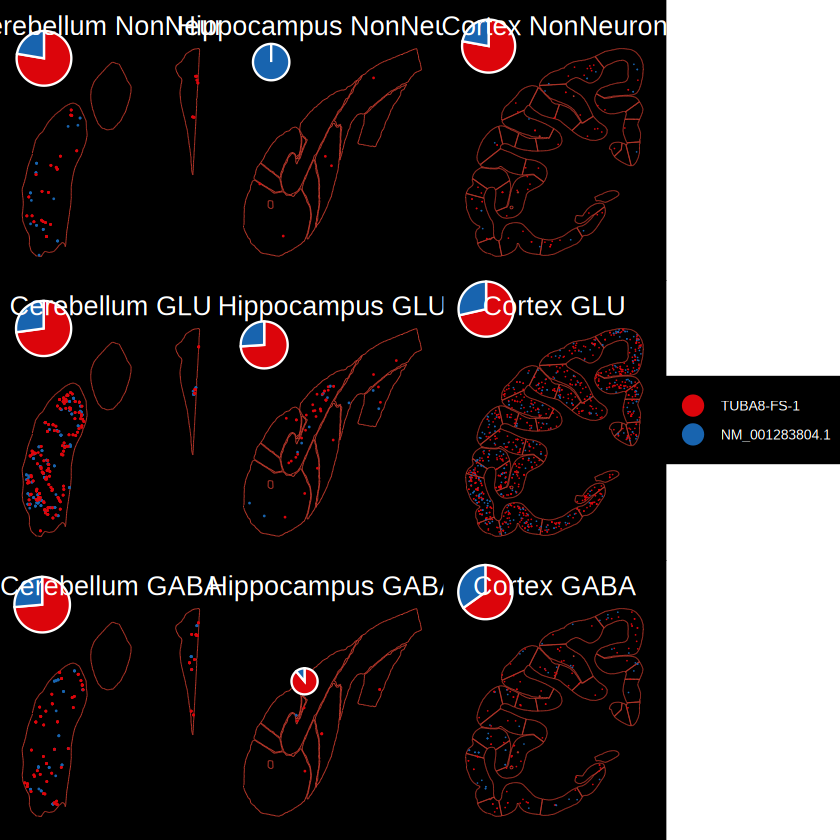

In [474]:
geneex = "TUBA8"
#mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("TUBA8-FS-1","NM_001283804.1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

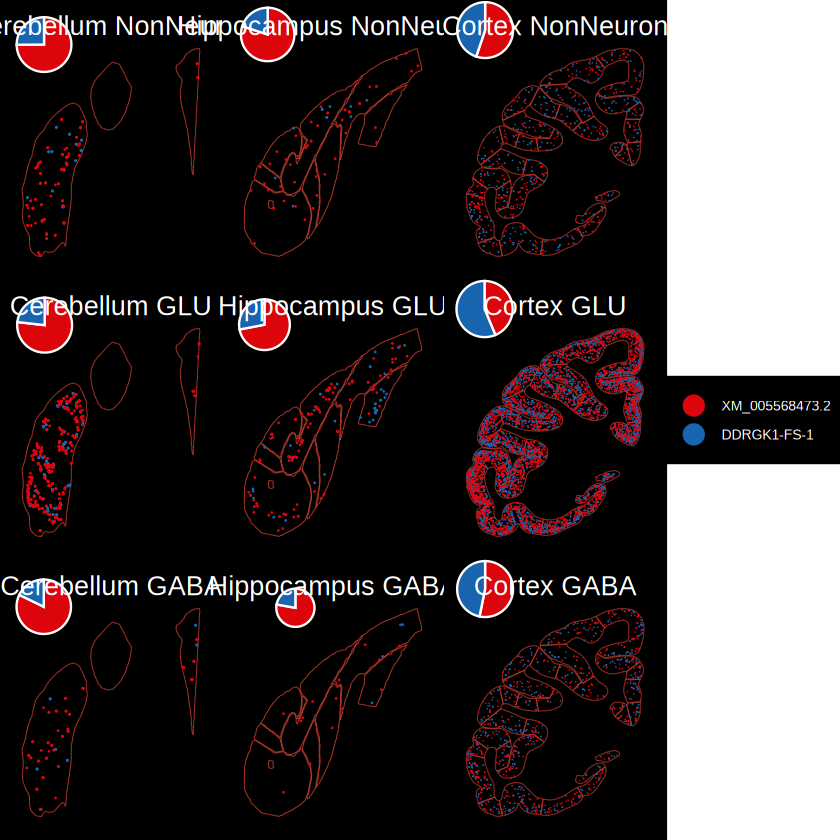

In [456]:
geneex = "DDRGK1"
#mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005568473.2","DDRGK1-FS-1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

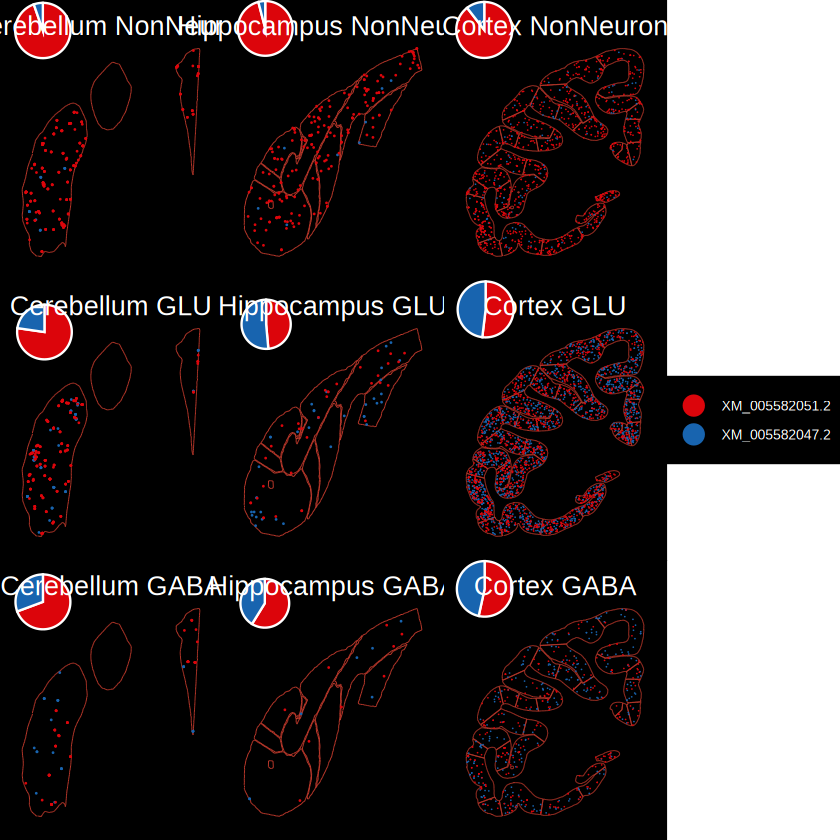

In [458]:
geneex = "NTRK2"
#mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005582051.2","XM_005582047.2")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


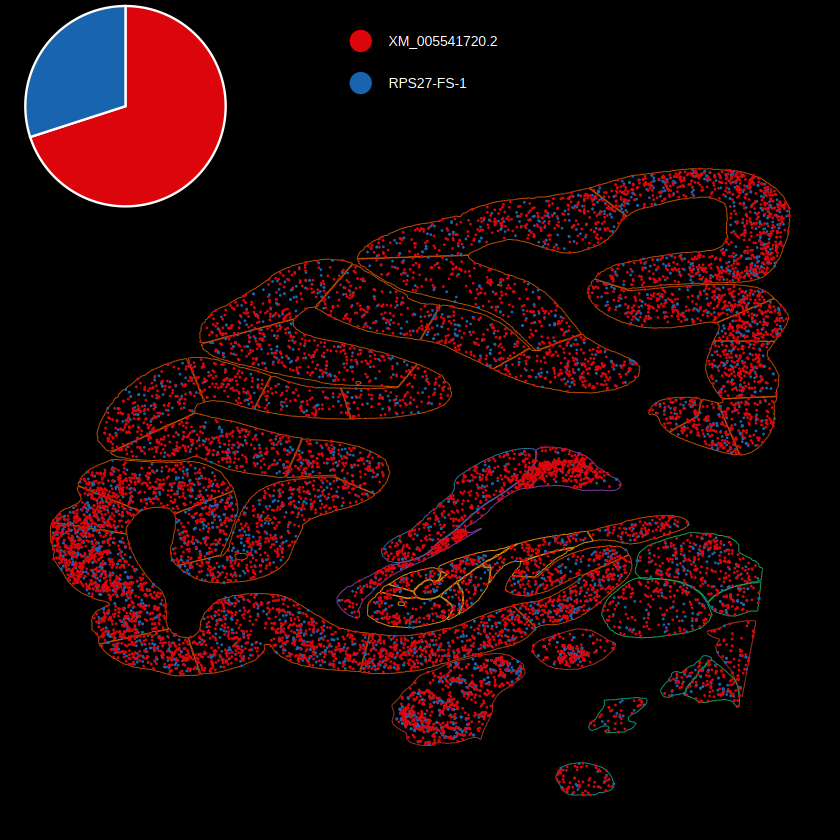

In [453]:
library(randomcoloR)
geneex = "RPS27"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005541720.2","RPS27-FS-1")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 0.5,mycolor)
pci

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


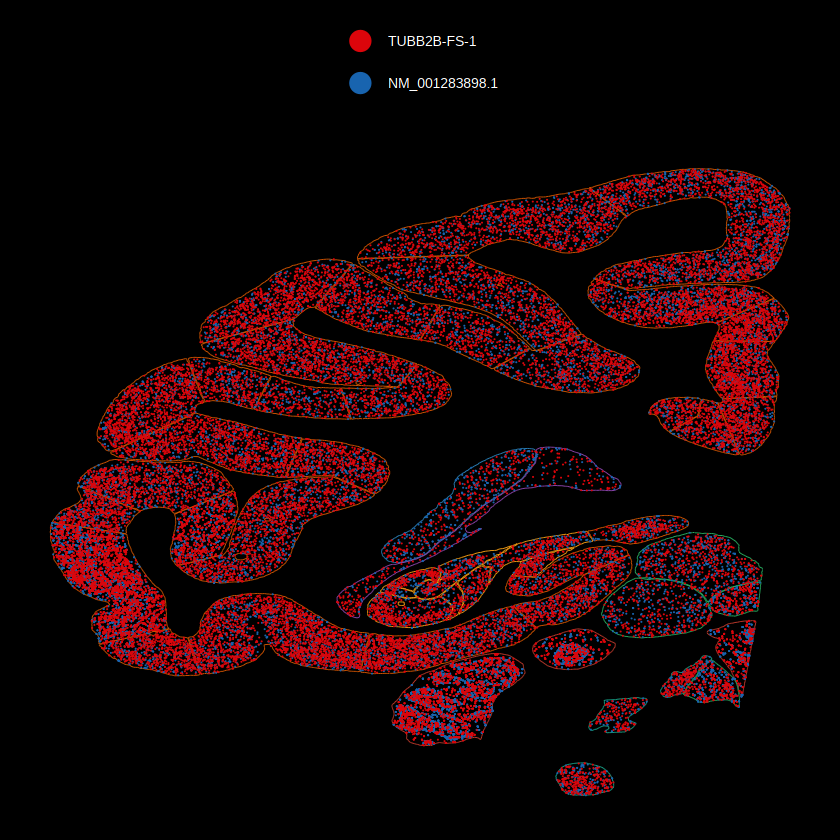

In [298]:
library(randomcoloR)
geneex = "TUBB2B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("TUBB2B-FS-1","NM_001283898.1")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 0.3,mycolor)
pci

In [299]:
# fsraw.cor.case = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",]
# edgesdf.zoom = edgesdf[edgesdf$subcortical == "Cerebellum",]
fsraw.cor.case2 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",]
edgesdf.zoom2 = edgesdf[edgesdf$subcortical == "Hippocampus",]
fsraw.cor.case3 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",]
edgesdf.zoom3 = edgesdf[edgesdf$subcortical == "Cortex",]

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

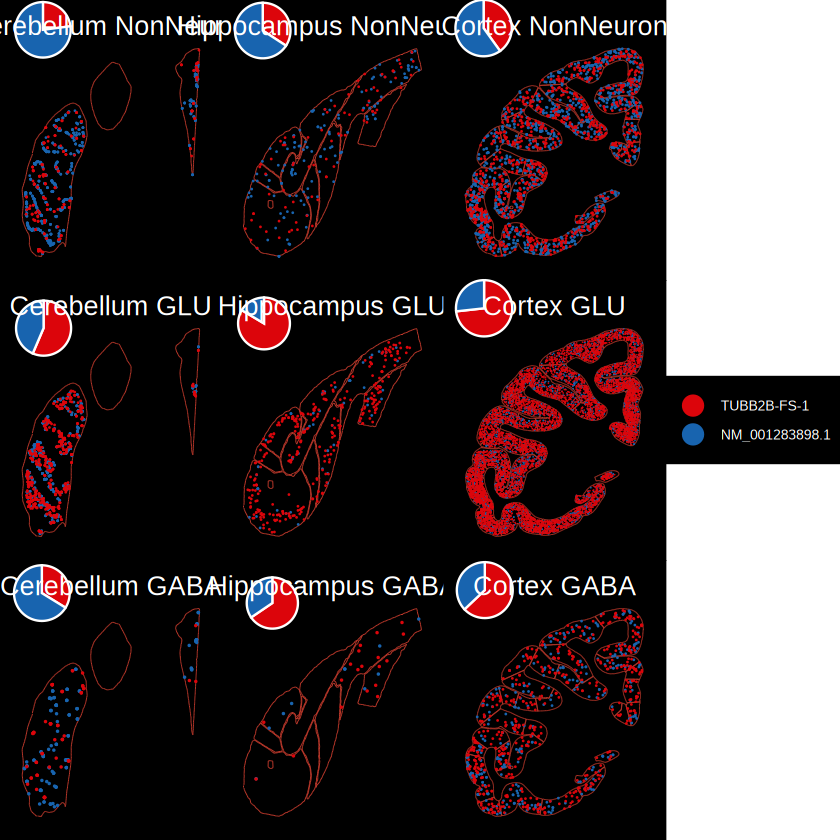

In [438]:
geneex = "TUBB2B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("TUBB2B-FS-1","NM_001283898.1")
# pci.zoom1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],geneex,hubtrans,edgesdf.zoom,ptsize = 1,mycolor)
# pci.zoom1
# pci.zoom2 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],geneex,hubtrans,edgesdf.zoom,ptsize = 1,mycolor)
# pci.zoom2
# pci.zoom3 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],geneex,hubtrans,edgesdf.zoom,ptsize = 1,mycolor)
# pci.zoom3
# pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$subclass == "Bergmann",],
#                        geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum Bergmann")
# pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$subclass == "ASC",],
#                        geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus ASC")
# pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$subclass == "ASC",],
#                        geneex,hubtrans,edgesdf.zoom3,ptsize = 0.5,mycolor) + ggtitle("Cortex ASC")
# pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
#                        geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
# pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
#                        geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
# pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
#                        geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.5,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
# pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
#                      pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,ncol = 3,nrow = 2,
#                      common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

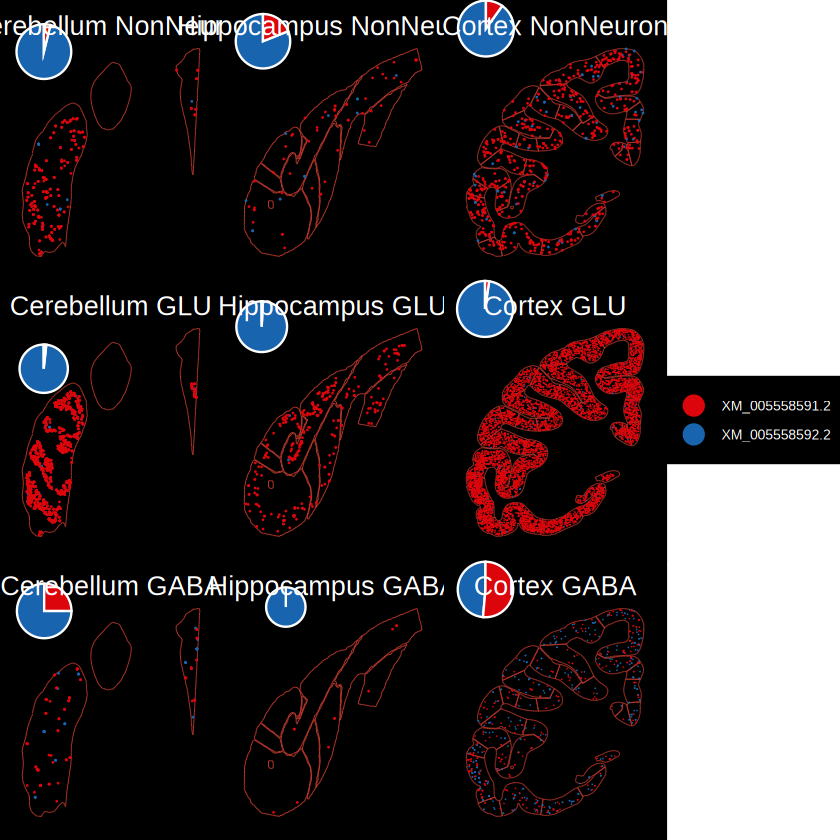

In [442]:
geneex = "CLTB"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005558591.2","XM_005558592.2")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.5,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
# pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
#                      pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,ncol = 3,nrow = 2,
#                      common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/cross_region_shift_DTU_case_SRSF5_25_11_05.pdf



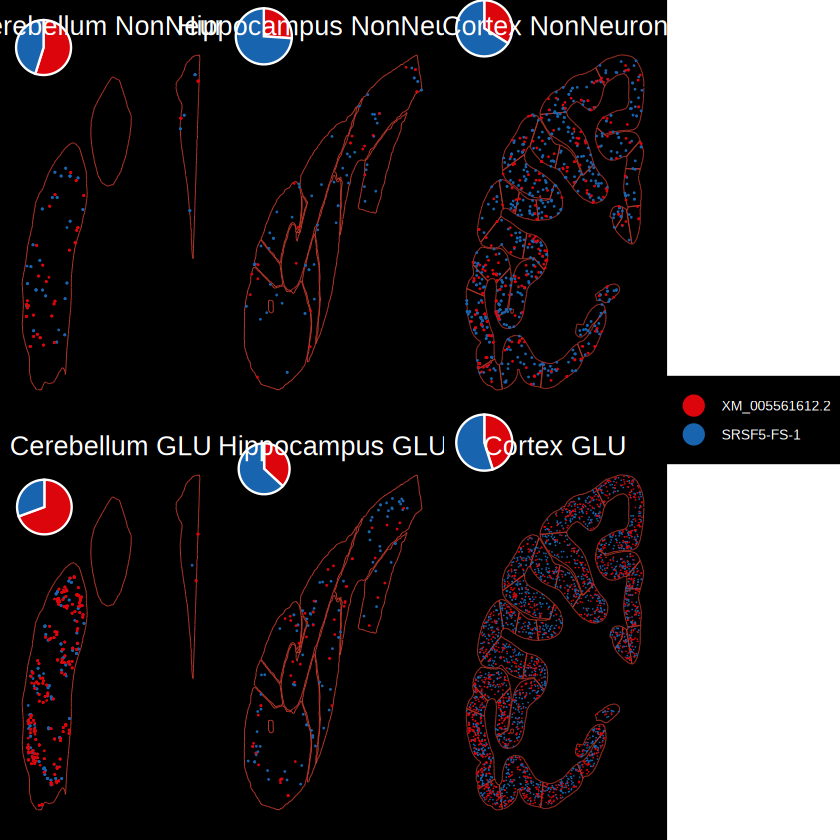

In [360]:
geneex = "SRSF5"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005561612.2","SRSF5-FS-1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.5,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,ncol = 3,nrow = 2,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 8,height = 6)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

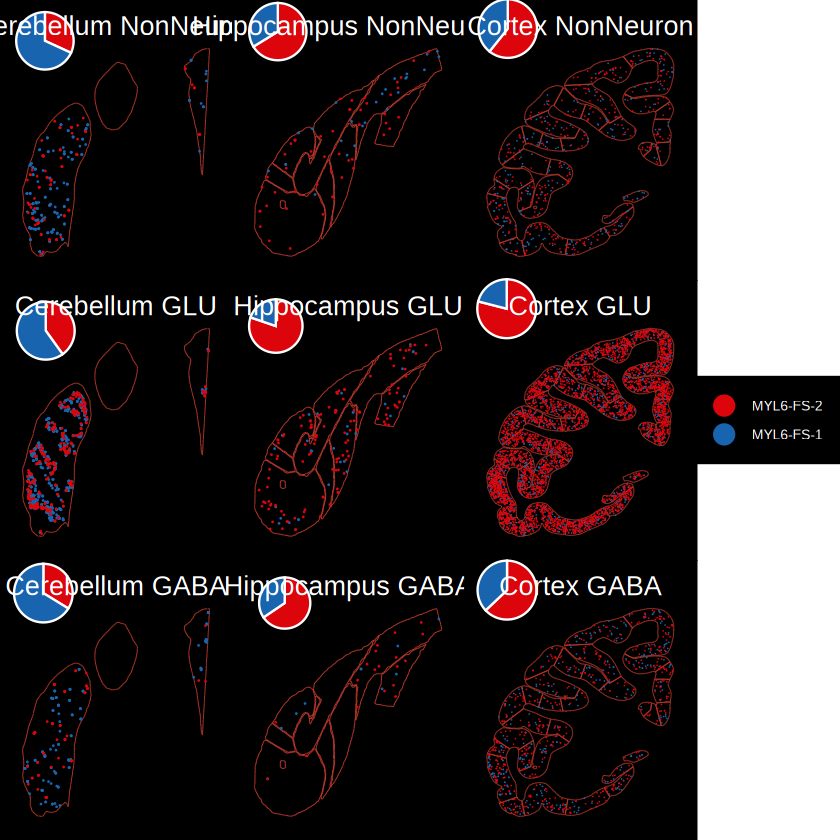

In [459]:
geneex = "MYL6"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("MYL6-FS-2","MYL6-FS-1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
#         width = 8,height = 6)
#pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

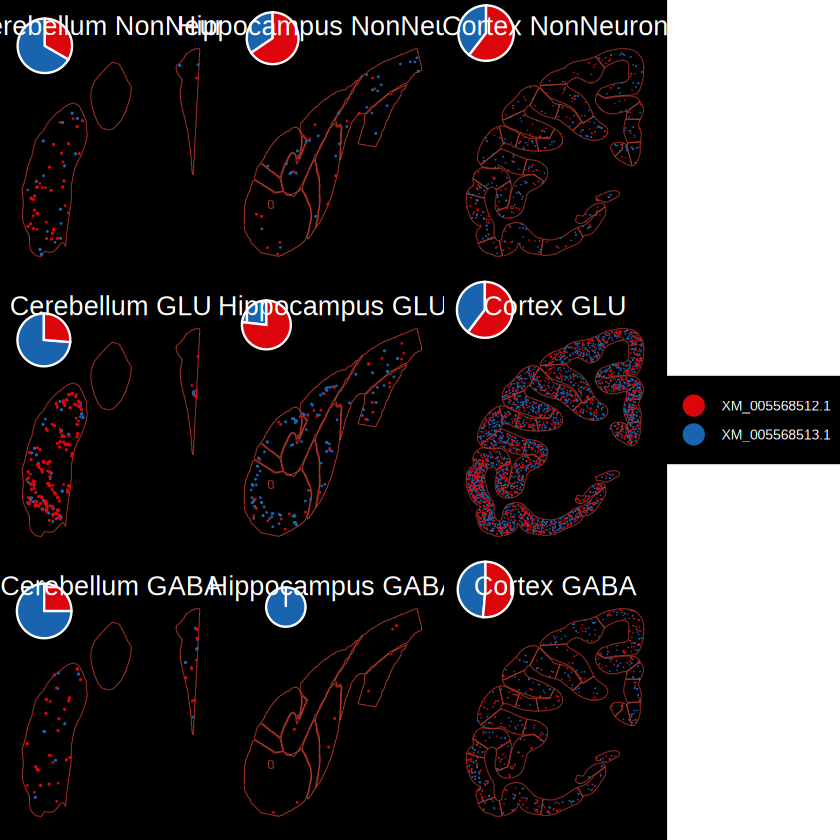

In [460]:
geneex = "IDH3B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005568512.1","XM_005568513.1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
#         width = 8,height = 6)
#pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

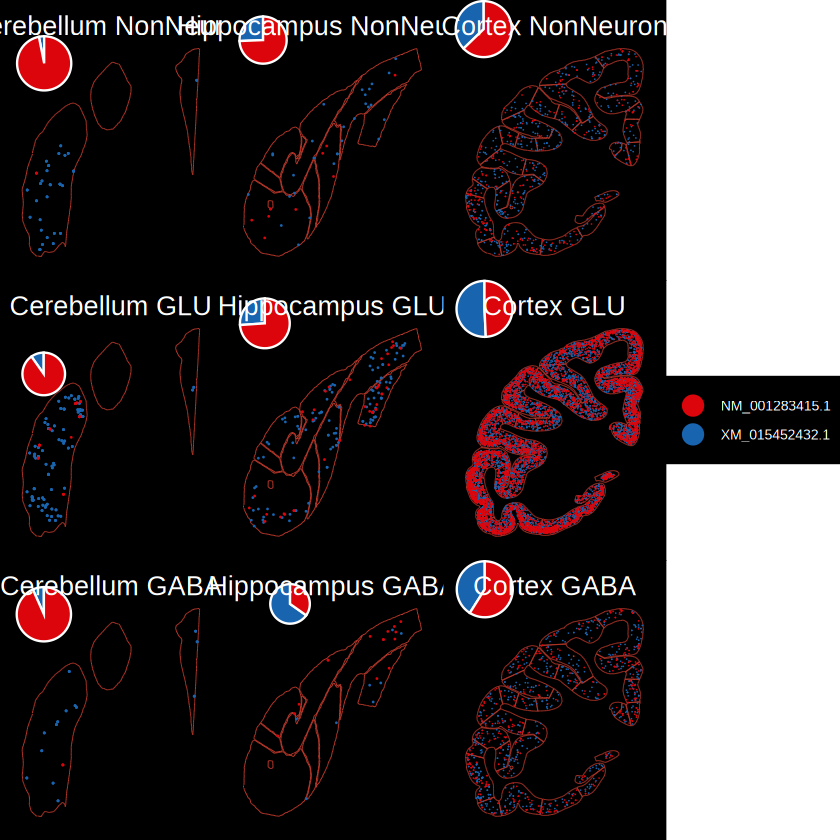

In [461]:
geneex = "ARPP19"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
#         width = 8,height = 6)
#pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


In [480]:
threld = 20
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$class,"-",fsraw.cor.sub$subclass)
transt.cl2 = FullLengthTranSt(fsraw.cor.sub,threld)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [529]:
#isosig.hp.sub[isosig.hp.sub$sig == "Up",] %>% group_by(areatr) %>% top_n(n = 2,wt = count)
isosig.cb.sub[isosig.cb.sub$sig == "Up",] %>% group_by(areatr) %>% top_n(n = 2,wt = count)

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
ATP5J,XM_015446616.1,ASC,52,58,0.8965517,0.7690736,0.7574846,0.1390671,Up,4.337161e-03,3.103208e-02
C7H14orf132,XM_015454192.1,Granule,559,612,0.9133987,0.8210014,0.7979021,0.1154966,Up,6.653152e-03,4.121709e-02
CALB1,NM_001284560.1,Purkinje,384,840,0.4571429,0.2884330,0.2462556,0.2108873,Up,2.948888e-07,1.664483e-05
CFL1,XM_005577224.2,UBC,84,115,0.7304348,0.6012227,0.5868658,0.1435690,Up,4.469824e-03,3.153709e-02
CHGB,XM_005568393.2,OPC,67,67,1.0000000,0.9038317,0.8942148,0.1057852,Up,2.432958e-03,2.130935e-02
EEF1B2,NM_001284704.1,Golgi,17,22,0.7727273,0.6324502,0.6090707,0.1636565,Up,7.357366e-03,4.449454e-02
FXYD1,XM_005588819.1,Bergmann,55,114,0.4824561,0.3333791,0.2588406,0.2236156,Up,1.053996e-03,1.029673e-02
HPCAL1,NM_001283164.1,PLI,11,34,0.3235294,0.2321601,0.2220079,0.1015215,Up,3.652186e-04,4.757207e-03
HPCAL1,XM_005576572.2,Choroid,22,24,0.9166667,0.7678399,0.7513036,0.1653631,Up,3.652186e-04,4.757207e-03


In [535]:
geneex = "C7H14orf132"
isocase = transt.cl2[transt.cl2$gene_id %in% geneex,]
#isocase = isocase[abs(isocase$dr) > 0.05,]
isocase[order(-isocase$count),]

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
C7H14orf132,XM_015454192.1,Cortex-GLU-L2/3,977,1056,0.92518939,0.9203251,0.92013805,0.005051348
C7H14orf132,XM_015454192.1,Cerebellum-GLU-Granule,559,612,0.91339869,0.9203251,0.92059153,-0.007192841
C7H14orf132,XM_015454192.1,Cortex-GLU-L3/4,550,594,0.92592593,0.9203251,0.92010972,0.005816208
C7H14orf132,XM_015454192.1,Cortex-GLU-L4/5,517,544,0.95036765,0.9203251,0.91916965,0.031197996
C7H14orf132,XM_015454192.1,Cortex-GLU-L2,443,475,0.93263158,0.9203251,0.91985181,0.012779771
C7H14orf132,XM_015454192.1,Cortex-GLU-L5/6,294,308,0.95454545,0.9203251,0.91900897,0.035536488
C7H14orf132,XM_015454192.1,Cortex-GLU-L2/3/4,197,219,0.89954338,0.9203251,0.92112443,-0.021581052
C7H14orf132,XM_015454192.1,Cortex-GLU-L4,187,197,0.94923858,0.9203251,0.91921308,0.030025502
C7H14orf132,XM_015454192.1,Cortex-GLU-L4/5/6,144,155,0.92903226,0.9203251,0.91999024,0.009042015


file saved to result/figure_revision/case_subcortical_subclass_isoform_rate_stat_pie_25_11_07.pdf



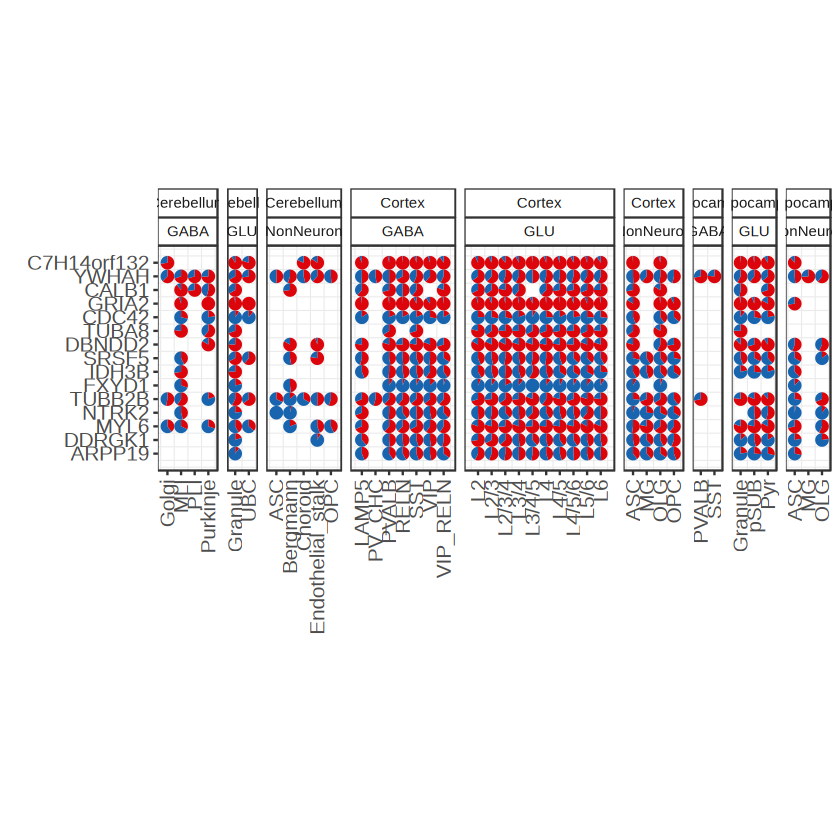

In [536]:
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","MYL6","NTRK2","TUBB2B","FXYD1",
            "IDH3B","SRSF5","DBNDD2","TUBA8","CDC42","GRIA2","CALB1","YWHAH","C7H14orf132")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "XM_005569136.2","XM_015429879.1","XM_015454192.1","XM_015454193.1",
             "XR_001487780.1","XM_005594227.2",
             "XM_015454768.1","NM_001284560.1","NM_001284100.1","XM_015456947.1",
             "TUBA8-FS-1","NM_001283804.1","NM_001283401.1","CDC42-FS-1",
             "XM_005556162.2","XM_005556163.2",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_005545480.2","XM_015444956.1",
             "XM_005588819.1","XM_005588818.2",
             "TUBB2B-FS-1","NM_001283898.1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005544192.2","XM_005544198.2",
             "MYL6-FS-2","MYL6-FS-1",
             "XM_005541224.2","XM_005541226.2",
             "GPX4-FS-2","XM_005587358.2",
             "NKX6-2-FS-1","NKX6-2-FS-3",
             "PDHA1-FS-1","XM_005593119.2",
             "XM_005541720.2","RPS27-FS-1",
            "XM_005567237.2","XM_005567239.2",
            "XM_015455847.1","XM_015455855.1",
            "XM_005576034.2","XM_005576035.2",
            "NM_001284957.1","RPL7A-FS-1",
            "XM_005561612.2","SRSF5-FS-1","XM_005582047.2","XM_005582051.2")
#caseg = colnames(isosigimx)
isosigi2 = transt.cl2
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans,]
casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative",fun.aggregate = sum)
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = unique(casectl$areatr)))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))


library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
#casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$sig = "Y"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
casectl$subcortical = MySplit(casectl$areatr,"-",1)
casectl$class = MySplit(casectl$areatr,"-",2)
casectl$subclass = MySplit(casectl$areatr,"-",3)

plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid, r = 0.5),
                      cols= colnames(casectl)[3:(3+ison-1)],color=NA) + 
      coord_fixed() +
      facet_grid(~ subcortical+class,space = "free",scale = "free") + 
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = casectl$subclass[!duplicated(casectl$areatr)]) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure_revision/case_subcortical_subclass_isoform_rate_stat_pie_25_11_07.pdf",width = 8,height = 6)

## Replicates analysis

In [6]:
fsraw.t42 = qread("data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")
fsraw.t47 = qread("data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")
head(fsraw.t47)
head(fsraw.t42)
isosigls.t42 = qread("data/dtu_analysis/T42_dtu_isoform_ls_fsraw_cor_25_12_01.qs")
isosigls.t47 = qread("data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_01.qs")

cidPos,readid,tranid,type,transcript_id,gene_id,sample,cell_label,gene_area,x,y,origin_name,cell_type,subclass,class,region,layer,group,subcortical
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10000_105826,read_6160281|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_105826,read_16822062|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_108587,read_5998725|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_108587,read_16660506|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_109072,read_6443305|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_109072,read_17105086|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex


cidPos,readid,tranid,type,sample,transcript_id,gene_id,V1,x,y,⋯,cell_id,cell_type_id,cell_type,subclass,class,global_region_id,origin_name,layer,region,subcortical
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>
10000_22991,read_239684|adapterG-adapterH|2088-2802(+),83152,compatible,T42_revo,XM_015438047.1,UNC119,515913347,10000,22991,⋯,NA,NA,,,,289,L-3a/b-l2,l2,3a/b,Cortex
10000_22991,read_8896334|adapterG-adapterH|2088-2802(+),83152,compatible,T42_revo,XM_015438047.1,UNC119,515913347,10000,22991,⋯,NA,NA,,,,289,L-3a/b-l2,l2,3a/b,Cortex
10000_23139,read_8525178|adapterE-adapterF|2211-3063(+),51661,compatible,T42_revo,XM_005555626.2,PAPSS1,278799601,10000,23139,⋯,594174,17,GLU L2/3.6 ART3/EMILIN3,L2/3,GLU,290,L-3a/b-l3,l3,3a/b,Cortex
10000_23139,read_17181828|adapterE-adapterF|2211-3063(+),51661,compatible,T42_revo,XM_005555626.2,PAPSS1,278799601,10000,23139,⋯,594174,17,GLU L2/3.6 ART3/EMILIN3,L2/3,GLU,290,L-3a/b-l3,l3,3a/b,Cortex
10000_23216,read_6325032|adapterD_RC|5464-5889(-),69651,compatible,T42_revo,XM_005586664.2,MBD2,515369179,10000,23216,⋯,NA,NA,,,,290,L-3a/b-l3,l3,3a/b,Cortex
10000_23216,read_14981682|adapterD_RC|5464-5889(-),69651,compatible,T42_revo,XM_005586664.2,MBD2,515369179,10000,23216,⋯,NA,NA,,,,290,L-3a/b-l3,l3,3a/b,Cortex


In [51]:
#calculate DTUs
transtls = list()

FullLengthTranSt = function(fs.info){
      transtl = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transtl = transtl[transtl$areatr != "" &
                          !is.na(transtl$areatr),]
      return(transtl)
}
    
CalSigIsoform = function(transt){
    transt = transt[!is.na(transt$areatr),]
    transt = transt[transt$areatr != "",]
    transt$relative = transt$count/transt$genecount
    #transtf = transt[transt$count > 5,]
    transtf = transt[transt$genecount > 20,]
    transtf = transtf %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
    transtf = transtf[which(transtf$meanrelative > 0.05),]

    arean = length(unique(transtf$areatr))

    #areanth = arean*(1/3)
   # print(areanth)
    transtf = transtf %>% group_by(transcript_id) %>% 
       filter(length(unique(areatr)) > 1)
    transtf = transtf %>% group_by(gene_id) %>% 
      filter(length(unique(transcript_id))>1)
    
    # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
    transtf$dr = transtf$relative - transtf$otherrelative
    transtf$sig = "N"
    table(transtf$sig)
    
    #transtf$pvalue = 1
    MyChiqTest = function(transcript_id, areatr, count){
      dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                       count = count)
      dat = dcast(dat, areatr~transcript_id,
                  value.var = "count",
                  fun.aggregate = sum)
      rownames(dat) = dat$areatr;dat = dat[-1]
      p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                   error = function(e) NA)
      return(p)
    }
    pvdf = transtf %>% group_by(gene_id) %>% summarise(pvalue = MyChiqTest(transcript_id, areatr, count))
    pvdf$padj = p.adjust(pvdf$pvalue,method = "BH")
    transtf = merge(transtf,pvdf,by = "gene_id")
    #print(head(transtf))
    # table(transtf[transtf$padj < 0.05,]$sig)
    #transtf[transtf$padj < 0.05,]$sig = "Y"
    transtf[which(transtf$dr > 0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Up"
    transtf[which(transtf$dr < -0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Down"
    return(transtf)
}

fsraw.t42$areatr = fsraw.t42$subcortical
transt = FullLengthTranSt(fsraw.t42)
isosig.t42 = CalSigIsoform(transt)

fsraw.t47$areatr = fsraw.t47$subcortical
transt = FullLengthTranSt(fsraw.t47)
isosig.t47 = CalSigIsoform(transt)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 874 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAMDC"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 873 remaining warnings."
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2180 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AACS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2179 remaining warnings."


In [26]:
fsraw.t42$areatr = fsraw.t42$subcortical
isosigt.t42 = fsraw.t42[fsraw.t42$areatr != "",] %>% group_by(areatr,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
isosigt.t42 = isosigt.t42 %>% group_by(transcript_id) %>% 
              mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1),
                dr = relative - otherrelative)


fsraw.t47$areatr = fsraw.t47$subcortical
isosigt.t47 = fsraw.t47[fsraw.t47$areatr != "",] %>% group_by(areatr,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
isosigt.t47 = isosigt.t47 %>% group_by(transcript_id) %>% 
              mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1),
                dr = relative - otherrelative)

`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.


In [42]:
library(alphahull)
areaedges = NULL

refpos = unique(fsraw.t42[,c("x","y","region","layer","subcortical")])
refpos = refpos[order(refpos$subcortical),]
areaorder = unique(refpos$region)
nrow(refpos)
for (areai in areaorder) {
    print(areai)
    reftmp = refpos[refpos$region == areai,]
    reftmp = unique(reftmp[c("x","y")])
    myalpha = ashape(reftmp,alpha = 200)
    areaedgei = as.data.frame(myalpha$edges)
    areaedgei$areaid = areai
    areaedges = rbind(areaedges,areaedgei)
}
# areaedges = myrange$areaedges
# areaedges = areaedges[areaedges$areaid %in% refpos$region,]
qsave(areaedges,file = paste0("ref/areaedge_density_T42_12_02.qs"))


In [7]:
library(alphahull)
areaedges = NULL

refpos = unique(fsraw.t47[,c("x","y","region","layer","subcortical")])
refpos = refpos[order(refpos$subcortical),]
refpos = refpos[sample(1:nrow(refpos),size = nrow(refpos)/3),]
areaorder = unique(refpos$region)
nrow(refpos)
for (areai in areaorder) {
    print(areai)
    reftmp = refpos[refpos$region == areai,]
    reftmp = unique(reftmp[c("x","y")])
    myalpha = ashape(reftmp,alpha = 200)
    areaedgei = as.data.frame(myalpha$edges)
    areaedgei$areaid = areai
    areaedges = rbind(areaedges,areaedgei)
}
# areaedges = myrange$areaedges
# areaedges = areaedges[areaedges$areaid %in% refpos$region,]
qsave(areaedges,file = paste0("ref/areaedge_density_T47_12_02.qs"))



Attaching package: 'alphahull'


The following object is masked from 'package:Biostrings':

    complement




[1] 7812677

[1] "IPa"
[1] "DG"
[1] "STGr"
[1] "RM"
[1] "F1"
[1] "lCla"
[1] "AV"
[1] "pu"
[1] "VLa"
[1] "36c"
[1] "preS"
[1] "TEav"
[1] "Id"
[1] "Ig"
[1] "CA1"
[1] "3a/b"
[1] "TEad"
[1] "24c'"
[1] "EC"
[1] "lv"
[1] "CA4"
[1] "cd"
[1] "RPB"
[1] "SII"
[1] "TPO"
[1] "VA"
[1] "r"
[1] "TEa"
[1] "CA3"
[1] "vCla"
[1] "Pcn"
[1] "zic"
[1] "exc"
[1] "TEm"
[1] "24b'"
[1] "SN"
[1] "TAa"
[1] "1/2"
[1] "GPi"
[1] "CA2"
[1] "GPe"
[1] "Sub"
[1] "STN"
[1] "Rh"
[1] "AL"
[1] "24a'"
[1] "R"
[1] "MV"
[1] "tCla"
[1] "mCla"
[1] "ven"
[1] "AM"
[1] "ec"
[1] "PHA"
[1] "dCla"
[1] "PGa"
[1] "VM"
[1] "dor"
[1] "paraS"
[1] "35"
[1] "CeM"
[1] "LHA"
[1] "proS"
[1] "shCla"
[1] "AHA'"
[1] "lat"
[1] "MM"
[1] "AD"
[1] "LM"
[1] "Pa"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message:
"Removed 374694 rows containing missing values or values outside the scale range
(`geom_scattermore()`)."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message:
"Removed 374694 rows containing missing values or values outside the scale range
(`geom_scattermore()`)."
file saved to result/figure6_other_cmp/T47_annotation_subcortical_25_12_10.pdf



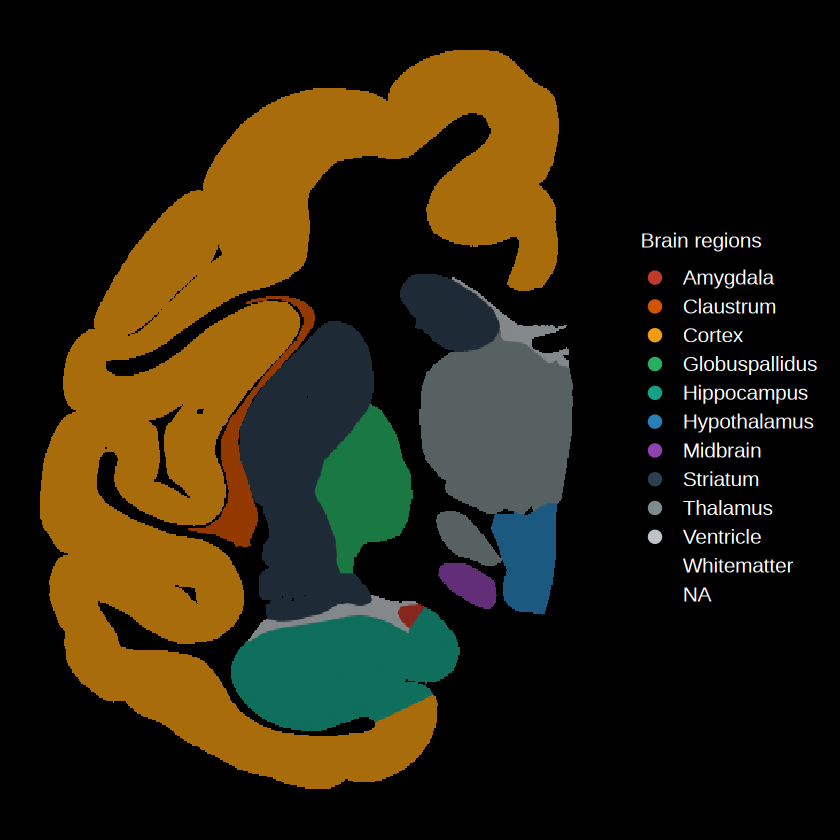

In [48]:
raster.dpi=c(512, 512)
refpos = unique(fsraw.t47[,c("x","y","subcortical")])

psubrgno = ggplot() +
    scattermore::geom_scattermore(
      data = refpos,
      aes(x, y, color = subcortical),
      pixels = raster.dpi,
      pointsize = 0.7
    ) +
    # geom_point(data = refpos,
    #            aes(x, y, color = arealayer),size = 0.01) + 
    # geom_text(data = reflabel, aes(y = ymid, x = xmid, label= areaid),
    #           color = "white") +
    scale_color_flatui() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Brain regions")) +
    theme_presentation() + scale_x_reverse()
psubrgno
ggexport(psubrgno,filename = "result/figure6_other_cmp/T47_annotation_subcortical_25_12_10.pdf",width = 6,height = 6)


refpos = unique(fsraw.t42[,c("x","y","subcortical")])
psubrgno = ggplot() +
    scattermore::geom_scattermore(
      data = refpos,
      aes(x, y, color = subcortical),
      pixels = raster.dpi,
      pointsize = 0.7
    ) +
    # geom_point(data = refpos,
    #            aes(x, y, color = arealayer),size = 0.01) + 
    # geom_text(data = reflabel, aes(y = ymid, x = xmid, label= areaid),
    #           color = "white") +
    scale_color_flatui() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Brain regions")) +
    theme_presentation() + scale_x_reverse() + scale_y_reverse()
psubrgno
ggexport(psubrgno,filename = "result/figure6_other_cmp/T42_annotation_subcortical_25_12_10.pdf",width = 6,height = 6)

,areatr,gene_id,1,2,3,groupid,geneidn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Cerebellum,ARPP19,0.1428571,0.07142857,0,3,1
2,Cerebellum,DDRGK1,0.1355932,0.86440678,0,3,2
3,Cerebellum,FXYD1,0.4084507,0.59154930,0,3,10
4,Cerebellum,IDH3B,0.6567164,0.25373134,0,3,7
5,Cerebellum,NKX6-2,0.5714286,0.00000000,0,3,9
6,Cerebellum,PDHA1,0.0000000,1.00000000,0,3,11


file saved to result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T42.pdf



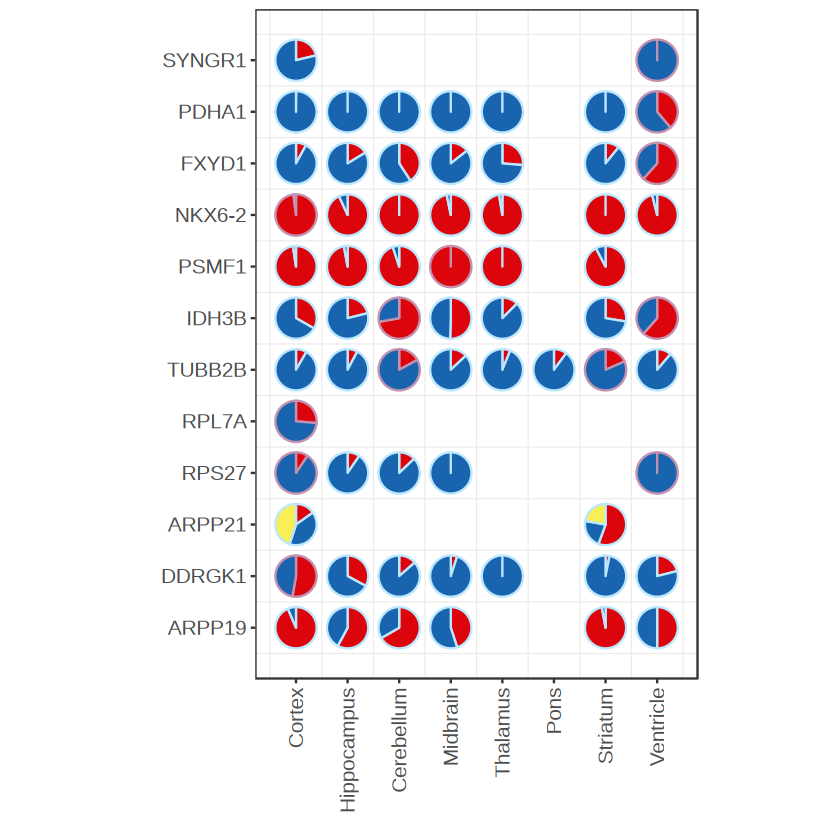

In [31]:
#case plot
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","ARPP21","RPS27","RPL7A","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
#caseg = colnames(isosigimx)
isosigi2 = isosigt.t42
suborder = c("Cortex","Hippocampus","Cerebellum","Midbrain","Thalamus","Pons","Striatum","Ventricle")
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans & isosigi2$genecount > 20,]

casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = suborder))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$major = 'Yes'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")

highlight = c("DDRGK1-Cortex","RPS27-Cortex","RPS27-Ventricle","RPL7A-Cortex",
              "TUBB2B-Cerebellum","TUBB2B-Striatum",
              "IDH3B-Cerebellum","IDH3B-Pons","IDH3B-Ventricle",
              "PSMF1-Midbrain","NKX6-2-Cortex",
              "FXYD1-Ventricle",
              "SYNGR1-Ventricle",
             "PDHA1-Ventricle")
casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$major = "No"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
xlabel = suborder
plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid,color = major,
                                           r = 0.4),
                      cols= colnames(casectl)[3:(3+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = xlabel) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("#C492B1","#BCE7FD")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T42.pdf",width = 7,height = 4)


,areatr,gene_id,1,2,3,groupid,geneidn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Amygdala,TUBB2B,0.1596639,0.84033613,0.0000000,7,6
2,Claustrum,ARPP19,0.8043478,0.05652174,0.0000000,10,1
3,Claustrum,ARPP21,0.0000000,0.35294118,0.1470588,10,3
4,Claustrum,DDRGK1,0.3402778,0.65972222,0.0000000,10,2
5,Claustrum,FXYD1,0.1449275,0.85507246,0.0000000,10,10
6,Claustrum,IDH3B,0.2500000,0.68243243,0.0000000,10,7


file saved to result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T47.pdf



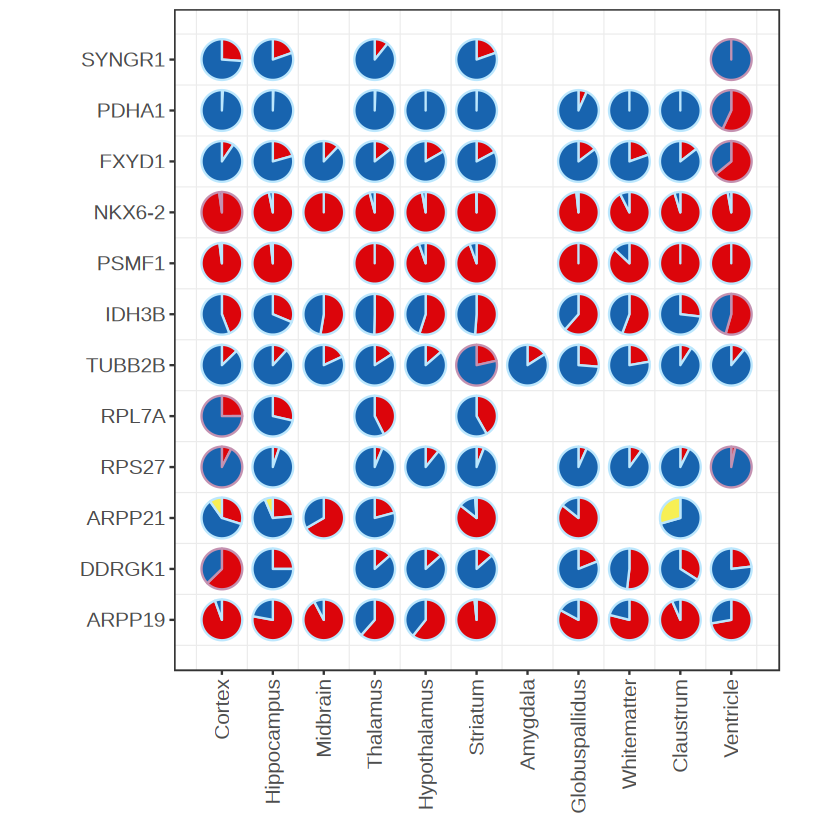

In [34]:
#case plot
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","ARPP21","RPS27","RPL7A","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
#caseg = colnames(isosigimx)
isosigi2 = isosigt.t47
suborder = c('Cortex','Hippocampus','Midbrain','Thalamus','Hypothalamus','Striatum',
             'Amygdala','Globuspallidus','Whitematter','Claustrum','Ventricle')
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans & isosigi2$genecount > 20,]

casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = suborder))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$major = 'Yes'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")

highlight = c("DDRGK1-Cortex","RPS27-Cortex","RPS27-Ventricle","RPL7A-Cortex",
              "TUBB2B-Cerebellum","TUBB2B-Striatum",
              "IDH3B-Cerebellum","IDH3B-Pons","IDH3B-Ventricle",
              "PSMF1-Midbrain","NKX6-2-Cortex",
              "FXYD1-Ventricle",
              "SYNGR1-Ventricle",
             "PDHA1-Ventricle")
casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$major = "No"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
xlabel = suborder
plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid,color = major,
                                           r = 0.4),
                      cols= colnames(casectl)[3:(3+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = xlabel) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("#C492B1","#BCE7FD")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T47.pdf",width = 7,height = 4)


In [26]:
areaedges.t47 = qread(file = paste0("ref/areaedge_density_T47_12_02.qs"))
areaedges.t42 = qread(file = paste0("ref/areaedge_density_T42_12_02.qs"))
head(areaedges.t47)
edgesdf = areaedges.t47
suban = unique(fsraw.t47[sample(1:nrow(fsraw.t47),10000),c("region","subcortical")])
edgesdf = merge(edgesdf,suban,by.x = "areaid",by.y = "region")
head(edgesdf)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,49868,4534,44481,52614,44486,52552,45046.11,52628.37,44498.80,52584.23,0,0,IPa
2,49868,31959,44481,52614,44483,52678,44510.17,52645.12,45046.11,52628.37,0,0,IPa
3,72829,4534,44490,52506,44486,52552,44491.75,52529.33,45851.22,52647.54,0,0,IPa
4,55551,72829,44490,52485,44490,52506,44534.50,52495.50,44727.50,52495.50,0,0,IPa
5,47032,23675,44474,52843,44478,52754,44674.25,52807.41,44613.10,52804.66,0,0,IPa
6,10567,40670,44475,52887,44473,52918,44463.83,52901.84,49924.40,53254.14,0,0,IPa


,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,34845,64476,54733,82600,54787,82630,54333.65,83382.42,54717.50,82691.50,0,0,Cortex
2,1/2,34845,40137,54733,82600,54682,82576,54697.12,82610.07,54333.65,83382.42,0,0,Cortex
3,1/2,35416,10997,54396,82466,54305,82417,54317.55,82502.70,54121.58,82866.64,0,0,Cortex
4,1/2,18398,64476,54850,82663,54787,82630,54784.78,82710.87,54036.53,84139.35,0,0,Cortex
5,1/2,18398,9806,54850,82663,54887,82684,54036.53,84139.35,54860.03,82688.43,0,0,Cortex
6,1/2,14100,9806,54934,82705,54887,82684,54890.74,82738.72,21983.05,156389.27,0,0,Cortex


In [22]:
SpCasePlot = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    # hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]

    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      theme_void() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()  + ggtitle(geneex)
    return(pmkpti1)
}

In [46]:
hubgene = c("ARPP19","DDRGK1","RPS27","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1","RPL7A","ARPP21")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
edgesdf = areaedges.t42
suban = unique(fsraw.t42[sample(1:nrow(fsraw.t42),10000),c("region","subcortical")])
edgesdf = merge(edgesdf,suban,by.x = "areaid",by.y = "region")
head(edgesdf)
plmkt.sp = list()
# for (i in c(1,2,4)) {
#     print(hubgene[i])
#     plmkt.sp[[i]] = SpCasePlot(fsraw.t42,
#                                hubgene[i],hubtrans,ptsize = 0.5,mycolor,0.5)
# }
plmkt.sp = list()
for (i in c(4)) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.t42,
                               hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor,0.5)
}

for (i in c(1:3,5:length(hubgene))) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.t42,hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor = mycolor)
}
plmkt.spt = ggarrange(plotlist = plmkt.sp,ncol = 8,nrow = 2)
ggexport(plmkt.spt,filename = "result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_total_case_T42_25_12_08.pdf", 
         width = 12/4*8,height = 16/3*2)

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,528351,294999,9934,33790,9975,33787,9951.227,33743.77,9847.967,32332.55,0,0,Cortex
2,1/2,295627,296264,10061,33787,10171,33786,10114.986,33674.95,10113.879,33553.16,0,0,Cortex
3,1/2,293573,293587,9814,33805,9815,33805,9814.500,33809.00,9814.500,33422.33,0,0,Cortex
4,1/2,521226,283544,8668,33706,8624,33657,8798.255,33544.78,8676.158,33654.42,0,0,Cortex
5,1/2,292436,527158,9689,33815,9726,33815,9707.500,33804.95,9707.500,33469.50,0,0,Cortex
6,1/2,520410,520246,8544,33355,8524,33281,9217.421,33133.29,8596.770,33301.04,0,0,Cortex


[1] "TUBB2B"
[1] "ARPP19"
[1] "DDRGK1"
[1] "RPS27"
[1] "IDH3B"
[1] "PSMF1"
[1] "NKX6-2"
[1] "FXYD1"
[1] "PDHA1"
[1] "SYNGR1"
[1] "RPL7A"
[1] "ARPP21"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

In [38]:
intersect(colnames(fsrawt.hub),colnames(fsraw.t42))
colnames(fsraw.t42)

[1] "cidPos"           "readid"           "tranid"           "type"            
 [5] "sample"           "transcript_id"    "gene_id"          "V1"              
 [9] "x"                "y"                "cell_label"       "gene_area"       
[13] "cell_id"          "cell_type_id"     "cell_type"        "subclass"        
[17] "class"            "global_region_id" "origin_name"      "layer"           
[21] "region"           "subcortical"

[1] "cidPos"           "readid"           "tranid"           "type"            
 [5] "sample"           "transcript_id"    "gene_id"          "V1"              
 [9] "x"                "y"                "cell_label"       "gene_area"       
[13] "cell_id"          "cell_type_id"     "cell_type"        "subclass"        
[17] "class"            "global_region_id" "origin_name"      "layer"           
[21] "region"           "subcortical"

In [45]:
fsrawt.t42 = qread("data/reads_full_anotation/T42_main_data_read_total_annotation_nodelete_total_25_12_01.qs")
fsrawt.hub = fsrawt.t42[fsrawt.t42$gene_id == "ARPP19",]
fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "NM_001283415.1" | sum(transcript_id %in% "NM_001283415.1") == 0)
nrow(fsraw.t42)
fsraw.t42 = rbind(fsraw.t42[fsraw.t42$gene_id != "ARPP19",],fsrawt.hub)
nrow(fsraw.t42)

fsrawt.hub = fsrawt.t42[fsrawt.t42$gene_id %in% "RTN1",]
fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "XM_005561388.2" | sum(transcript_id %in% "XM_005561388.2") == 0)
fsraw.t42 = rbind(fsraw.t42[fsraw.t42$gene_id != "RTN1",],fsrawt.hub)
nrow(fsraw.t42)

qsave(fsraw.t42,"data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_hubselect_25_12_10.qs")

[1] 15270278

[1] 15311204

[1] 15342614

In [42]:
fsrawt.t47 = qread("data/reads_full_anotation/T47_main_data_read_total_annotation_nodelete_total_25_12_01.qs")
fsrawt.hub = fsrawt.t47[fsrawt.t47$gene_id == "ARPP19",]
fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "NM_001283415.1" | sum(transcript_id %in% "NM_001283415.1") == 0)
nrow(fsraw.t47)
fsraw.t47 = rbind(fsraw.t47[fsraw.t47$gene_id != "ARPP19",],fsrawt.hub)
nrow(fsraw.t47)

# fsrawt.hub = fsrawt.t47[fsrawt.t47$gene_id %in% "RTN1",]
# fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "XM_005561388.2" | sum(transcript_id %in% "XM_005561388.2") == 0)
# nrow(fsraw.t47)
# fsraw.t47 = rbind(fsraw.t47[fsraw.t47$gene_id != "RTN1",],fsrawt.hub)
# nrow(fsraw.t47)

qsave(fsraw.t47,"data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_hubselect_25_12_10.qs")

[1] 43585333

[1] 43757646

In [44]:
SpCasePlot2 = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    # hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]

    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      theme_void() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_x_reverse()  + ggtitle(geneex)
    return(pmkpti1)
}

edgesdf = areaedges.t47
suban = unique(fsraw.t47[sample(1:nrow(fsraw.t47),10000),c("region","subcortical")])
edgesdf = merge(edgesdf,suban,by.x = "areaid",by.y = "region")
head(edgesdf)
plmkt.sp = list()

for (i in c(4)) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot2(fsraw.t47,
                               hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor,0.2)
}

for (i in c(1:3,5:length(hubgene))) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot2(fsraw.t47,hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor = mycolor)
}

plmkt.spt = ggarrange(plotlist = plmkt.sp,ncol = 8,nrow = 2)
ggexport(plmkt.spt,filename = "result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_total_case_T47_25_12_08.pdf", 
         width = 12/4*8,height = 16/3*2)

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,34845,64476,54733,82600,54787,82630,54333.65,83382.42,54717.50,82691.50,0,0,Cortex
2,1/2,34845,40137,54733,82600,54682,82576,54697.12,82610.07,54333.65,83382.42,0,0,Cortex
3,1/2,35416,10997,54396,82466,54305,82417,54317.55,82502.70,54121.58,82866.64,0,0,Cortex
4,1/2,18398,64476,54850,82663,54787,82630,54784.78,82710.87,54036.53,84139.35,0,0,Cortex
5,1/2,18398,9806,54850,82663,54887,82684,54036.53,84139.35,54860.03,82688.43,0,0,Cortex
6,1/2,14100,9806,54934,82705,54887,82684,54890.74,82738.72,21983.05,156389.27,0,0,Cortex


[1] "TUBB2B"
[1] "ARPP19"
[1] "DDRGK1"
[1] "RPS27"
[1] "IDH3B"
[1] "PSMF1"
[1] "NKX6-2"
[1] "FXYD1"
[1] "PDHA1"
[1] "SYNGR1"
[1] "RPL7A"
[1] "ARPP21"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maxi

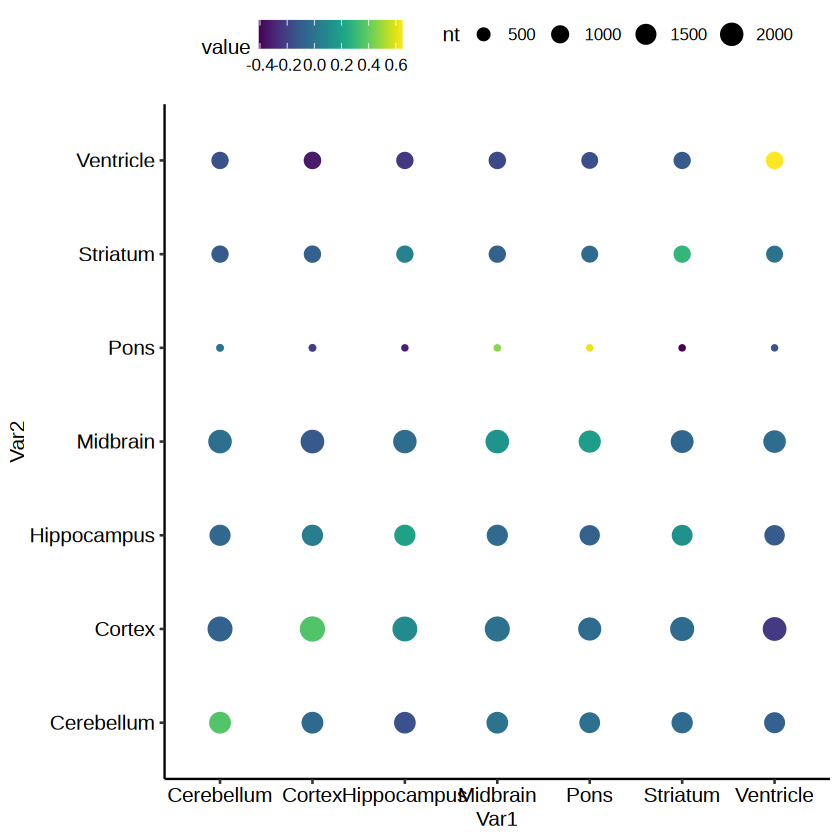

In [85]:
#calculate jaccard score
isosigi = isosigls$subcortical
# isosig.t42
# isosig.t47
jaccard_similarity <- function(vec1, vec2) {
  intersection <- length(intersect(vec1, vec2))
  union <- length(union(vec1, vec2))
  return(intersection/union)
}

isosigi1 = isosigi
isosigi2 = isosig.t42

DTUJaccard = function(isosigi1,isosigi2){
    comarea = intersect(isosigi1$areatr,isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea)){
        for(j in 1:length(comarea)){
            df1 = isosigi1[isosigi1$areatr == comarea[i],]
            df2 = isosigi2[isosigi2$areatr == comarea[j],]
            comgene = intersect(df1$gene_id,df2$gene_id)
            df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            vec1 = paste0(df1$transcript_id,"-",df1$sig)
            vec2 = paste0(df2$transcript_id,"-",df2$sig)
            nt = length(comgene)
            nt1 = length(vec1)
            nt2 = length(vec2)
            jcv = jaccard_similarity(vec1,vec2)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea[i],"Var2" = comarea[j],"value" = jcv,
                                         "nt" = nt,"nt" = nt1,"nt" = nt2))
        }
    }
    return(jcdf)
}


DTUCormx = function(isosigi1,isosigi2){
    comarea = unique(intersect(isosigi1$areatr,isosigi2$areatr))
    jcdf = NULL
    for(i in 1:length(comarea)){
        for(j in 1:length(comarea)){
            df1 = isosigi1[isosigi1$areatr == comarea[i],]
            df2 = isosigi2[isosigi2$areatr == comarea[j],]
            # comgene = intersect(df1$gene_id,df2$gene_id)
            # df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            # df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            df = merge(df1[,c("transcript_id","dr")],df2[,c("transcript_id","dr")],by = "transcript_id")
            nt = nrow(df)
            corv = cor(df$dr.x,df$dr.y)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea[i],"Var2" = comarea[j],"value" = corv,
                                         "nt" = nt))
        }
    }
    return(jcdf)
}

jcdf = DTUCormx(isosigi,isosig.t42)
ggplot(jcdf,aes(x = Var1,y = Var2, color = value,size = nt)) + geom_point() + scale_color_viridis() + theme_pubr()

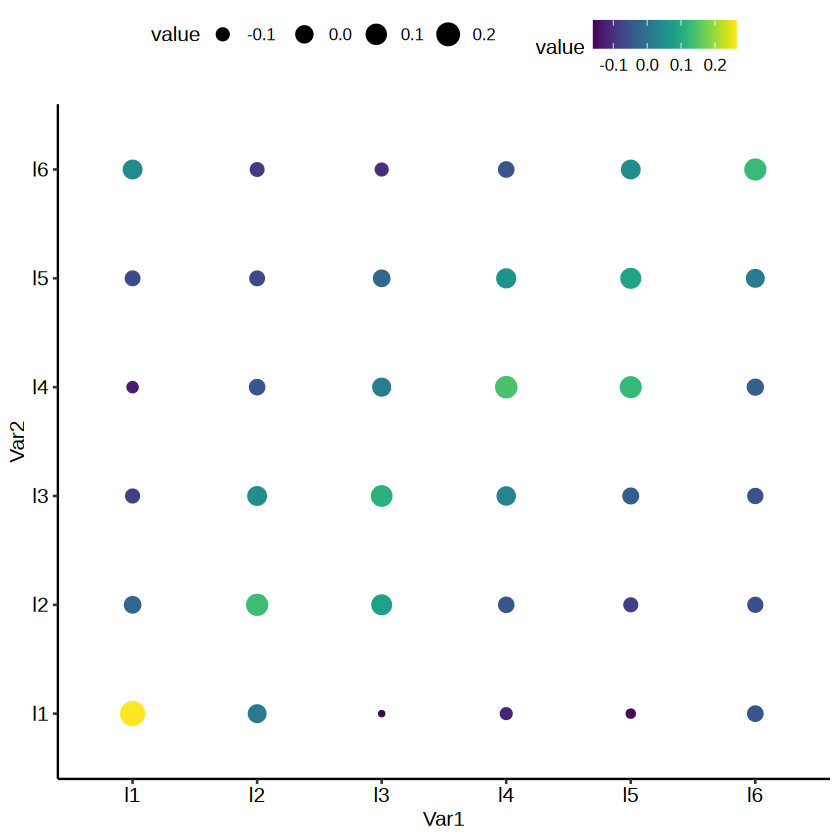

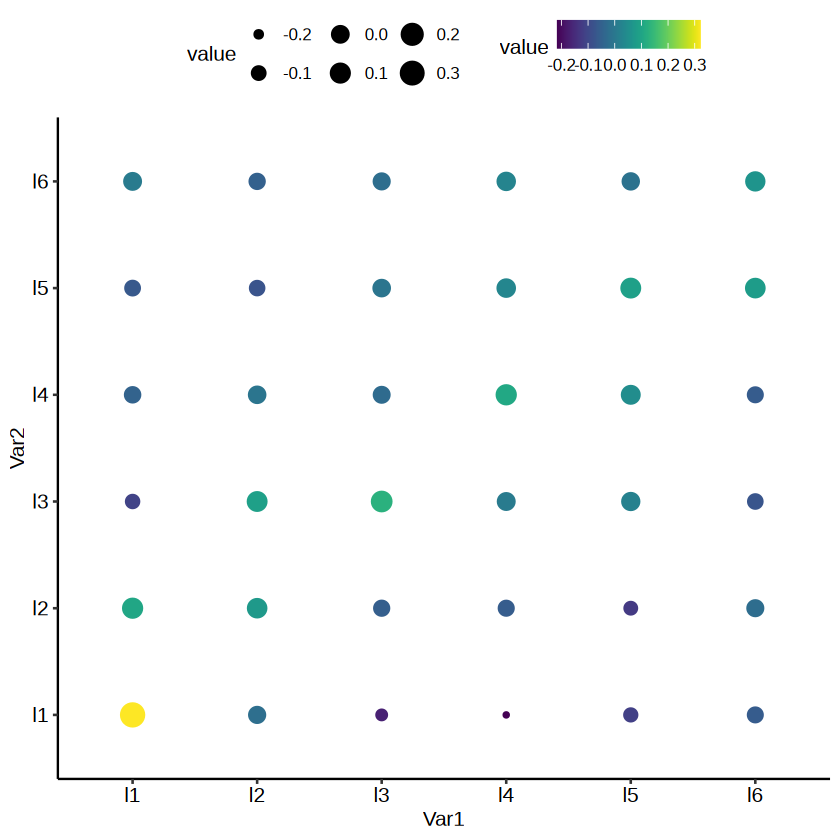

In [86]:
jcdf1 = DTUCormx(isosigls$layer,isosigls.t47$layer)
ggplot(jcdf1,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + scale_color_viridis() + theme_pubr()

jcdf2 = DTUCormx(isosigls$layer,isosigls.t42$layer)
ggplot(jcdf2,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + scale_color_viridis() + theme_pubr()

In [82]:
jcdf1
jcdf2

Var1,Var2,value,nt
<chr>,<chr>,<dbl>,<int>
l1,l1,0.26381990,3038
l1,l2,-0.02118158,4150
l1,l3,-0.08166005,4718
l1,l4,-0.12662149,2985
l1,l5,-0.06549366,4557
l1,l6,0.04455995,4401
l2,l1,0.01381145,3124
l2,l2,0.13122716,4690
l2,l3,0.04659265,5536


Var1,Var2,value,nt
<chr>,<chr>,<dbl>,<int>
l1,l1,0.322139930,1380
l1,l2,0.102939889,2519
l1,l3,-0.108994734,3607
l1,l4,-0.047123709,2046
l1,l5,-0.069372438,3406
l1,l6,0.004535848,3232
l2,l1,-0.021795037,1374
l2,l2,0.073947000,2597
l2,l3,0.087867039,3935


### Analysis tilgner combined scRNA data

In [40]:
# 安装和加载必要的包
#install.packages("Seurat")
#install.packages("remotes")
#remotes::install_github("mojaveazure/seurat-disk")
setwd("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/")
library(Seurat)
library(Matrix)
# 加载必要的包
library(Matrix)
library(Seurat)
library(data.table)

# 读取稀疏矩阵
matrix_data <- readMM("matrix.mtx")
# 读取细胞名
barcodes <- readLines("barcodes.tsv")
# 读取基因名
genes <- readLines("genes.tsv")

# 读取obs元数据
obs_meta <- fread("obs_metadata.csv")
obs_meta <- as.data.frame(obs_meta)
rownames(obs_meta) <- obs_meta[[1]]  # 第一列通常是细胞名
obs_meta[[1]] <- NULL  # 移除重复的细胞名列

# 读取var元数据
var_meta <- fread("var_features.csv")
var_meta <- as.data.frame(var_meta)
rownames(var_meta) <- var_meta[[1]]  # 第一列通常是基因名
var_meta[[1]] <- NULL  # 移除重复的基因名列

# 设置矩阵的行列名
colnames(matrix_data) <- genes
rownames(matrix_data) <- barcodes

# 创建Seurat对象
seurat_obj <- CreateSeuratObject(
  counts = t(matrix_data),
  meta.data = obs_meta,  # 添加obs信息
  project = "Converted_AnnData"
)

# 添加基因元数据到Seurat对象
# 注意：Seurat的基因信息存储在Assay的meta.features中
seurat_obj[["RNA"]]@meta.features <- var_meta

# 验证数据完整性
cat("细胞数量:", ncol(seurat_obj), "\n")
cat("基因数量:", nrow(seurat_obj), "\n")
cat("obs列数:", ncol(seurat_obj@meta.data), "\n")
cat("obs列名:", colnames(seurat_obj@meta.data), "\n")

Warning message in readLines("barcodes.tsv"):
“incomplete final line found on 'barcodes.tsv'”
Warning message in readLines("genes.tsv"):
“incomplete final line found on 'genes.tsv'”


ERROR: Error in fixupDN.if.valid(value, x@Dim): length of Dimnames[[1]] (31053) is not equal to Dim[1] (78928)


In [47]:
cat("细胞数量:", ncol(seurat_obj), "\n")
cat("基因数量:", nrow(seurat_obj), "\n")
cat("obs列数:", ncol(seurat_obj@meta.data), "\n")
cat("obs列名:", colnames(seurat_obj@meta.data), "\n")

细胞数量: 78928 
基因数量: 31053 
obs列数: 9 
obs列名: orig.ident nCount_RNA nFeature_RNA sample sample_id batch n_counts n_genes_by_counts annotation 


In [49]:
library(qs)
qsave(seurat_obj,file = "combined_seurat.qs")

qs 0.25.5



In [57]:
seurat_obj <- ScaleData(seurat_obj)  # 如果有线粒体基因比例

Centering and scaling data matrix



Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'PCA - 批次效应检查' in 'mbcsToSbcs': dot substituted for <e6>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'PCA - 批次效应检查' in 'mbcsToSbcs': dot substituted for <89>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'PCA - 批次效应检查' in 'mbcsToSbcs': dot substituted for <b9>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'PCA - 批次效应检查' in 'mbcsToSbcs': dot substituted for <e6>”
Warning message in grid.C

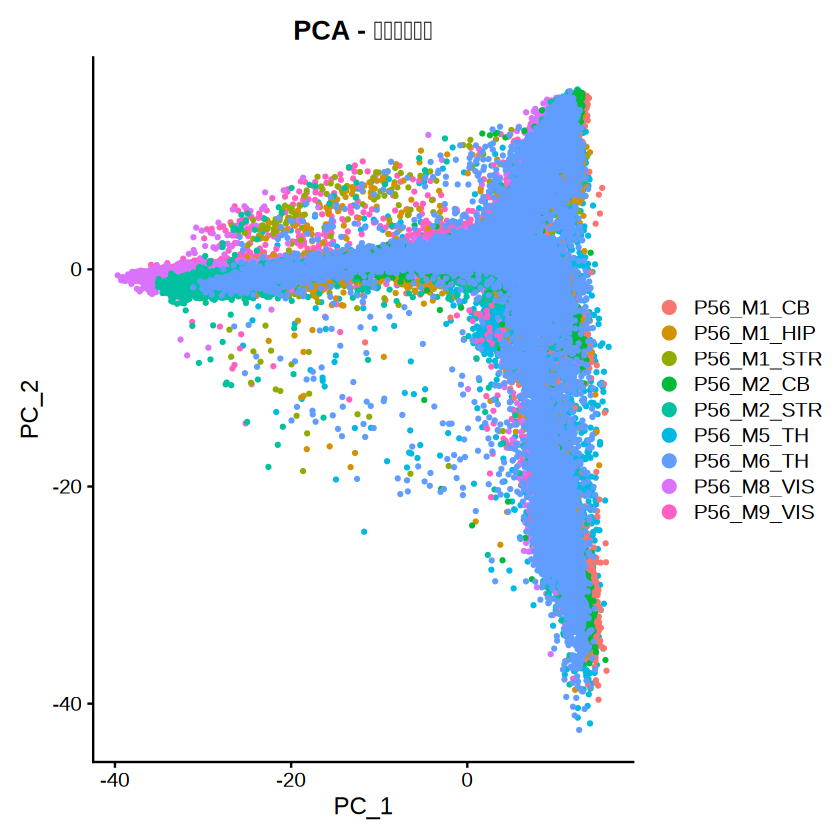

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Scaling features for provided objects

Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Different features in new layer data than already exists for scale.data”
Warning message:
“Different features in new layer

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 78928
Number of edges: 3120601

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9592
Number of communities: 44
Elapsed time: 35 seconds


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '细胞聚类结果' in 'mbcsToSbcs': dot substituted for <e7>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '细胞聚类结果' in 'mbcsToSbcs': dot substituted for <bb>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '细胞聚类结果' in 'mbcsToSbcs': dot substituted for <86>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '细胞聚类结果' in 'mbcsToSbcs': dot substituted for <e8>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '细胞聚类结果' in 'mbcsToSbcs': dot substituted for <83>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '细胞聚类结果' in 'mbcsToSbcs': dot substituted for <9e>”
Warning message in grid.Call(C_textBounds, as.graphicsAnno

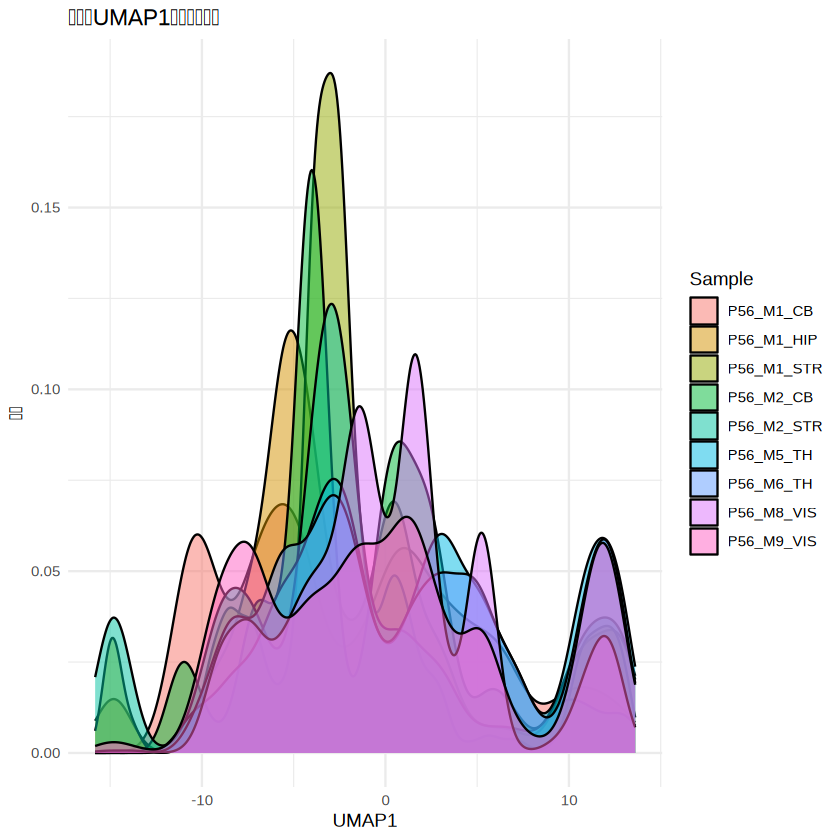

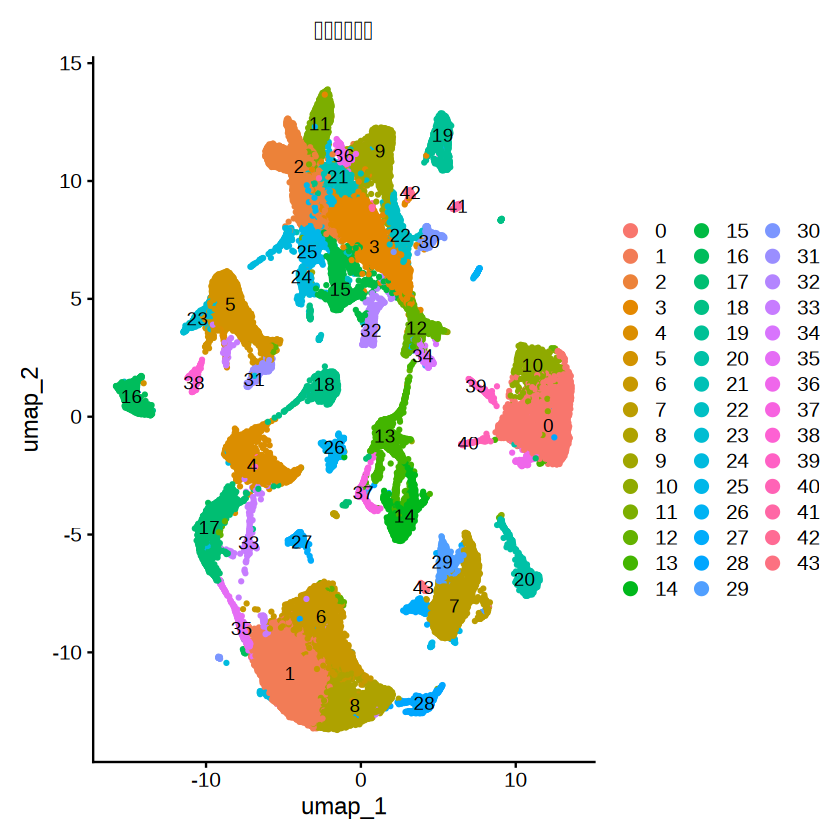

In [58]:
# 加载必要的包
library(Seurat)
library(ggplot2)
library(patchwork)
library(harmony)  # 如果需要使用Harmony方法

# 假设您的Seurat对象名为seurat_obj，批次信息存储在seurat_obj$sample中

# ==================== 1. 数据预处理 ====================
# 确保已经完成基本的数据质控和标准化
# 如果还没有，请先执行以下步骤：
# The [[ operator can add columns to object metadata. This is a great place to stash QC stats
# seurat_obj[["percent.mt"]] <- PercentageFeatureSet(seurat_obj, pattern = "^MT-")
# summary(seurat_obj[["percent.mt"]])
# # 数据标准化
# seurat_obj <- NormalizeData(seurat_obj, 
#                            normalization.method = "LogNormalize", 
#                            scale.factor = 10000)

# # 识别高变基因
# seurat_obj <- FindVariableFeatures(seurat_obj, 
#                                   selection.method = "vst", 
#                                   nfeatures = 3000)

# # 数据缩放（可在此处回归线粒体基因比例等技术因素）
# seurat_obj <- ScaleData(seurat_obj)  # 如果有线粒体基因比例

# PCA降维
seurat_obj <- RunPCA(seurat_obj, 
                    npcs = 50, 
                    verbose = FALSE)

# 检查批次效应（PCA可视化）
p1 <- DimPlot(seurat_obj, 
             reduction = "pca", 
             group.by = "sample", 
             pt.size = 0.5) +
  ggtitle("PCA - 批次效应检查")

print(p1)

# ==================== 2. 去批次处理（三种方法选择） ====================

## 方法一：Harmony（推荐，速度快，效果好）
if (!requireNamespace("harmony", quietly = TRUE)) {
  install.packages("harmony")
}
library(harmony)

seurat_harmony <- RunHarmony(seurat_obj,
                            group.by.vars = "sample",  # 批次变量
                            dims.use = 1:30,           # 使用前30个PC
                            max.iter.harmony = 50,
                            assay.use = "RNA")

# 使用Harmony降维结果进行后续分析
seurat_harmony <- RunUMAP(seurat_harmony,
                         reduction = "harmony",
                         dims = 1:30,
                         n.neighbors = 30,
                         min.dist = 0.3)

# 可视化Harmony整合结果
p_harmony <- DimPlot(seurat_harmony,
                    reduction = "umap",
                    group.by = "sample",
                    pt.size = 0.5) +
  ggtitle("Harmony去批次 - UMAP")

print(p_harmony)

## 方法二：Seurat CCA整合（适合批次差异较小的数据）
# 将数据按样本分割
seurat_list <- SplitObject(seurat_obj, split.by = "sample")

# 对每个样本独立进行标准化和找高变基因
seurat_list <- lapply(seurat_list, function(x) {
  x <- NormalizeData(x)
  x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 3000)
  return(x)
})

# 选择整合特征
features <- SelectIntegrationFeatures(object.list = seurat_list)

# 找锚点
anchors <- FindIntegrationAnchors(object.list = seurat_list,
                                 anchor.features = features,
                                 dims = 1:30)

# 整合数据
seurat_cca <- IntegrateData(anchorset = anchors,
                           dims = 1:30)

# 设置默认assay为整合后的数据
DefaultAssay(seurat_cca) <- "integrated"

# 标准化整合后的数据
seurat_cca <- ScaleData(seurat_cca, verbose = FALSE)
seurat_cca <- RunPCA(seurat_cca, npcs = 30, verbose = FALSE)
seurat_cca <- RunUMAP(seurat_cca,
                     reduction = "pca",
                     dims = 1:30)

# 可视化CCA整合结果
p_cca <- DimPlot(seurat_cca,
                reduction = "umap",
                group.by = "sample",
                pt.size = 0.5) +
  ggtitle("CCA整合 - UMAP")

print(p_cca)

## 方法三：RPCA整合（适合大量数据或细胞类型不完全重叠的情况）
# 对每个样本独立运行PCA
seurat_list_rpca <- lapply(seurat_list, function(x) {
  x <- ScaleData(x, verbose = FALSE)
  x <- RunPCA(x, features = features, verbose = FALSE)
  return(x)
})

# 使用RPCA找锚点
anchors_rpca <- FindIntegrationAnchors(object.list = seurat_list_rpca,
                                      anchor.features = features,
                                      reduction = "rpca",
                                      dims = 1:30)

# 整合数据
seurat_rpca <- IntegrateData(anchorset = anchors_rpca,
                            dims = 1:30)

# 后续分析
DefaultAssay(seurat_rpca) <- "integrated"
seurat_rpca <- ScaleData(seurat_rpca, verbose = FALSE)
seurat_rpca <- RunPCA(seurat_rpca, npcs = 30, verbose = FALSE)
seurat_rpca <- RunUMAP(seurat_rpca,
                      reduction = "pca",
                      dims = 1:30)

# 可视化RPCA整合结果
p_rpca <- DimPlot(seurat_rpca,
                 reduction = "umap",
                 group.by = "sample",
                 pt.size = 0.5) +
  ggtitle("RPCA整合 - UMAP")

print(p_rpca)

# ==================== 3. 结果比较与保存 ====================

# 比较不同方法的整合效果
comparison_plot <- (p1 + p_harmony) / (p_cca + p_rpca) +
  plot_annotation(title = "不同去批次方法效果比较",
                  theme = theme(plot.title = element_text(hjust = 0.5, size = 16)))

print(comparison_plot)

# 保存处理后的对象（以Harmony为例）
qsave(seurat_harmony, file = "seurat_harmony_integrated.qs")

# ==================== 4. 批次效应评估指标 ====================

# 计算批次混合指数（Batch Mixing Index）
# 可以使用kBET或LISI等指标定量评估批次效应去除效果
# 这里提供一个简单的可视化评估方法

# 检查UMAP中不同样本的分布重叠情况
library(ggplot2)

# 提取UMAP坐标和样本信息
umap_coords <- Embeddings(seurat_harmony, reduction = "umap")
sample_info <- seurat_harmony$sample

# 创建数据框用于绘图
plot_data <- data.frame(
  UMAP1 = umap_coords[,1],
  UMAP2 = umap_coords[,2],
  Sample = sample_info
)

# 绘制密度图查看样本分布重叠
density_plot <- ggplot(plot_data, aes(x = UMAP1, fill = Sample)) +
  geom_density(alpha = 0.5) +
  theme_minimal() +
  labs(title = "样本在UMAP1轴的分布密度",
       x = "UMAP1",
       y = "密度")

print(density_plot)

# ==================== 5. 后续分析建议 ====================

# 去批次后可以进行细胞聚类和标记基因鉴定
seurat_harmony <- FindNeighbors(seurat_harmony,
                               reduction = "harmony",
                               dims = 1:30)

seurat_harmony <- FindClusters(seurat_harmony,
                              resolution = 0.5)  # 可根据需要调整分辨率

# 可视化聚类结果
cluster_plot <- DimPlot(seurat_harmony,
                       reduction = "umap",
                       group.by = "seurat_clusters",
                       label = TRUE,
                       pt.size = 0.5) +
  ggtitle("细胞聚类结果")

print(cluster_plot)

# 保存所有可视化结果
# ggsave("batch_correction_comparison.png", comparison_plot,
#        width = 12, height = 10, dpi = 300)
# ggsave("harmony_umap.png", p_harmony,
#        width = 8, height = 6, dpi = 300)

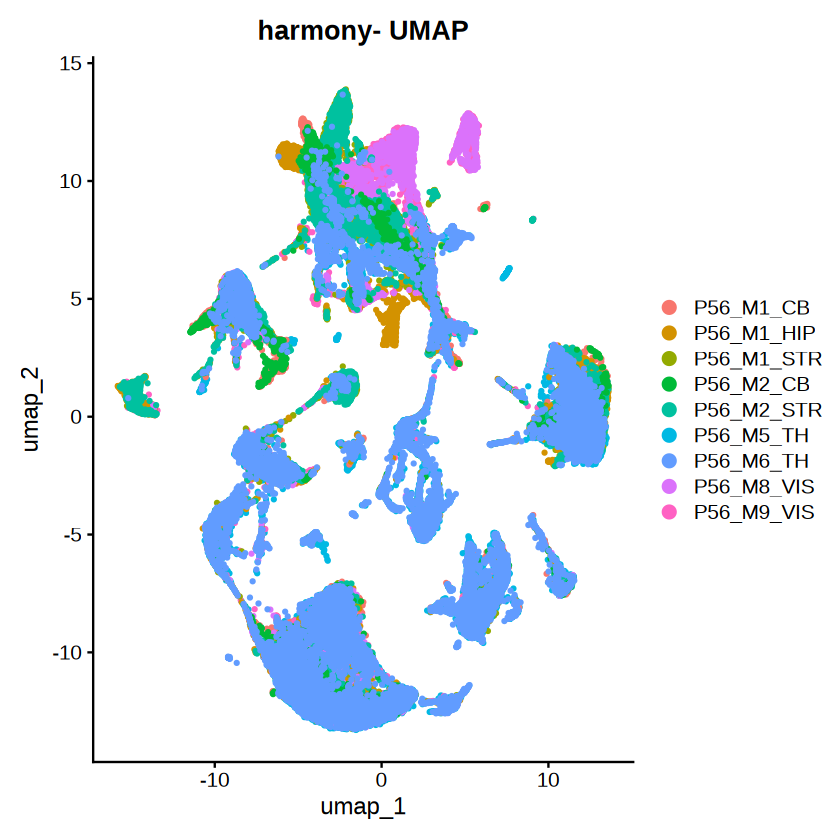

In [80]:
p_cca <- DimPlot(seurat_harmony,
                reduction = "umap",
                group.by = "sample",
                pt.size = 0.5) +
  ggtitle("harmony- UMAP")

print(p_cca)

In [83]:
qsave(seurat_harmony,file = "seurat_harmony_integrated.qs")

In [82]:
counts_rna <- seurat_harmony@assays$RNA$counts
dim(counts_rna)
integrated_data <- LayerData(seurat_harmony, assay = "RNA", layer = "data")
dim(integrated_data)
integrated_scale <- LayerData(seurat_harmony, assay = "RNA", layer = "scale.data")
dim(integrated_scale)

[1] 31053 78928

[1] 31053 78928

[1]  3000 78928

In [84]:
library(Seurat)

# 假设你的对象名为 seurat_obj
seurat_obj = seurat_harmony
# 1. 创建输出目录
dir.create("seurat_export")

# 2. 导出Metadata（细胞信息）
cell_metadata <- seurat_obj@meta.data
write.csv(cell_metadata, "seurat_export/cell_metadata.csv", row.names = TRUE)

# 3. 导出RNA assay的数据
# 获取计数矩阵（sparse matrix）
# counts_rna <- LayerData(seurat_obj, assay = "RNA", layer = "counts")
# 如果是V5，可能需要这样获取：
counts_rna <- seurat_harmony@assays$RNA$counts

# 保存为mtx格式
library(Matrix)
writeMM(counts_rna, "seurat_export/rna_counts.mtx")
# 保存特征名（基因）
writeLines(rownames(counts_rna), "seurat_export/rna_genes.txt")
# 保存细胞名（barcodes）
writeLines(colnames(counts_rna), "seurat_export/rna_barcodes.txt")

# 4. 导出integrated assay的数据
integrated_data <- LayerData(seurat_obj, assay = "RNA", layer = "data")
integrated_scale <- LayerData(seurat_obj, assay = "RNA", layer = "scale.data")

# 保存integrated data
writeMM(integrated_data, "seurat_export/integrated_data.mtx")
writeLines(rownames(integrated_data), "seurat_export/integrated_genes.txt")
writeLines(colnames(integrated_data), "seurat_export/integrated_barcodes.txt")
# writeMM(integrated_scale, "seurat_export/integrated_scale.mtx")
# 保存scale.data（注意：scale.data可能是dense matrix）
if(is(integrated_scale, "dgCMatrix")){
  writeMM(integrated_scale, "seurat_export/integrated_scale.mtx")
} else {
  writeMM(Matrix(integrated_scale, sparse = TRUE), "seurat_export/integrated_scale.mtx")
}

# 5. 导出降维结果
# PCA
pca_coords <- seurat_obj@reductions$pca@cell.embeddings
write.csv(pca_coords, "seurat_export/pca_coords.csv", row.names = TRUE)

# UMAP
umap_coords <- seurat_obj@reductions$umap@cell.embeddings
write.csv(umap_coords, "seurat_export/umap_coords.csv", row.names = TRUE)

# 6. 导出Variable Features（如果是integrated assay）
var_features <- VariableFeatures(seurat_obj, assay = "integrated")
writeLines(var_features, "seurat_export/variable_features.txt")

# 7. 保存降维的feature loading（可选）
pca_loadings <- seurat_obj@reductions$pca@feature.loadings
write.csv(pca_loadings, "seurat_export/pca_loadings.csv", row.names = TRUE)

print("导出完成！请检查seurat_export文件夹")

Warning message in dir.create("seurat_export"):
“'seurat_export' already exists”


NULL

NULL

NULL

ERROR: [1m[33mError[39m in `object[[assay]]`:[22m
[33m![39m ‘integrated’ not found in this Seurat object
 


In [85]:
pca_loadings <- seurat_obj@reductions$pca@feature.loadings
write.csv(pca_loadings, "seurat_export/pca_loadings.csv", row.names = TRUE)